# UMC 301: Applied Data Science and Artificial Intelligence
## Assignment 2

### Submission instructions:

1.   The assignment is to be submitted in ONE single notebook.
2.   Submit the .ipynb file and pdf of the same with all cells open through this Teams Assignment.
3. If your IISc email ID is < username > @iisc.ac.in, then name the file < username >_Assgn_2. E.g. jonathan_Assgn_1a for email ID jonathan@iisc.ac.in.
4. Before submission, execute the ’Restart session and run all’ option from the Runtime/Kernel tab. Verify that there are no errors and that you are getting the output you expect.
5. Use the dataset : https://www.dropbox.com/scl/fi/7m0pt1dkmwbkr3byv5r2j/face_images.zip?rlkey=r2gqsdvuyvpqqk4a7bjd9kcvv&st=nj7wl35d&dl=1
**Data Files**

**face_images** : All the face images, cropped and aligned. <br>
**face_image_bbox.csv**: Bounding box information for each image. "x_1" and "y_1" represent the upper left point coordinate of bounding box. "width" and "height" represent the width and height of bounding box. <br>
**face_image_attr.csv**: Attribute labels for each image. There are 40 attributes. "1" represents positive while "-1" represents negative.



# Question 1
Train a ResNet18 model on the above dataset to classify the "Arched_Eyebrows" attribute. Apply appropriate data pre-processing [you can use less datapoints]. Evaluate the model by calculating precision, accuracy, F1 score, ROC curve, confusion matrix, and other relevant metrics. Do experiments with different hyperparameters and discuss about results. <br>
[Note: Marks will be given based on different experiments and discussion]

### 📦 **Imports & Setup**
### We will be using the following libraries for this assignment:
- `os`, `sys`: Handling system-level tasks and file operations.
- `torch`, `torchvision`: Core libraries for deep learning and computer vision.
- `pandas`, `numpy`: For efficient data manipulation and numerical operations.
- `PIL.Image`: Image processing utilities.
- `sklearn.model_selection`: For splitting the dataset into training, validation, and test sets.
- `torch.utils.data`: To manage data loading and batching for training.
- `torch.optim.lr_scheduler`: For dynamically adjusting the learning rate during training.
- `seaborn`: For creating statistical data visualizations.
- `matplotlib.pyplot`: To plot graphs and results.
- `sklearn.metrics`: For calculating metrics like accuracy, precision, recall, and AUC.
- `torch.nn`, `torch.optim`: To define the neural network structure and optimize the training process.

All these libraries will enable us to seamlessly move from raw data to model training and performance evaluation. 🚀


In [4]:
import os
import sys
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.models import resnet50
from torchvision import models
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau, CosineAnnealingLR, CosineAnnealingWarmRestarts
from torchvision import models
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns
from sklearn.metrics import accuracy_score, f1_score, precision_score, roc_auc_score, roc_curve, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, roc_curve, auc
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, roc_curve, auc
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, roc_curve, auc

### 🗂️ **Data Directory & Label Processing**

In this block, we are setting up paths to the dataset and processing the labels. Here's a breakdown of what's happening:

1. **Directory Setup**:
   - `dir_path`: Gets the directory of the current Jupyter notebook to ensure file paths are relative to the notebook location.
   - `label_dir`: Specifies the path to the CSV file containing face image attributes.
   - `image_dir`: Specifies the path to the directory containing the face images.

2. **Load Labels**:
   - We use `pandas` to load the CSV file (`face_image_attr.csv`) that contains the image attributes.

3. **Data Cleaning**:
   - We select only the `image_id` and `Arched_Eyebrows` columns.
   - The `Arched_Eyebrows` column is then processed to convert the labels into binary values, where:
     - `1` represents images with arched eyebrows.
     - `0` represents images without arched eyebrows.

This is the first step to load and preprocess the dataset. 🖼️👁️‍🗨️


In [5]:
dir_path = os.path.dirname(os.path.realpath('UMC301_Assignment_2.ipynb'))
label_dir = os.path.join(dir_path, 'face_images/face_image_attr.csv')
image_dir = os.path.join(dir_path, 'face_images/img_align_celeba')
#Load the labels
labels = pd.read_csv(label_dir)

#Take only image_id and Arched_Eyebrows columns
labels = labels[['image_id', 'Arched_Eyebrows']]

#Change the labels to 0 and 1
labels['Arched_Eyebrows'] = labels['Arched_Eyebrows'].apply(lambda x: 1 if x == 1 else 0)

### 📊 **Train-Test Split & Data Preparation**

In this block, we perform the following:

1. **Train-Test Split**:
   - Using `train_test_split` from `sklearn`, we split the data into training and validation sets, with 80% of the data used for training and 20% for validation. This ensures our model has separate data for training and validation.

2. **Image Paths**:
   - We create two lists: `train_images` and `val_images`, each containing the file paths to the images corresponding to the training and validation sets.

3. **Label Dictionary**:
   - We create dictionaries (`train_labels` and `val_labels`) mapping each `image_id` to its corresponding label (`Arched_Eyebrows`) for both the training and validation sets.

4. **Sample Count**:
   - Finally, we print out the number of samples in both the training and validation datasets to confirm the split.

This prepares our data for model training and validation. 🔍📸


In [8]:
# Do a train test split
train, val = train_test_split(labels, test_size=0.2, random_state=42)
# Make the same for image files
train_images = [os.path.join(image_dir, image) for image in train['image_id']]
val_images = [os.path.join(image_dir, image) for image in val['image_id']]

# Make a dictionary for the labels
train_labels = dict(zip(train['image_id'], train['Arched_Eyebrows']))
val_labels = dict(zip(val['image_id'], val['Arched_Eyebrows']))

# Check the number of samples
print('Number of training samples:', len(train_images))
print('Number of validation samples:', len(val_images))

Number of training samples: 162079
Number of validation samples: 40520


### Fine-tuning a Pretrained ResNet-18 Model

In the below code, we load the pre-trained ResNet-18 model from the `torchvision` library and modify it for binary classification (e.g., for distinguishing between two classes, such as "face" vs. "not face"). The following steps are involved:

1. **Loading the Pretrained Model**:  
   We start by loading the pre-trained ResNet-18 model using `torchvision.models.resnet18(pretrained=True)`. This model is initialized with weights pre-trained on ImageNet, which helps in transfer learning.

2. **Modifying the Final Layer**:  
   The final fully connected (fc) layer of the model is replaced with a new linear layer that outputs 2 units (for the binary classification task). This is done by setting `model.fc = torch.nn.Linear(512, 2)`.

3. **Freezing Layers**:  
   All layers of the model are set to require gradients, ensuring that during backpropagation, the model updates the weights of all layers. In this case, we explicitly ensure that both the pre-trained layers and the newly added output layer are trainable by iterating through `model.parameters()` and setting `requires_grad = True`.

4. **Loss Function**:  
   We define the loss function as **Cross Entropy Loss**, which is suitable for classification tasks. It computes the difference between the predicted probabilities and the true labels.

5. **Optimizer**:  
   The Adam optimizer is chosen to update the model parameters. The optimizer is set to only update the parameters of the fully connected layer (`model.fc.parameters()`), allowing the pre-trained layers to remain unchanged if necessary.

6. **Device Setup**:  
   The model is moved to the GPU if available, otherwise it will run on the CPU.

7. **Data Transformations**:  
   The input images are transformed before feeding them into the model. This includes resizing the image to 224x224 pixels, normalizing the pixel values using ImageNet’s mean and standard deviation, and converting the image into a tensor.

8. **Creating the Dataset**:  
   We create a custom dataset class called `FaceDataset`, which inherits from `torch.utils.data.Dataset`. This class accepts image file paths, labels, and transformations. It loads the image at the given path, applies the specified transformations, and returns the transformed image and its corresponding label.

9. **Training and Validation DataLoader**:  
   After creating the dataset, we instantiate DataLoader objects for both training and validation sets. These loaders handle batching, shuffling, and parallel processing for efficient training and evaluation.

10. **Training the Model**:  
    The model is trained for a specified number of epochs. In each epoch, we perform the following steps:
    - **Forward Pass**: We pass the images through the model to obtain predictions.
    - **Loss Calculation**: The loss function computes the difference between predicted and actual labels.
    - **Backward Pass**: Gradients are calculated via backpropagation.
    - **Optimizer Step**: The optimizer updates the model's parameters based on the gradients.

    At the end of each epoch, we calculate and store the training loss and validation loss.

11. **Plotting the Losses**:  
    After training, we visualize the training and validation losses over epochs. This helps monitor the model's learning progress and detect overfitting if the validation loss starts to increase.

12. **Saving the Model**:  
    Once training is complete, we save the model's state dictionary (weights and biases) to a file for later use. This allows us to load the trained model without retraining.

13. **Evaluating the Model**:  
    We define an `evaluate_model` function to evaluate the model's performance on the validation set. It computes the model's predictions, compares them with the true labels, and calculates performance metrics such as accuracy, F1 score, precision, and confusion matrix.

14. **Accuracy and F1 Score**:  
    The model's **accuracy**, **F1 score**, and **precision** are computed using the true and predicted labels. These metrics help assess the model's classification performance.

15. **Confusion Matrix**:  
    The confusion matrix is plotted to visualize how well the model distinguishes between the two classes (e.g., true positives, false positives, true negatives, and false negatives).

16. **ROC Curve and AUC Score**:  
    The **Receiver Operating Characteristic (ROC) curve** is plotted, showing the trade-off between the true positive rate and false positive rate. The **AUC (Area Under Curve)** score is also calculated, which quantifies the model’s ability to discriminate between classes. The higher the AUC, the better the model.

### Conclusion

Fine-tuning a pre-trained model like ResNet-18 allows us to leverage transfer learning, which significantly reduces the need for large amounts of data and training time. By adapting the model's final layer for our binary classification task, training it on our dataset, and evaluating its performance using metrics like accuracy, F1 score, and ROC AUC, we can effectively classify images into the desired categories.


/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/10, Iteration 10/5065
Epoch 1/10, Iteration 20/5065
Epoch 1/10, Iteration 30/5065
Epoch 1/10, Iteration 40/5065
Epoch 1/10, Iteration 50/5065
Epoch 1/10, Iteration 60/5065
Epoch 1/10, Iteration 70/5065
Epoch 1/10, Iteration 80/5065
Epoch 1/10, Iteration 90/5065
Epoch 1/10, Iteration 100/5065
Epoch 1/10, Iteration 110/5065
Epoch 1/10, Iteration 120/5065
Epoch 1/10, Iteration 130/5065
Epoch 1/10, Iteration 140/5065
Epoch 1/10, Iteration 150/5065
Epoch 1/10, Iteration 160/5065
Epoch 1/10, Iteration 170/5065
Epoch 1/10, Iteration 180/5065
Epoch 1/10, Iteration 190/5065
Epoch 1/10, Iteration 200/5065
Epoch 1/10, Iteration 210/5065
Epoch 1/10, Iteration 220/5065
Epoch 1/10, Iteration 230/5065
Epoch 1/10, Iteration 240/5065
Epoch 1/10, Iteration 250/5065
Epoch 1/10, Iteration 260/5065
Epoch 1/10, Iteration 270/5065
Epoch 1/10, Iteration 280/5065
Epoch 1/10, Iteration 290/5065
Epoch 1/10, Iteration 300/5065
Epoch 1/10, Iteration 310/5065
Epoch 1/10, Iteration 320/5065
Epoch 1/10, Itera

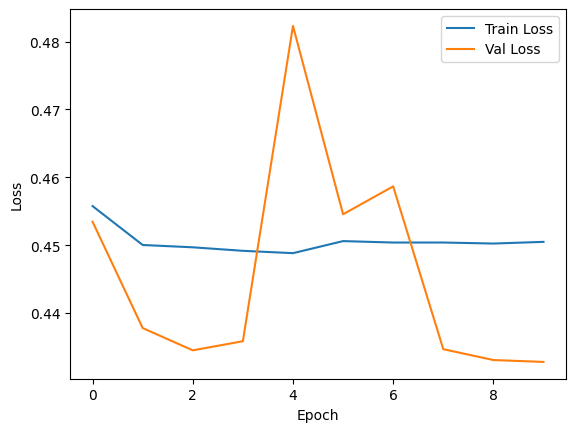

In [15]:
# Now we use fine-tuning on the ResNet-18 model
from torchvision import models

# Load the pre-trained model
model = models.resnet18(pretrained=True)

# Change the output layer
model.fc = torch.nn.Linear(512, 2)

# We train all the layers
for param in model.parameters():
    param.requires_grad = True

for param in model.fc.parameters():
    param.requires_grad = True

# Define the loss function
criterion = torch.nn.CrossEntropyLoss()

# Define the optimizer
optimizer = torch.optim.Adam(model.fc.parameters(), lr=0.001)

# Define the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define the transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Define the dataset class

class FaceDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = Image.open(self.images[idx])
        label = self.labels[self.images[idx].split('/')[-1]]
        if self.transform:
            image = self.transform(image)
        return image, label
    

# Create the datasets
train_dataset = FaceDataset(train_images, train_labels, transform)
val_dataset = FaceDataset(val_images, val_labels, transform)

# Create the dataloaders
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# Move the model to the device
model = model.to(device)

# Train the model
n_epochs = 10
train_losses = []
val_losses = []

for epoch in range(n_epochs):
    model.train()
    train_loss = 0
    
    #Need to count number of iterations
    n_iter = 0

    for images, labels in train_dataloader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        output = model(images)
        loss = criterion(output, labels)
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        n_iter += 1
        if n_iter % 10 == 0:
            print(f'Epoch {epoch + 1}/{n_epochs}, Iteration {n_iter}/{len(train_dataloader)}')

    train_loss /= n_iter
    train_losses.append(train_loss)

    model.eval()
    val_loss = 0
    n_iter = 0

    for images, labels in val_dataloader:
        images = images.to(device)
        labels = labels.to(device)

        with torch.no_grad():
            output = model(images)
            loss = criterion(output, labels)
            val_loss += loss.item()
            n_iter += 1

    val_loss /= n_iter
    val_losses.append(val_loss)

    print(f'Epoch {epoch + 1}/{n_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')

# Plot the losses
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Save the model
torch.save(model.state_dict(), 'model.pth')

# Function to evaluate metrics
def evaluate_model(model, dataloader):
    model.eval()
    all_preds = []
    all_labels = []
    
    for images, labels in dataloader:
        images = images.to(device)
        labels = labels.to(device)

        with torch.no_grad():
            output = model(images)
            preds = torch.argmax(output, dim=1)
            
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    return all_preds, all_labels

# Evaluate on validation set
val_preds, val_labels = evaluate_model(model, val_dataloader)

# Compute accuracy
accuracy = accuracy_score(val_labels, val_preds)
print(f"Accuracy: {accuracy:.4f}")

# Compute F1 score
f1 = f1_score(val_labels, val_preds)
print(f"F1 Score: {f1:.4f}")

# Compute precision
precision = precision_score(val_labels, val_preds)
print(f"Precision: {precision:.4f}")

# Compute confusion matrix
conf_matrix = confusion_matrix(val_labels, val_preds)
print("Confusion Matrix:")
print(conf_matrix)

# Plot confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# Compute ROC curve and AUC score
val_probs = torch.softmax(model(images.to(device)), dim=1).cpu().numpy()[:, 1]
fpr, tpr, _ = roc_curve(val_labels, val_probs)
roc_auc = roc_auc_score(val_labels, val_probs)

# Plot ROC curve
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

#### Going forward, we will run a few more models with different hyperparameters and discuss the results. I will load the dataset and preprocess it in each before running the code for each model, (as sometimes we need to change the data-set sizes and split ratios for different models).
#### But, it will be similar to the way we did it for the first time, so I will not repeat the same explanation for each model. Instead, I will focus on the hyperparameters and results for each model.

## Let's begin out investigation what could have cuaused this irregular loss graph


### Reasons for Unusual Train and Validation Loss Curves

When the training and validation loss curves behave unexpectedly, such as validation loss decreasing initially, followed by a sharp increase, and then decreasing again, several factors could be responsible. Below are some potential reasons:

#### Learning Rate Too High:
A high learning rate can cause the model to make large weight updates, resulting in unstable training. This could lead to a sudden drop in validation loss initially as the model learns, followed by an increase due to the model overshooting the optimal solution. The learning rate might allow the model to find a better solution later, causing the loss to decrease again. Try lowering the learning rate for more stable convergence.

#### Overfitting:
If the model starts to overfit on the training data, it can lead to an initial decrease in validation loss, but after a few epochs, the validation loss might increase as the model becomes too specific to the training data. To prevent it we can use early stopping.

#### Data Augmentation or Imbalance:
Insufficient data augmentation or highly imbalanced datasets can also cause erratic behavior in the loss curves. But given large enough data, this should not be a problem. But, may be , we can try to balance the dataset or apply more data augmentation techniques to improve model performance. 

#### Choiice of Optimizer:
Adam’s adaptability and performance on diverse tasks make it a solid choice for most neural network training processes. So, we will keep it for now.



### Let's also have a discussion on the choice of output layer and loss function for binary classification tasks, (about what we used above and if we can use something else also).

### 🎯 Model Output Layer and Loss Function Choice

In the current implementation:python
#### Change the output layer
model.fc = torch.nn.Linear(512, 2)

#### Defining the loss function
criterion = torch.nn.CrossEntropyLoss()
🧠 Explanation:

This setup is perfect for multi-class classification problems, even though we only have two classes.

The output layer produces two logits.

torch.nn.CrossEntropyLoss() automatically applies softmax, converting these logits into probabilities for each class.

This works well when we need to predict class labels directly.

🔄 Alternative Approach (Binary Classification):

Alternatively, we can modify the final layer and loss function for binary classification:
python code:

model.fc = nn.Linear(model.fc.in_features, 1)  # Output a single logit

criterion = nn.BCEWithLogitsLoss()  # Binary classification
🧠 Explanation:
Here, the output layer produces a single logit.

nn.BCEWithLogitsLoss() applies the sigmoid activation internally, converting the logit into a probability between 0 and 1.

This is commonly used for binary classification tasks where we expect a single probability.
✅ Both approaches are valid for binary classification, 
##### But the choice depends on how you plan to make predictions.


##### With CrossEntropyLoss:

The output will be two probabilities (one for each class).
We select the class with the higher probability.

##### With BCEWithLogitsLoss:

The output is a single probability.
We apply a threshold (usually 0.5) to decide between the two classes.

⚖️ Summary:
The decision between using CrossEntropyLoss or BCEWithLogitsLoss depends on whether you want to directly predict class labels or work with binary probabilities.


### Objective is to find good set of parameters for the model to perform well on validationa and more importantly on test data. 
We will experiment with various configurations to optimize our model's performance. This includes adjusting:

##### 1. **Batch Sizes** 📦
   - **Reason**: Batch size affects the model's ability to generalize and impacts training stability. Since we have a powerful GPU, we will primarily use batch sizes of **32** and **64**, and experiment with **128** also because our gpu can handle it.

   - **Batch Size 32**: This smaller batch size might help the model generalize better by exposing it to more gradient updates per epoch, it can also prevent overfitting by regularizing the training process.

   - **Batch Size 64**: Using a slightly larger batch size of 64 allows for faster training while maintaining a good balance between stability and generalization. It reduces the noisiness of gradient updates compared to batch size 32, leading to more stable learning without excessively increasing the risk of overfitting.

   - **Batch Size 128**: Though not the main focus, this larger batch size will be tested as it allows for even faster training. However, with larger batch sizes, there is a risk of overfitting, as the model may get fewer gradient updates per epoch, and the overall generalization might decrease.

   **Summary**: We will mostly experiment with **32** and **64**, and try **128** to assess training speed and stability. The unusual loss curves seen previously may have been due to using batch size **32**, as smaller batches lead to noisier gradients, causing larger parameter jumps and instability.



##### 2. **Learning Rates** ⚡
   - **Reason**: The learning rate controls how much we adjust the model weights during each step. If it’s too high, the model might overshoot the optimal point; if it’s too low, training can be too slow. By testing different learning rates, we can find the best value that helps the model converge faster without getting stuck in suboptimal solutions. Above we tried with 0.01, we will try with 0.01 and 0.001 due to computational constraints.

##### 3. **Optimizers** 🔧
   - **Reason**: **Adam** is selected as the default optimizer because it combines the advantages of both **AdaGrad** and **RMSProp**, providing an adaptive learning rate for each parameter.

#### Alternative Loss Functions 🧩
- **Reason**: **CrossEntropyLoss** and **BCEWithLogitsLoss** are commonly used in classification problems. Both are suitable for binary classification tasks, but BCEWithLogitsLoss is specifically designed for binary classification.

#### Learning Rate Schedulers 🔄
To adjust the learning rate dynamically during training, we will experiment with two different learning rate schedulers:
##### 1. **ReduceLROnPlateau** 📉
   - **Reason**: This scheduler reduces the learning rate when the validation loss stops improving, helping the model fine-tune its parameters in later stages of training.
##### 2. **Step Scheduler** 🔼
   - **Reason**: The step scheduler decreases the learning rate at specified intervals, which helps the model converge more smoothly and avoids oscillations in training.


<!-- ##### Now, let us try with scheduler (ReduceLROnPlateau) and unfreeze the last layer to see if the trend in validation loss changes and also check test accuracy and let us also plot ROC curve after each epoch to see how the model is performing.


2. **Model Architecture**
   - We use a pre-trained ResNet-18 model and modify its final layer for binary classification.
   - The majority of the network's parameters are frozen, but we fine-tune the last fully connected layer (`fc`) and the `layer4` block.

3. **Training Process**
   - Binary cross-entropy loss is used.
   - The Adam optimizer is applied with a learning rate scheduler (`ReduceLROnPlateau`).
   - Early stopping is implemented to prevent overfitting. -->

<!-- ##### 📦 Dataset Preparation

- **Transformations Applied**:
  - Resize to 224x224.
  - Random horizontal flips.
  - Random rotation up to 15 degrees.
  - Normalization.

##### Explanation of Criterion, Optimizer, and Scheduler:

- **Criterion**: `nn.BCEWithLogitsLoss()`
  - Combines Sigmoid and Binary Cross Entropy (BCE) loss. Used for binary classification tasks where the model predicts probabilities (e.g., 0 or 1).

- **Optimizer**: `optim.Adam(model.parameters(), lr=0.001)`
  - Adam optimizer adjusts learning rates for each parameter using gradient estimates. It updates model parameters with a set learning rate of 0.001.

- **Scheduler**: `optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, verbose=True)`
  - Reduces learning rate by 0.1 when monitored metric (e.g., loss) stops improving for 3 epochs. Verbose mode logs the changes. -->


## A Series of Experiments to Optimize Model Performance 🔬

The experiments will focus on testing various configurations to achieve the best model performance. Here are the configurations that will be explored:

### 🔹 **Transfer Learning (Freezing All Layers Except Final Layer):**
In this setup, **all layers** of the pre-trained ResNet-18 model are frozen, except for the final fully connected layer, which is replaced with a binary classification layer (output size of 2). This allows the model to leverage pre-trained feature extraction capabilities while focusing on learning from the new dataset for classification.  
✨ **Key aspects:**
- Initial learning rates: **0.01** and **0.001**
- Scheduler types: **step** and **plateau**

### 🔹 **Partial Unfreezing (Unfreezing the Last Two Layers):**
In this configuration, the last block (layer4) of the pre-trained ResNet-18 model is unfrozen, along with the final fully connected layer. This allows for **re-training of deeper layers** while keeping most of the model frozen to preserve pre-trained knowledge.  
✨ **Key aspects:**
- Initial learning rates: **0.01** and **0.001**
- Scheduler types: **step** and **plateau**

### 🔹 **Fine-Tuning (Taking the pre-trained weights and then trainig the entire model after changing the last layer ):**
In this setup, the **entire pre-trained ResNet-18 model** is unfrozen, allowing all layers to fine-tune based on the new dataset. This approach fully updates the weights of the network for the specific classification task.  
✨ **Key aspects:**
- Initial learning rates: **0.01** and **0.001**
- Scheduler types: **step** and **plateau**

### 🎯 **Evaluation Metrics:**
The experiments will be evaluated based on key metrics such as:
- **Training and Validation Loss**
- **Accuracy**
- **F1-score**
- **Precision**
- **Recall**
- **ROC AUC**

These metrics will help us understand model performance across different configurations and guide us in selecting the optimal one.

### **We are not using the entire dataset for these experiments due to computational constraints.**
In this setup, we will use a subset of the dataset to train and evaluate the model. We will use first 50000 images for  this code, out of which 40000 will be used for training and 10000 for validation. This will help us run the experiments efficiently while still providing meaningful insights into model performance.

In [29]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
import numpy as np

# Set the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define the dataset class
class FaceDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images  # Images is a list of paths
        self.labels = labels  # Labels should correspond to the image paths
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path = self.images[idx]
        image = Image.open(image_path)
        label = self.labels[image_path.split('/')[-1]]  # Extract label using the image filename
        if self.transform:
            image = self.transform(image)
        return image, label

# Directory paths
dir_path = os.path.dirname(os.path.realpath('UMC301_Assignment_2.ipynb'))
label_dir = os.path.join(dir_path, 'face_images/face_image_attr.csv')
image_dir = os.path.join(dir_path, 'face_images/img_align_celeba')

# Load the labels
labels_df = pd.read_csv(label_dir)

# Take only image_id and Arched_Eyebrows columns
labels_df = labels_df[['image_id', 'Arched_Eyebrows']]

# Change the labels to 0 and 1
labels_df['Arched_Eyebrows'] = labels_df['Arched_Eyebrows'].apply(lambda x: 1 if x == 1 else 0)

# Filter first 50,000 labels
labels_df = labels_df.iloc[:50000]

# Create a dictionary of labels where the keys are image filenames
labels = dict(zip(labels_df['image_id'], labels_df['Arched_Eyebrows']))

# List of image paths corresponding to the first 50,000 labels
image_paths = [os.path.join(image_dir, img) for img in labels_df['image_id']]

# Transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create datasets and dataloaders
train_dataset = FaceDataset(image_paths[:40000], labels, transform)  # First 40,000 for training
val_dataset = FaceDataset(image_paths[40000:], labels, transform)  # Remaining 10,000 for validation

train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=32, shuffle=False)

n_epochs = 20
# Function to train and evaluate the model (same as provided earlier)
def train_and_evaluate_model(model, n_epochs, optimizer, criterion, initial_lr, stage, scheduler_type='step'):
    train_losses = []
    val_losses = []
    train_accuracy = []
    val_accuracy = []
    train_f1 = []
    val_f1 = []

    if scheduler_type == 'step':
        scheduler = StepLR(optimizer, step_size=10, gamma=0.1)
    elif scheduler_type == 'plateau':
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)

    for epoch in range(n_epochs):
        model.train()
        train_loss = 0
        n_iter = 0
        all_preds_train = []
        all_labels_train = []

        for images, labels in train_dataloader:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            output = model(images)
            loss = criterion(output, labels)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            n_iter += 1

            preds_train = torch.argmax(output, dim=1).cpu().numpy()
            all_preds_train.extend(preds_train)
            all_labels_train.extend(labels.cpu().numpy())

        train_loss /= n_iter
        train_losses.append(train_loss)

        train_acc = accuracy_score(all_labels_train, all_preds_train)
        train_f1_score = f1_score(all_labels_train, all_preds_train, average='binary')

        train_accuracy.append(train_acc)
        train_f1.append(train_f1_score)

        # Validation phase
        model.eval()
        val_loss = 0
        n_iter = 0
        all_preds_val = []
        all_labels_val = []

        for images, labels in val_dataloader:
            images = images.to(device)
            labels = labels.to(device)

            with torch.no_grad():
                output = model(images)
                loss = criterion(output, labels)
                val_loss += loss.item()
                preds_val = torch.argmax(output, dim=1).cpu().numpy()

                all_preds_val.extend(preds_val)
                all_labels_val.extend(labels.cpu().numpy())

                n_iter += 1

        val_loss /= n_iter
        val_losses.append(val_loss)

        val_acc = accuracy_score(all_labels_val, all_preds_val)
        val_f1_score = f1_score(all_labels_val, all_preds_val, average='binary')

        val_accuracy.append(val_acc)
        val_f1.append(val_f1_score)

        print(f'{stage} - Epoch {epoch + 1}/{n_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}, Train F1: {train_f1_score:.4f}, Val F1: {val_f1_score:.4f}, LR: {optimizer.param_groups[0]["lr"]:.6f}')

        # Update the learning rate
        if scheduler_type == 'step':
            scheduler.step()
        elif scheduler_type == 'plateau':
            scheduler.step(val_loss)


    # Final evaluation on validation set
    conf_matrix = confusion_matrix(all_labels_val, all_preds_val)
    precision = precision_score(all_labels_val, all_preds_val)
    recall = recall_score(all_labels_val, all_preds_val)
    fpr, tpr, thresholds = roc_curve(all_labels_val, all_preds_val)
    roc_auc = auc(fpr, tpr)

    print(f'{stage} - Precision: {precision:.4f}, Recall: {recall:.4f}, AUC: {roc_auc:.4f}')
    print(f'{stage} - Confusion Matrix: \n{conf_matrix}')

    # Plot ROC curve
    # Plot and save ROC curve
    plt.figure()
    plt.plot(fpr, tpr, label=f'{stage} - ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{stage} - ROC Curve (LR: {initial_lr})')
    plt.legend(loc="lower right")
    roc_filename = f'{stage.replace(" ", "_").lower()}_roc_curve_lr_{initial_lr}_{scheduler_type}.png'
    plt.savefig(roc_filename)
    print(f"ROC Curve saved as {roc_filename}")
    plt.close()

    # Plot the losses
    plt.figure()
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title(f'{stage} - Training and Validation Loss (LR: {initial_lr})')
    loss_filename = f'{stage.replace(" ", "_").lower()}_loss_curve_lr_{initial_lr}_{scheduler_type}.png'
    plt.savefig(loss_filename)
    print(f"Loss plot saved as {loss_filename}")
    plt.close()

    # Save the model with an appropriate name
    model_name = f'model_{stage.replace(" ", "_").lower()}_lr_{initial_lr}_{scheduler_type}.pth'
    torch.save(model.state_dict(), model_name)
    print(f"Model saved as {model_name}")
# Step 1: Transfer Learning (freeze all layers except final)
def transfer_learning(initial_lr, scheduler_type='step'):
    model = models.resnet18(pretrained=True)
    for param in model.parameters():
        param.requires_grad = False
    model.fc = nn.Linear(512, 2)  # Adjust for binary classification
    model = model.to(device)

    optimizer = optim.Adam(model.fc.parameters(), lr=initial_lr)
    criterion = nn.CrossEntropyLoss()

    train_and_evaluate_model(model, 20, optimizer, criterion, initial_lr, "Transfer Learning", scheduler_type)

def unfreeze_last_two_layers(initial_lr, scheduler_type='step'):
    model = models.resnet18(pretrained=True)
    for param in model.parameters():
        param.requires_grad = False
    for param in list(model.layer4.parameters()):  # Unfreeze the last block
        param.requires_grad = True
    model.fc = nn.Linear(512, 2)
    model = model.to(device)

    optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=initial_lr)
    criterion = nn.CrossEntropyLoss()

    train_and_evaluate_model(model, 20, optimizer, criterion, initial_lr, "Unfreeze Last Two Layers", scheduler_type)

def fine_tuning(initial_lr, scheduler_type='step'):
    model = models.resnet18(pretrained=True)
    for param in model.parameters():
        param.requires_grad = True
    model.fc = nn.Linear(512, 2)
    model = model.to(device)

    optimizer = optim.Adam(model.parameters(), lr=initial_lr)
    criterion = nn.CrossEntropyLoss()

    train_and_evaluate_model(model, 20, optimizer, criterion, initial_lr, "Fine-Tuning", scheduler_type)

# Run the experiments
initial_learning_rates = [0.01, 0.001]
scheduler_types = ['step', 'plateau']

for lr in initial_learning_rates:
    for scheduler in scheduler_types:
        print(f"\nRunning Transfer Learning with initial LR: {lr} and {scheduler} scheduler")
        transfer_learning(lr, scheduler)

        print(f"\nRunning Partial Unfreezing with initial LR: {lr} and {scheduler} scheduler")
        unfreeze_last_two_layers(lr, scheduler)

        print(f"\nRunning Fine-Tuning with initial LR: {lr} and {scheduler} scheduler")
        fine_tuning(lr, scheduler)



Running Transfer Learning with initial LR: 0.01 and step scheduler


/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Transfer Learning - Epoch 1/20, Train Loss: 0.6000, Val Loss: 0.7117, Train Acc: 0.7423, Val Acc: 0.6852, Train F1: 0.4788, Val F1: 0.5768, LR: 0.010000
Transfer Learning - Epoch 2/20, Train Loss: 0.5984, Val Loss: 0.7734, Train Acc: 0.7475, Val Acc: 0.7514, Train F1: 0.4920, Val F1: 0.1368, LR: 0.010000
Transfer Learning - Epoch 3/20, Train Loss: 0.5833, Val Loss: 0.7769, Train Acc: 0.7509, Val Acc: 0.6508, Train F1: 0.4983, Val F1: 0.5714, LR: 0.010000
Transfer Learning - Epoch 4/20, Train Loss: 0.5848, Val Loss: 0.7128, Train Acc: 0.7483, Val Acc: 0.7508, Train F1: 0.4937, Val F1: 0.1347, LR: 0.010000
Transfer Learning - Epoch 5/20, Train Loss: 0.5828, Val Loss: 0.4925, Train Acc: 0.7517, Val Acc: 0.7653, Train F1: 0.5016, Val F1: 0.5780, LR: 0.010000
Transfer Learning - Epoch 6/20, Train Loss: 0.6104, Val Loss: 0.4955, Train Acc: 0.7493, Val Acc: 0.7645, Train F1: 0.4975, Val F1: 0.5964, LR: 0.010000
Transfer Learning - Epoch 7/20, Train Loss: 0.5926, Val Loss: 0.5647, Train Acc: 0

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Unfreeze Last Two Layers - Epoch 1/20, Train Loss: 0.4093, Val Loss: 0.3698, Train Acc: 0.8067, Val Acc: 0.8319, Train F1: 0.6068, Val F1: 0.6843, LR: 0.010000
Unfreeze Last Two Layers - Epoch 2/20, Train Loss: 0.3511, Val Loss: 0.3485, Train Acc: 0.8350, Val Acc: 0.8356, Train F1: 0.6734, Val F1: 0.6886, LR: 0.010000
Unfreeze Last Two Layers - Epoch 3/20, Train Loss: 0.3354, Val Loss: 0.3738, Train Acc: 0.8390, Val Acc: 0.8255, Train F1: 0.6827, Val F1: 0.5714, LR: 0.010000
Unfreeze Last Two Layers - Epoch 4/20, Train Loss: 0.3194, Val Loss: 0.3621, Train Acc: 0.8508, Val Acc: 0.8283, Train F1: 0.7119, Val F1: 0.7047, LR: 0.010000
Unfreeze Last Two Layers - Epoch 5/20, Train Loss: 0.2947, Val Loss: 0.3769, Train Acc: 0.8648, Val Acc: 0.8309, Train F1: 0.7409, Val F1: 0.6313, LR: 0.010000
Unfreeze Last Two Layers - Epoch 6/20, Train Loss: 0.2657, Val Loss: 0.4538, Train Acc: 0.8804, Val Acc: 0.7806, Train F1: 0.7713, Val F1: 0.6774, LR: 0.010000
Unfreeze Last Two Layers - Epoch 7/20, T

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Fine-Tuning - Epoch 1/20, Train Loss: 0.6038, Val Loss: 0.5917, Train Acc: 0.7322, Val Acc: 0.7376, Train F1: 0.0109, Val F1: 0.0000, LR: 0.010000
Fine-Tuning - Epoch 2/20, Train Loss: 0.5528, Val Loss: 0.5295, Train Acc: 0.7358, Val Acc: 0.7376, Train F1: 0.0237, Val F1: 0.0000, LR: 0.010000
Fine-Tuning - Epoch 3/20, Train Loss: 0.4823, Val Loss: 0.4268, Train Acc: 0.7623, Val Acc: 0.7976, Train F1: 0.3795, Val F1: 0.5284, LR: 0.010000
Fine-Tuning - Epoch 4/20, Train Loss: 0.4077, Val Loss: 0.3817, Train Acc: 0.8037, Val Acc: 0.8200, Train F1: 0.5974, Val F1: 0.6620, LR: 0.010000
Fine-Tuning - Epoch 5/20, Train Loss: 0.3698, Val Loss: 0.3551, Train Acc: 0.8248, Val Acc: 0.8343, Train F1: 0.6477, Val F1: 0.6445, LR: 0.010000
Fine-Tuning - Epoch 6/20, Train Loss: 0.3531, Val Loss: 0.3491, Train Acc: 0.8337, Val Acc: 0.8386, Train F1: 0.6697, Val F1: 0.6903, LR: 0.010000
Fine-Tuning - Epoch 7/20, Train Loss: 0.3416, Val Loss: 0.3495, Train Acc: 0.8394, Val Acc: 0.8422, Train F1: 0.6819, 

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/smehul/.local/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Transfer Learning - Epoch 1/20, Train Loss: 0.5955, Val Loss: 0.6494, Train Acc: 0.7426, Val Acc: 0.7648, Train F1: 0.4793, Val F1: 0.2538, LR: 0.010000
Transfer Learning - Epoch 2/20, Train Loss: 0.5851, Val Loss: 0.4750, Train Acc: 0.7478, Val Acc: 0.7676, Train F1: 0.4904, Val F1: 0.5718, LR: 0.010000
Transfer Learning - Epoch 3/20, Train Loss: 0.5972, Val Loss: 0.9599, Train Acc: 0.7456, Val Acc: 0.7413, Train F1: 0.4878, Val F1: 0.0300, LR: 0.010000
Transfer Learning - Epoch 4/20, Train Loss: 0.5980, Val Loss: 0.7213, Train Acc: 0.7487, Val Acc: 0.7503, Train F1: 0.4954, Val F1: 0.1351, LR: 0.010000
Transfer Learning - Epoch 5/20, Train Loss: 0.5908, Val Loss: 0.5811, Train Acc: 0.7505, Val Acc: 0.7628, Train F1: 0.4978, Val F1: 0.2724, LR: 0.010000
Transfer Learning - Epoch 6/20, Train Loss: 0.5934, Val Loss: 0.4709, Train Acc: 0.7502, Val Acc: 0.7732, Train F1: 0.4978, Val F1: 0.5371, LR: 0.010000
Transfer Learning - Epoch 7/20, Train Loss: 0.5786, Val Loss: 0.6214, Train Acc: 0

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/smehul/.local/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Unfreeze Last Two Layers - Epoch 1/20, Train Loss: 0.4039, Val Loss: 0.3528, Train Acc: 0.8095, Val Acc: 0.8359, Train F1: 0.6139, Val F1: 0.6886, LR: 0.010000
Unfreeze Last Two Layers - Epoch 2/20, Train Loss: 0.3520, Val Loss: 0.3491, Train Acc: 0.8332, Val Acc: 0.8356, Train F1: 0.6690, Val F1: 0.6322, LR: 0.010000
Unfreeze Last Two Layers - Epoch 3/20, Train Loss: 0.3367, Val Loss: 0.3661, Train Acc: 0.8405, Val Acc: 0.8281, Train F1: 0.6873, Val F1: 0.5920, LR: 0.010000
Unfreeze Last Two Layers - Epoch 4/20, Train Loss: 0.3199, Val Loss: 0.3473, Train Acc: 0.8511, Val Acc: 0.8395, Train F1: 0.7119, Val F1: 0.6548, LR: 0.010000
Unfreeze Last Two Layers - Epoch 5/20, Train Loss: 0.3000, Val Loss: 0.3610, Train Acc: 0.8602, Val Acc: 0.8361, Train F1: 0.7304, Val F1: 0.6962, LR: 0.010000
Unfreeze Last Two Layers - Epoch 6/20, Train Loss: 0.2672, Val Loss: 0.3950, Train Acc: 0.8770, Val Acc: 0.8099, Train F1: 0.7647, Val F1: 0.6848, LR: 0.010000
Unfreeze Last Two Layers - Epoch 7/20, T

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/smehul/.local/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Fine-Tuning - Epoch 1/20, Train Loss: 0.5950, Val Loss: 0.5336, Train Acc: 0.7298, Val Acc: 0.7384, Train F1: 0.0183, Val F1: 0.0136, LR: 0.010000
Fine-Tuning - Epoch 2/20, Train Loss: 0.5277, Val Loss: 0.4764, Train Acc: 0.7379, Val Acc: 0.7592, Train F1: 0.1405, Val F1: 0.5962, LR: 0.010000
Fine-Tuning - Epoch 3/20, Train Loss: 0.4268, Val Loss: 0.3936, Train Acc: 0.7908, Val Acc: 0.8104, Train F1: 0.5600, Val F1: 0.6065, LR: 0.010000
Fine-Tuning - Epoch 4/20, Train Loss: 0.3828, Val Loss: 0.3627, Train Acc: 0.8163, Val Acc: 0.8300, Train F1: 0.6248, Val F1: 0.6398, LR: 0.010000
Fine-Tuning - Epoch 5/20, Train Loss: 0.3584, Val Loss: 0.3480, Train Acc: 0.8327, Val Acc: 0.8387, Train F1: 0.6643, Val F1: 0.6897, LR: 0.010000
Fine-Tuning - Epoch 6/20, Train Loss: 0.3496, Val Loss: 0.3451, Train Acc: 0.8346, Val Acc: 0.8406, Train F1: 0.6709, Val F1: 0.6566, LR: 0.010000
Fine-Tuning - Epoch 7/20, Train Loss: 0.3403, Val Loss: 0.3435, Train Acc: 0.8410, Val Acc: 0.8418, Train F1: 0.6841, 

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Transfer Learning - Epoch 1/20, Train Loss: 0.4710, Val Loss: 0.4358, Train Acc: 0.7628, Val Acc: 0.7827, Train F1: 0.4680, Val F1: 0.5395, LR: 0.001000
Transfer Learning - Epoch 2/20, Train Loss: 0.4520, Val Loss: 0.4361, Train Acc: 0.7747, Val Acc: 0.7839, Train F1: 0.5145, Val F1: 0.5842, LR: 0.001000
Transfer Learning - Epoch 3/20, Train Loss: 0.4515, Val Loss: 0.4541, Train Acc: 0.7735, Val Acc: 0.7773, Train F1: 0.5139, Val F1: 0.3771, LR: 0.001000
Transfer Learning - Epoch 4/20, Train Loss: 0.4492, Val Loss: 0.4402, Train Acc: 0.7791, Val Acc: 0.7810, Train F1: 0.5241, Val F1: 0.5893, LR: 0.001000
Transfer Learning - Epoch 5/20, Train Loss: 0.4453, Val Loss: 0.4373, Train Acc: 0.7796, Val Acc: 0.7825, Train F1: 0.5243, Val F1: 0.5787, LR: 0.001000
Transfer Learning - Epoch 6/20, Train Loss: 0.4467, Val Loss: 0.4789, Train Acc: 0.7792, Val Acc: 0.7589, Train F1: 0.5265, Val F1: 0.6163, LR: 0.001000
Transfer Learning - Epoch 7/20, Train Loss: 0.4487, Val Loss: 0.4315, Train Acc: 0

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Unfreeze Last Two Layers - Epoch 1/20, Train Loss: 0.3839, Val Loss: 0.3584, Train Acc: 0.8138, Val Acc: 0.8355, Train F1: 0.6224, Val F1: 0.6422, LR: 0.001000
Unfreeze Last Two Layers - Epoch 2/20, Train Loss: 0.3424, Val Loss: 0.3432, Train Acc: 0.8380, Val Acc: 0.8391, Train F1: 0.6809, Val F1: 0.6862, LR: 0.001000
Unfreeze Last Two Layers - Epoch 3/20, Train Loss: 0.3183, Val Loss: 0.3515, Train Acc: 0.8514, Val Acc: 0.8347, Train F1: 0.7112, Val F1: 0.6521, LR: 0.001000
Unfreeze Last Two Layers - Epoch 4/20, Train Loss: 0.2831, Val Loss: 0.3855, Train Acc: 0.8701, Val Acc: 0.8323, Train F1: 0.7494, Val F1: 0.6626, LR: 0.001000
Unfreeze Last Two Layers - Epoch 5/20, Train Loss: 0.2194, Val Loss: 0.4346, Train Acc: 0.9046, Val Acc: 0.8227, Train F1: 0.8188, Val F1: 0.5960, LR: 0.001000
Unfreeze Last Two Layers - Epoch 6/20, Train Loss: 0.1384, Val Loss: 0.5703, Train Acc: 0.9437, Val Acc: 0.8193, Train F1: 0.8932, Val F1: 0.6061, LR: 0.001000
Unfreeze Last Two Layers - Epoch 7/20, T

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Fine-Tuning - Epoch 1/20, Train Loss: 0.3801, Val Loss: 0.3328, Train Acc: 0.8215, Val Acc: 0.8475, Train F1: 0.6423, Val F1: 0.7030, LR: 0.001000
Fine-Tuning - Epoch 2/20, Train Loss: 0.3435, Val Loss: 0.3402, Train Acc: 0.8388, Val Acc: 0.8433, Train F1: 0.6844, Val F1: 0.6957, LR: 0.001000
Fine-Tuning - Epoch 3/20, Train Loss: 0.3347, Val Loss: 0.3444, Train Acc: 0.8431, Val Acc: 0.8400, Train F1: 0.6918, Val F1: 0.7091, LR: 0.001000
Fine-Tuning - Epoch 4/20, Train Loss: 0.3212, Val Loss: 0.3369, Train Acc: 0.8504, Val Acc: 0.8449, Train F1: 0.7093, Val F1: 0.6867, LR: 0.001000
Fine-Tuning - Epoch 5/20, Train Loss: 0.3101, Val Loss: 0.3353, Train Acc: 0.8558, Val Acc: 0.8466, Train F1: 0.7216, Val F1: 0.6860, LR: 0.001000
Fine-Tuning - Epoch 6/20, Train Loss: 0.2959, Val Loss: 0.3444, Train Acc: 0.8627, Val Acc: 0.8476, Train F1: 0.7371, Val F1: 0.7127, LR: 0.001000
Fine-Tuning - Epoch 7/20, Train Loss: 0.2703, Val Loss: 0.3499, Train Acc: 0.8748, Val Acc: 0.8420, Train F1: 0.7625, 

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/smehul/.local/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Transfer Learning - Epoch 1/20, Train Loss: 0.4697, Val Loss: 0.4356, Train Acc: 0.7621, Val Acc: 0.7840, Train F1: 0.4650, Val F1: 0.5163, LR: 0.001000
Transfer Learning - Epoch 2/20, Train Loss: 0.4528, Val Loss: 0.4767, Train Acc: 0.7756, Val Acc: 0.7602, Train F1: 0.5151, Val F1: 0.6113, LR: 0.001000
Transfer Learning - Epoch 3/20, Train Loss: 0.4493, Val Loss: 0.4311, Train Acc: 0.7775, Val Acc: 0.7875, Train F1: 0.5212, Val F1: 0.5533, LR: 0.001000
Transfer Learning - Epoch 4/20, Train Loss: 0.4478, Val Loss: 0.4335, Train Acc: 0.7778, Val Acc: 0.7845, Train F1: 0.5213, Val F1: 0.4952, LR: 0.001000
Transfer Learning - Epoch 5/20, Train Loss: 0.4484, Val Loss: 0.4551, Train Acc: 0.7776, Val Acc: 0.7761, Train F1: 0.5246, Val F1: 0.3793, LR: 0.001000
Transfer Learning - Epoch 6/20, Train Loss: 0.4457, Val Loss: 0.4332, Train Acc: 0.7785, Val Acc: 0.7847, Train F1: 0.5261, Val F1: 0.5564, LR: 0.001000
Transfer Learning - Epoch 7/20, Train Loss: 0.4462, Val Loss: 0.4396, Train Acc: 0

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/smehul/.local/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Unfreeze Last Two Layers - Epoch 1/20, Train Loss: 0.3840, Val Loss: 0.3567, Train Acc: 0.8163, Val Acc: 0.8300, Train F1: 0.6291, Val F1: 0.6355, LR: 0.001000
Unfreeze Last Two Layers - Epoch 2/20, Train Loss: 0.3442, Val Loss: 0.3490, Train Acc: 0.8373, Val Acc: 0.8333, Train F1: 0.6806, Val F1: 0.6366, LR: 0.001000
Unfreeze Last Two Layers - Epoch 3/20, Train Loss: 0.3172, Val Loss: 0.3603, Train Acc: 0.8516, Val Acc: 0.8303, Train F1: 0.7114, Val F1: 0.6787, LR: 0.001000
Unfreeze Last Two Layers - Epoch 4/20, Train Loss: 0.2815, Val Loss: 0.3895, Train Acc: 0.8719, Val Acc: 0.8330, Train F1: 0.7537, Val F1: 0.6969, LR: 0.001000
Unfreeze Last Two Layers - Epoch 5/20, Train Loss: 0.2167, Val Loss: 0.4485, Train Acc: 0.9064, Val Acc: 0.8168, Train F1: 0.8216, Val F1: 0.6610, LR: 0.001000
Unfreeze Last Two Layers - Epoch 6/20, Train Loss: 0.1354, Val Loss: 0.5753, Train Acc: 0.9444, Val Acc: 0.8198, Train F1: 0.8945, Val F1: 0.6336, LR: 0.001000
Unfreeze Last Two Layers - Epoch 7/20, T

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/smehul/.local/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Fine-Tuning - Epoch 1/20, Train Loss: 0.3756, Val Loss: 0.3616, Train Acc: 0.8250, Val Acc: 0.8353, Train F1: 0.6453, Val F1: 0.7139, LR: 0.001000
Fine-Tuning - Epoch 2/20, Train Loss: 0.3448, Val Loss: 0.3544, Train Acc: 0.8403, Val Acc: 0.8359, Train F1: 0.6824, Val F1: 0.6359, LR: 0.001000
Fine-Tuning - Epoch 3/20, Train Loss: 0.3329, Val Loss: 0.3383, Train Acc: 0.8465, Val Acc: 0.8445, Train F1: 0.6988, Val F1: 0.6760, LR: 0.001000
Fine-Tuning - Epoch 4/20, Train Loss: 0.3240, Val Loss: 0.3309, Train Acc: 0.8507, Val Acc: 0.8476, Train F1: 0.7089, Val F1: 0.6988, LR: 0.001000
Fine-Tuning - Epoch 5/20, Train Loss: 0.3114, Val Loss: 0.3482, Train Acc: 0.8552, Val Acc: 0.8455, Train F1: 0.7196, Val F1: 0.6705, LR: 0.001000
Fine-Tuning - Epoch 6/20, Train Loss: 0.2973, Val Loss: 0.3419, Train Acc: 0.8631, Val Acc: 0.8473, Train F1: 0.7359, Val F1: 0.7150, LR: 0.001000
Fine-Tuning - Epoch 7/20, Train Loss: 0.2740, Val Loss: 0.3595, Train Acc: 0.8729, Val Acc: 0.8291, Train F1: 0.7588, 

#### Here, are the results of training the model with different configurations and hyperparameters:
#### From the name of the model we can understand the configuration used for training the model.
#### For example, model name "model_transfer_learning_0.01_plateau" means the model was trained using transfer learning with initial learning rate 0.01 and ReduceLROnPlateau scheduler.

#### Now, the following are the results of the 12 experiments conducted along with the Accuracy, F1 Score, Precision, Recall, and AUC values for each experiment.

# Model Results Summary

#### Transfer Learning Model (LR: 0.01, Step)
- **Accuracy**: 78%
- **F1 Score**: 53%
- **Precision**: 0.5310
- **Recall**: 0.7107
- **AUC**: 0.7437

#### Unfreezing Last Two Layers Model (LR: 0.01, Step)
- **Train Accuracy**: 99.9%
- **Validation Accuracy**: 82.2%
- **Train F1 Score**: 0.998
- **Validation F1 Score**: 0.644
- **Precision**: 0.678
- **Recall**: 0.613
- **AUC**: 0.755

#### Fine-Tuning Model (LR: 0.01, Step)
- **Train Accuracy**: 92.85%
- **Validation Accuracy**: 83.36%
- **Train F1 Score**: 0.868
- **Validation F1 Score**: 0.672
- **Precision**: 0.696
- **Recall**: 0.650
- **AUC**: 0.774

#### Transfer Learning Model (LR: 0.01, Plateau)
- **Accuracy**: 78.4%
- **F1 Score**: 56.2%
- **Precision**: 60.2%
- **Recall**: 52.7%
- **AUC**: 70.1%

#### Unfreezing Last Two Layers Model (LR: 0.01, Plateau)
- **Train Accuracy**: 99.94%
- **Validation Accuracy**: 82.28%
- **Train F1 Score**: 99.89%
- **Validation F1 Score**: 64.14%
- **Precision**: 0.6838
- **Recall**: 0.6040
- **AUC**: 0.7523

#### Fine-Tuning Model (LR: 0.01, Plateau)
- **Train Accuracy**: 97.4%
- **Validation Accuracy**: 82.7%
- **Train F1 Score**: 0.95
- **Validation F1 Score**: 0.66
- **Precision**: 0.6864
- **Recall**: 0.6280
- **AUC**: 0.7630

#### Transfer Learning Model (LR: 0.001, Step)
- **Train Accuracy**: 78.7%
- **Validation Accuracy**: 78.6%
- **Train F1 Score**: 0.54
- **Validation F1 Score**: 0.51
- **Precision**: 0.6385
- **Recall**: 0.4261
- **AUC**: 0.6701

#### Unfreezing Last Two Layers Model (LR: 0.001, Step)
- **Train Accuracy**: 99.99%
- **Validation Accuracy**: 82.42%
- **Train F1 Score**: 0.9998
- **Validation F1 Score**: 0.6541
- **Precision**: 0.6762
- **Recall**: 0.6334
- **AUC**: 0.7627

#### Fine-Tuning Model (LR: 0.001, Step)
- **Train Accuracy**: 99.9%
- **Validation Accuracy**: 83.6%
- **Train F1 Score**: 99.9%
- **Validation F1 Score**: 69.8%
- **Precision**: 0.6748
- **Recall**: 0.7237
- **AUC**: 0.7998

#### Transfer Learning Model (LR: 0.001, Plateau)
- **Train Accuracy**: 78.8%
- **Validation Accuracy**: 78.6%
- **Train F1 Score**: 0.54
- **Validation F1 Score**: 0.52
- **Precision**: 0.6329
- **Recall**: 0.4364
- **AUC**: 0.6732

#### Unfreezing Last Two Layers Model (LR: 0.001, Plateau)
- **Train Accuracy**: 100%
- **Validation Accuracy**: 82.02%
- **Train F1 Score**: 1.0
- **Validation F1 Score**: 0.64
- **Precision**: 0.6763
- **Recall**: 0.6037
- **AUC**: 0.7504

#### Fine-Tuning Model (LR: 0.001, Plateau)
- **Train Accuracy**: 99.99%
- **Validation Accuracy**: 83.26%
- **Train F1 Score**: 0.9999
- **Validation F1 Score**: 0.6715
- **Precision**: 0.6922
- **Recall**: 0.6521
- **AUC**: 0.7744




### We will do the again set of these 12 experiments with batch size 64 instead of 32 and see if the results are better or not.

In [19]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
import numpy as np
from torch.optim.lr_scheduler import StepLR
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Set the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define the dataset class
class FaceDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images  # Images is a list of paths
        self.labels = labels  # Labels should correspond to the image paths
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path = self.images[idx]
        image = Image.open(image_path)
        label = self.labels[image_path.split('/')[-1]]  # Extract label using the image filename
        if self.transform:
            image = self.transform(image)
        return image, label

# Directory paths
dir_path = os.path.dirname(os.path.realpath('UMC301_Assignment_2.ipynb'))
label_dir = os.path.join(dir_path, 'face_images/face_image_attr.csv')
image_dir = os.path.join(dir_path, 'face_images/img_align_celeba')

# Load the labels
labels_df = pd.read_csv(label_dir)

# Take only image_id and Arched_Eyebrows columns
labels_df = labels_df[['image_id', 'Arched_Eyebrows']]

# Change the labels to 0 and 1
labels_df['Arched_Eyebrows'] = labels_df['Arched_Eyebrows'].apply(lambda x: 1 if x == 1 else 0)

# Filter first 50,000 labels
labels_df = labels_df.iloc[:50000]

# Create a dictionary of labels where the keys are image filenames
labels = dict(zip(labels_df['image_id'], labels_df['Arched_Eyebrows']))

# List of image paths corresponding to the first 50,000 labels
image_paths = [os.path.join(image_dir, img) for img in labels_df['image_id']]

# Transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create datasets and dataloaders
train_dataset = FaceDataset(image_paths[:40000], labels, transform)  # First 40,000 for training
val_dataset = FaceDataset(image_paths[40000:], labels, transform)  # Remaining 10,000 for validation

train_dataloader = DataLoader(train_dataset, batch_size=64, shuffle=False)
val_dataloader = DataLoader(val_dataset, batch_size=64, shuffle=False)

n_epochs = 20
def train_and_evaluate_model(model, n_epochs, optimizer, criterion, initial_lr, stage, scheduler_type='step'):
    train_losses = []
    val_losses = []
    train_accuracy = []
    val_accuracy = []
    train_f1 = []
    val_f1 = []

    if scheduler_type == 'step':
        scheduler = StepLR(optimizer, step_size=10, gamma=0.1)
    elif scheduler_type == 'plateau':
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)

    for epoch in range(n_epochs):
        model.train()
        train_loss = 0
        n_iter = 0
        all_preds_train = []
        all_labels_train = []

        for images, labels in train_dataloader:
            images = images.to(device)
            labels = labels.to(device).view(-1, 1)  # Reshape labels to match output shape

            optimizer.zero_grad()
            output = model(images)
            loss = criterion(output, labels.float())  # Ensure labels are float
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            n_iter += 1

            # Detach the tensor from the computation graph before calling .numpy()
            preds_train = torch.sigmoid(output).detach().cpu().numpy() > 0.5  # Use sigmoid for binary classification
            all_preds_train.extend(preds_train)
            all_labels_train.extend(labels.cpu().numpy())

        train_loss /= n_iter
        train_losses.append(train_loss)

        train_acc = accuracy_score(all_labels_train, all_preds_train)
        train_f1_score = f1_score(all_labels_train, all_preds_train, average='binary')

        train_accuracy.append(train_acc)
        train_f1.append(train_f1_score)

        # Validation phase
        model.eval()
        val_loss = 0
        n_iter = 0
        all_preds_val = []
        all_labels_val = []

        for images, labels in val_dataloader:
            images = images.to(device)
            labels = labels.to(device).view(-1, 1)  # Reshape labels to match output shape

            with torch.no_grad():
                output = model(images)
                loss = criterion(output, labels.float())  # Ensure labels are float
                val_loss += loss.item()

                # Detach the tensor from the computation graph before calling .numpy()
                preds_val = torch.sigmoid(output).detach().cpu().numpy() > 0.5  # Use sigmoid for binary classification

                all_preds_val.extend(preds_val)
                all_labels_val.extend(labels.cpu().numpy())

                n_iter += 1

        val_loss /= n_iter
        val_losses.append(val_loss)

        val_acc = accuracy_score(all_labels_val, all_preds_val)
        val_f1_score = f1_score(all_labels_val, all_preds_val, average='binary')

        val_accuracy.append(val_acc)
        val_f1.append(val_f1_score)

        print(f'{stage} - Epoch {epoch + 1}/{n_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}, Train F1: {train_f1_score:.4f}, Val F1: {val_f1_score:.4f}, LR: {optimizer.param_groups[0]["lr"]:.6f}')

        # Update the learning rate
        if scheduler_type == 'step':
            scheduler.step()
        elif scheduler_type == 'plateau':
            scheduler.step(val_loss)

    # Final evaluation on validation set
    conf_matrix = confusion_matrix(all_labels_val, all_preds_val)
    precision = precision_score(all_labels_val, all_preds_val)
    recall = recall_score(all_labels_val, all_preds_val)
    fpr, tpr, thresholds = roc_curve(all_labels_val, all_preds_val)
    roc_auc = auc(fpr, tpr)

    print(f'{stage} - Precision: {precision:.4f}, Recall: {recall:.4f}, AUC: {roc_auc:.4f}')
    print(f'{stage} - Confusion Matrix: \n{conf_matrix}')

    # Plot ROC curve
    plt.figure()
    plt.plot(fpr, tpr, label=f'{stage} - ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{stage} - ROC Curve (LR: {initial_lr})')
    plt.legend(loc="lower right")
    roc_filename = f'{stage.replace(" ", "_").lower()}_roc_curve_lr_{initial_lr}_{scheduler_type}.png'
    plt.savefig(roc_filename)
    print(f"ROC Curve saved as {roc_filename}")
    plt.close()

    # Plot the losses
    plt.figure()
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title(f'{stage} - Training and Validation Loss (LR: {initial_lr})')
    loss_filename = f'{stage.replace(" ", "_").lower()}_loss_curve_lr_{initial_lr}_{scheduler_type}.png'
    plt.savefig(loss_filename)
    print(f"Loss plot saved as {loss_filename}")
    plt.close()

    # Save the model with an appropriate name
    model_name = f'64_BCE_model_{stage.replace(" ", "_").lower()}_lr_{initial_lr}_{scheduler_type}.pth'
    torch.save(model.state_dict(), model_name)
    print(f"Model saved as {model_name}")

# Step 1: Transfer Learning (freeze all layers except final)
def transfer_learning(initial_lr, scheduler_type='step'):
    model = models.resnet18(pretrained=True)
    for param in model.parameters():
        param.requires_grad = False
    model.fc = nn.Linear(512, 1)  # Adjust for binary classification
    model = model.to(device)

    optimizer = optim.Adam(model.fc.parameters(), lr=initial_lr)
    criterion = nn.BCEWithLogitsLoss()

    train_and_evaluate_model(model, 20, optimizer, criterion, initial_lr, "Transfer Learning", scheduler_type)

def unfreeze_last_two_layers(initial_lr, scheduler_type='step'):
    model = models.resnet18(pretrained=True)
    for param in model.parameters():
        param.requires_grad = False
    for param in list(model.layer4.parameters()):  # Unfreeze the last block
        param.requires_grad = True
    model.fc = nn.Linear(512, 1)  # Adjust for binary classification
    model = model.to(device)

    optimizer = optim.Adam(model.parameters(), lr=initial_lr)
    criterion = nn.BCEWithLogitsLoss()

    train_and_evaluate_model(model, 20, optimizer, criterion, initial_lr, "Unfreeze Last Two Layers", scheduler_type)

def fine_tuning(initial_lr, scheduler_type='step'):
    model = models.resnet18(pretrained=True)
    for param in model.parameters():
        param.requires_grad = True
    model.fc = nn.Linear(512, 1)
    model = model.to(device)

    optimizer = optim.Adam(model.parameters(), lr=initial_lr)
    criterion = nn.BCEWithLogitsLoss()

    train_and_evaluate_model(model, 20, optimizer, criterion, initial_lr, "Fine-Tuning", scheduler_type)

# Run the experiments
initial_learning_rates = [0.01, 0.001]
scheduler_types = ['step', 'plateau']

for lr in initial_learning_rates:
    for scheduler in scheduler_types:
        print(f"\nRunning Transfer Learning with initial LR: {lr} and {scheduler} scheduler")
        transfer_learning(lr, scheduler)

        print(f"\nRunning Partial Unfreezing with initial LR: {lr} and {scheduler} scheduler")
        unfreeze_last_two_layers(lr, scheduler)

        print(f"\nRunning Fine-Tuning with initial LR: {lr} and {scheduler} scheduler")
        fine_tuning(lr, scheduler)



Running Transfer Learning with initial LR: 0.01 and step scheduler


/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Transfer Learning - Epoch 1/20, Train Loss: 0.4894, Val Loss: 0.4363, Train Acc: 0.7588, Val Acc: 0.7854, Train F1: 0.4863, Val F1: 0.4943, LR: 0.010000
Transfer Learning - Epoch 2/20, Train Loss: 0.4778, Val Loss: 0.4365, Train Acc: 0.7657, Val Acc: 0.7854, Train F1: 0.5088, Val F1: 0.5005, LR: 0.010000
Transfer Learning - Epoch 3/20, Train Loss: 0.4766, Val Loss: 0.4369, Train Acc: 0.7673, Val Acc: 0.7857, Train F1: 0.5138, Val F1: 0.5034, LR: 0.010000
Transfer Learning - Epoch 4/20, Train Loss: 0.4762, Val Loss: 0.4374, Train Acc: 0.7675, Val Acc: 0.7849, Train F1: 0.5145, Val F1: 0.5024, LR: 0.010000
Transfer Learning - Epoch 5/20, Train Loss: 0.4760, Val Loss: 0.4378, Train Acc: 0.7681, Val Acc: 0.7855, Train F1: 0.5156, Val F1: 0.5052, LR: 0.010000
Transfer Learning - Epoch 6/20, Train Loss: 0.4759, Val Loss: 0.4381, Train Acc: 0.7681, Val Acc: 0.7857, Train F1: 0.5154, Val F1: 0.5066, LR: 0.010000
Transfer Learning - Epoch 7/20, Train Loss: 0.4758, Val Loss: 0.4384, Train Acc: 0

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Unfreeze Last Two Layers - Epoch 1/20, Train Loss: 0.3909, Val Loss: 0.3563, Train Acc: 0.8134, Val Acc: 0.8358, Train F1: 0.6210, Val F1: 0.6526, LR: 0.010000
Unfreeze Last Two Layers - Epoch 2/20, Train Loss: 0.3450, Val Loss: 0.3483, Train Acc: 0.8353, Val Acc: 0.8406, Train F1: 0.6751, Val F1: 0.6861, LR: 0.010000
Unfreeze Last Two Layers - Epoch 3/20, Train Loss: 0.3221, Val Loss: 0.3662, Train Acc: 0.8464, Val Acc: 0.8370, Train F1: 0.7007, Val F1: 0.6566, LR: 0.010000
Unfreeze Last Two Layers - Epoch 4/20, Train Loss: 0.2960, Val Loss: 0.3801, Train Acc: 0.8599, Val Acc: 0.8298, Train F1: 0.7306, Val F1: 0.6268, LR: 0.010000
Unfreeze Last Two Layers - Epoch 5/20, Train Loss: 0.2612, Val Loss: 0.4069, Train Acc: 0.8780, Val Acc: 0.8234, Train F1: 0.7680, Val F1: 0.6102, LR: 0.010000
Unfreeze Last Two Layers - Epoch 6/20, Train Loss: 0.2216, Val Loss: 0.4061, Train Acc: 0.9000, Val Acc: 0.8198, Train F1: 0.8104, Val F1: 0.6235, LR: 0.010000
Unfreeze Last Two Layers - Epoch 7/20, T

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Fine-Tuning - Epoch 1/20, Train Loss: 0.5926, Val Loss: 0.5968, Train Acc: 0.7335, Val Acc: 0.7376, Train F1: 0.0078, Val F1: 0.0000, LR: 0.010000
Fine-Tuning - Epoch 2/20, Train Loss: 0.5329, Val Loss: 0.5431, Train Acc: 0.7352, Val Acc: 0.7368, Train F1: 0.0834, Val F1: 0.1174, LR: 0.010000
Fine-Tuning - Epoch 3/20, Train Loss: 0.4276, Val Loss: 0.3879, Train Acc: 0.7876, Val Acc: 0.8192, Train F1: 0.5600, Val F1: 0.6035, LR: 0.010000
Fine-Tuning - Epoch 4/20, Train Loss: 0.3647, Val Loss: 0.3847, Train Acc: 0.8267, Val Acc: 0.8137, Train F1: 0.6528, Val F1: 0.5385, LR: 0.010000
Fine-Tuning - Epoch 5/20, Train Loss: 0.3460, Val Loss: 0.3538, Train Acc: 0.8376, Val Acc: 0.8320, Train F1: 0.6776, Val F1: 0.6140, LR: 0.010000
Fine-Tuning - Epoch 6/20, Train Loss: 0.3347, Val Loss: 0.3430, Train Acc: 0.8412, Val Acc: 0.8370, Train F1: 0.6871, Val F1: 0.6483, LR: 0.010000
Fine-Tuning - Epoch 7/20, Train Loss: 0.3253, Val Loss: 0.3460, Train Acc: 0.8448, Val Acc: 0.8405, Train F1: 0.6956, 

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/smehul/.local/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Transfer Learning - Epoch 1/20, Train Loss: 0.4893, Val Loss: 0.4357, Train Acc: 0.7590, Val Acc: 0.7854, Train F1: 0.4877, Val F1: 0.5002, LR: 0.010000
Transfer Learning - Epoch 2/20, Train Loss: 0.4779, Val Loss: 0.4358, Train Acc: 0.7660, Val Acc: 0.7846, Train F1: 0.5087, Val F1: 0.5016, LR: 0.010000
Transfer Learning - Epoch 3/20, Train Loss: 0.4766, Val Loss: 0.4364, Train Acc: 0.7672, Val Acc: 0.7845, Train F1: 0.5132, Val F1: 0.5033, LR: 0.010000
Transfer Learning - Epoch 4/20, Train Loss: 0.4761, Val Loss: 0.4369, Train Acc: 0.7675, Val Acc: 0.7855, Train F1: 0.5142, Val F1: 0.5054, LR: 0.010000
Transfer Learning - Epoch 5/20, Train Loss: 0.4759, Val Loss: 0.4375, Train Acc: 0.7680, Val Acc: 0.7855, Train F1: 0.5154, Val F1: 0.5061, LR: 0.010000
Transfer Learning - Epoch 6/20, Train Loss: 0.4758, Val Loss: 0.4379, Train Acc: 0.7684, Val Acc: 0.7856, Train F1: 0.5162, Val F1: 0.5067, LR: 0.010000
Transfer Learning - Epoch 7/20, Train Loss: 0.4758, Val Loss: 0.4382, Train Acc: 0

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/smehul/.local/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Unfreeze Last Two Layers - Epoch 1/20, Train Loss: 0.3951, Val Loss: 0.3550, Train Acc: 0.8113, Val Acc: 0.8295, Train F1: 0.6178, Val F1: 0.6280, LR: 0.010000
Unfreeze Last Two Layers - Epoch 2/20, Train Loss: 0.3443, Val Loss: 0.3496, Train Acc: 0.8360, Val Acc: 0.8382, Train F1: 0.6774, Val F1: 0.6684, LR: 0.010000
Unfreeze Last Two Layers - Epoch 3/20, Train Loss: 0.3214, Val Loss: 0.3543, Train Acc: 0.8469, Val Acc: 0.8369, Train F1: 0.7034, Val F1: 0.6743, LR: 0.010000
Unfreeze Last Two Layers - Epoch 4/20, Train Loss: 0.2948, Val Loss: 0.3675, Train Acc: 0.8612, Val Acc: 0.8306, Train F1: 0.7355, Val F1: 0.6811, LR: 0.010000
Unfreeze Last Two Layers - Epoch 5/20, Train Loss: 0.2598, Val Loss: 0.4210, Train Acc: 0.8778, Val Acc: 0.8266, Train F1: 0.7693, Val F1: 0.6538, LR: 0.010000
Unfreeze Last Two Layers - Epoch 6/20, Train Loss: 0.2254, Val Loss: 0.5108, Train Acc: 0.8974, Val Acc: 0.8221, Train F1: 0.8065, Val F1: 0.6039, LR: 0.010000
Unfreeze Last Two Layers - Epoch 7/20, T

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/smehul/.local/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Fine-Tuning - Epoch 1/20, Train Loss: 0.5696, Val Loss: 0.5954, Train Acc: 0.7324, Val Acc: 0.7386, Train F1: 0.0362, Val F1: 0.0173, LR: 0.010000
Fine-Tuning - Epoch 2/20, Train Loss: 0.4436, Val Loss: 0.4263, Train Acc: 0.7833, Val Acc: 0.7988, Train F1: 0.5292, Val F1: 0.5592, LR: 0.010000
Fine-Tuning - Epoch 3/20, Train Loss: 0.3950, Val Loss: 0.3828, Train Acc: 0.8104, Val Acc: 0.8189, Train F1: 0.6120, Val F1: 0.6262, LR: 0.010000
Fine-Tuning - Epoch 4/20, Train Loss: 0.3658, Val Loss: 0.3520, Train Acc: 0.8279, Val Acc: 0.8393, Train F1: 0.6561, Val F1: 0.6718, LR: 0.010000
Fine-Tuning - Epoch 5/20, Train Loss: 0.3485, Val Loss: 0.3519, Train Acc: 0.8357, Val Acc: 0.8377, Train F1: 0.6743, Val F1: 0.6476, LR: 0.010000
Fine-Tuning - Epoch 6/20, Train Loss: 0.3365, Val Loss: 0.3509, Train Acc: 0.8411, Val Acc: 0.8362, Train F1: 0.6873, Val F1: 0.6563, LR: 0.010000
Fine-Tuning - Epoch 7/20, Train Loss: 0.3274, Val Loss: 0.3558, Train Acc: 0.8444, Val Acc: 0.8391, Train F1: 0.6950, 

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Transfer Learning - Epoch 1/20, Train Loss: 0.4669, Val Loss: 0.4390, Train Acc: 0.7639, Val Acc: 0.7776, Train F1: 0.4376, Val F1: 0.4375, LR: 0.001000
Transfer Learning - Epoch 2/20, Train Loss: 0.4436, Val Loss: 0.4352, Train Acc: 0.7779, Val Acc: 0.7817, Train F1: 0.5083, Val F1: 0.4563, LR: 0.001000
Transfer Learning - Epoch 3/20, Train Loss: 0.4393, Val Loss: 0.4339, Train Acc: 0.7805, Val Acc: 0.7829, Train F1: 0.5192, Val F1: 0.4601, LR: 0.001000
Transfer Learning - Epoch 4/20, Train Loss: 0.4372, Val Loss: 0.4333, Train Acc: 0.7823, Val Acc: 0.7830, Train F1: 0.5257, Val F1: 0.4615, LR: 0.001000
Transfer Learning - Epoch 5/20, Train Loss: 0.4358, Val Loss: 0.4329, Train Acc: 0.7834, Val Acc: 0.7844, Train F1: 0.5293, Val F1: 0.4658, LR: 0.001000
Transfer Learning - Epoch 6/20, Train Loss: 0.4349, Val Loss: 0.4326, Train Acc: 0.7840, Val Acc: 0.7845, Train F1: 0.5312, Val F1: 0.4665, LR: 0.001000
Transfer Learning - Epoch 7/20, Train Loss: 0.4342, Val Loss: 0.4324, Train Acc: 0

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Unfreeze Last Two Layers - Epoch 1/20, Train Loss: 0.3790, Val Loss: 0.3490, Train Acc: 0.8156, Val Acc: 0.8342, Train F1: 0.6288, Val F1: 0.6340, LR: 0.001000
Unfreeze Last Two Layers - Epoch 2/20, Train Loss: 0.3307, Val Loss: 0.3761, Train Acc: 0.8420, Val Acc: 0.8307, Train F1: 0.6893, Val F1: 0.6093, LR: 0.001000
Unfreeze Last Two Layers - Epoch 3/20, Train Loss: 0.2865, Val Loss: 0.4121, Train Acc: 0.8651, Val Acc: 0.8269, Train F1: 0.7402, Val F1: 0.6183, LR: 0.001000
Unfreeze Last Two Layers - Epoch 4/20, Train Loss: 0.2140, Val Loss: 0.5068, Train Acc: 0.9046, Val Acc: 0.8192, Train F1: 0.8190, Val F1: 0.6230, LR: 0.001000
Unfreeze Last Two Layers - Epoch 5/20, Train Loss: 0.1480, Val Loss: 0.6771, Train Acc: 0.9386, Val Acc: 0.8153, Train F1: 0.8835, Val F1: 0.6263, LR: 0.001000
Unfreeze Last Two Layers - Epoch 6/20, Train Loss: 0.1073, Val Loss: 0.8212, Train Acc: 0.9566, Val Acc: 0.8050, Train F1: 0.9178, Val F1: 0.6687, LR: 0.001000
Unfreeze Last Two Layers - Epoch 7/20, T

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Fine-Tuning - Epoch 1/20, Train Loss: 0.3587, Val Loss: 0.3473, Train Acc: 0.8305, Val Acc: 0.8350, Train F1: 0.6593, Val F1: 0.6292, LR: 0.001000
Fine-Tuning - Epoch 2/20, Train Loss: 0.3291, Val Loss: 0.3441, Train Acc: 0.8440, Val Acc: 0.8399, Train F1: 0.6919, Val F1: 0.6543, LR: 0.001000
Fine-Tuning - Epoch 3/20, Train Loss: 0.3122, Val Loss: 0.3543, Train Acc: 0.8522, Val Acc: 0.8330, Train F1: 0.7108, Val F1: 0.6120, LR: 0.001000
Fine-Tuning - Epoch 4/20, Train Loss: 0.2931, Val Loss: 0.3997, Train Acc: 0.8611, Val Acc: 0.8355, Train F1: 0.7315, Val F1: 0.6478, LR: 0.001000
Fine-Tuning - Epoch 5/20, Train Loss: 0.2684, Val Loss: 0.5934, Train Acc: 0.8744, Val Acc: 0.8218, Train F1: 0.7591, Val F1: 0.5799, LR: 0.001000
Fine-Tuning - Epoch 6/20, Train Loss: 0.2392, Val Loss: 0.6969, Train Acc: 0.8914, Val Acc: 0.8075, Train F1: 0.7938, Val F1: 0.4882, LR: 0.001000
Fine-Tuning - Epoch 7/20, Train Loss: 0.1984, Val Loss: 0.6315, Train Acc: 0.9129, Val Acc: 0.8207, Train F1: 0.8364, 

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/smehul/.local/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Transfer Learning - Epoch 1/20, Train Loss: 0.4741, Val Loss: 0.4408, Train Acc: 0.7599, Val Acc: 0.7765, Train F1: 0.4214, Val F1: 0.4306, LR: 0.001000
Transfer Learning - Epoch 2/20, Train Loss: 0.4437, Val Loss: 0.4359, Train Acc: 0.7763, Val Acc: 0.7796, Train F1: 0.5042, Val F1: 0.4484, LR: 0.001000
Transfer Learning - Epoch 3/20, Train Loss: 0.4392, Val Loss: 0.4343, Train Acc: 0.7803, Val Acc: 0.7823, Train F1: 0.5180, Val F1: 0.4575, LR: 0.001000
Transfer Learning - Epoch 4/20, Train Loss: 0.4370, Val Loss: 0.4336, Train Acc: 0.7820, Val Acc: 0.7822, Train F1: 0.5242, Val F1: 0.4596, LR: 0.001000
Transfer Learning - Epoch 5/20, Train Loss: 0.4356, Val Loss: 0.4331, Train Acc: 0.7832, Val Acc: 0.7820, Train F1: 0.5277, Val F1: 0.4588, LR: 0.001000
Transfer Learning - Epoch 6/20, Train Loss: 0.4347, Val Loss: 0.4328, Train Acc: 0.7829, Val Acc: 0.7819, Train F1: 0.5281, Val F1: 0.4603, LR: 0.001000
Transfer Learning - Epoch 7/20, Train Loss: 0.4341, Val Loss: 0.4326, Train Acc: 0

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/smehul/.local/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Unfreeze Last Two Layers - Epoch 1/20, Train Loss: 0.3805, Val Loss: 0.3474, Train Acc: 0.8159, Val Acc: 0.8366, Train F1: 0.6267, Val F1: 0.6506, LR: 0.001000
Unfreeze Last Two Layers - Epoch 2/20, Train Loss: 0.3328, Val Loss: 0.3567, Train Acc: 0.8421, Val Acc: 0.8356, Train F1: 0.6880, Val F1: 0.6342, LR: 0.001000
Unfreeze Last Two Layers - Epoch 3/20, Train Loss: 0.2902, Val Loss: 0.3997, Train Acc: 0.8637, Val Acc: 0.8247, Train F1: 0.7364, Val F1: 0.5897, LR: 0.001000
Unfreeze Last Two Layers - Epoch 4/20, Train Loss: 0.2183, Val Loss: 0.4610, Train Acc: 0.9031, Val Acc: 0.8153, Train F1: 0.8151, Val F1: 0.5873, LR: 0.001000
Unfreeze Last Two Layers - Epoch 5/20, Train Loss: 0.1495, Val Loss: 0.6319, Train Acc: 0.9375, Val Acc: 0.8136, Train F1: 0.8813, Val F1: 0.5744, LR: 0.001000
Unfreeze Last Two Layers - Epoch 6/20, Train Loss: 0.1078, Val Loss: 0.8308, Train Acc: 0.9567, Val Acc: 0.8015, Train F1: 0.9176, Val F1: 0.6654, LR: 0.001000
Unfreeze Last Two Layers - Epoch 7/20, T

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/smehul/.local/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Fine-Tuning - Epoch 1/20, Train Loss: 0.3602, Val Loss: 0.3620, Train Acc: 0.8294, Val Acc: 0.8318, Train F1: 0.6569, Val F1: 0.6092, LR: 0.001000
Fine-Tuning - Epoch 2/20, Train Loss: 0.3289, Val Loss: 0.3583, Train Acc: 0.8452, Val Acc: 0.8409, Train F1: 0.6945, Val F1: 0.6584, LR: 0.001000
Fine-Tuning - Epoch 3/20, Train Loss: 0.3123, Val Loss: 0.4356, Train Acc: 0.8524, Val Acc: 0.8177, Train F1: 0.7103, Val F1: 0.5312, LR: 0.001000
Fine-Tuning - Epoch 4/20, Train Loss: 0.2939, Val Loss: 0.5970, Train Acc: 0.8610, Val Acc: 0.8192, Train F1: 0.7315, Val F1: 0.5518, LR: 0.001000
Fine-Tuning - Epoch 5/20, Train Loss: 0.2688, Val Loss: 0.6600, Train Acc: 0.8747, Val Acc: 0.8111, Train F1: 0.7610, Val F1: 0.4929, LR: 0.001000
Fine-Tuning - Epoch 6/20, Train Loss: 0.2394, Val Loss: 0.4982, Train Acc: 0.8891, Val Acc: 0.8351, Train F1: 0.7909, Val F1: 0.6294, LR: 0.001000
Fine-Tuning - Epoch 7/20, Train Loss: 0.2016, Val Loss: 0.5407, Train Acc: 0.9119, Val Acc: 0.8355, Train F1: 0.8343, 

### Transfer Learning with initial LR: 0.01 and step scheduler:

Precision: 0.6538  
Recall: 0.3822  
AUC: 0.6551  
Validation accuracy: 0.78  

Confusion Matrix:  
[[6845  531]  
[1621 1003]]  

### Partial Unfreeze with initial LR: 0.01 and step scheduler:

Precision: 0.6552  
Recall: 0.6033  
AUC: 0.7452  
Validation accuracy: 0.80  

Confusion Matrix:  
[[6543  833]  
[1041 1583]]  

### Fine-Tuning with initial LR: 0.01 and step scheduler:

Precision: 0.6742  
Recall: 0.6010  
AUC: 0.7488  
Validation accuracy: 0.81  

Confusion Matrix:  
[[6614  762]  
[1047 1577]]  

### Transfer Learning with initial LR: 0.01 and plateau scheduler:

Precision: 0.6551  
Recall: 0.3807  
AUC: 0.6547  
Validation Accuracy: 0.78  

Confusion Matrix:  
[[6850  526]  
[1623 909]]  

### Partial Unfreeze with initial LR: 0.01 and plateau scheduler:

Precision: 0.6614  
Recall: 0.5934  
AUC: 0.7427  
Validation Accuracy: 0.82  

Confusion Matrix:  
[[6579  797]  
[1067 1557]]  

### Fine-Tuning with initial LR: 0.01 and plateau scheduler:

Precision: 0.6547  
Recall: 0.6654  
AUC: 0.7703  
Validation Accuracy: 0.81  

Confusion Matrix:  
[[6455  921]  
[ 878 1746]]  

### Transfer Learning with initial LR: 0.001 and step scheduler:

Precision: 0.6232  
Recall: 0.4829  
AUC: 0.6895  
Validation Accuracy: 0.78  

Confusion Matrix:  
[[6610  766]  
[1357 1267]]  

### Partial Unfreeze with initial LR: 0.001 and step scheduler:

Precision: 0.6823  
Recall: 0.5918  
AUC: 0.7469  
Validation Accuracy: 0.82  

Confusion Matrix:  
[[6653  723]  
[1071 1553]]  

### Fine-Tuning with initial LR: 0.001 and step scheduler:

Precision: 0.6958  
Recall: 0.6433  
AUC: 0.7716  
Validation Accuracy: 0.83  

Confusion Matrix:  
[[6638  738]  
[ 936 1688]]  

### Transfer Learning with initial LR: 0.001 and plateau scheduler:

Precision: 0.6256  
Recall: 0.4821  
AUC: 0.6897  
Validation Accuracy: 0.78  

Confusion Matrix:  
[[6619  757]  
[1359 1265]]  

### Partial Unfreeze with initial LR: 0.001 and plateau scheduler:

Precision: 0.6793  
Recall: 0.5998  
AUC: 0.7496  
Validation Accuracy: 0.82  

Confusion Matrix:  
[[6633  743]  
[1050 1574]]  

### Fine-Tuning with initial LR: 0.001 and plateau scheduler:

Precision: 0.6883  
Recall: 0.6433  
AUC: 0.7721  
Validation Accuracy: 0.83  

Confusion Matrix:  
[[6661  715]  
[ 927 1697]]  


#### ✨ Summary Note

Most of the models exhibit signs of **overfitting** , with very high training accuracy and comparatively lower validation accuracy. To tackle this, we should consider implementing **early stopping** ⏸️ to prevent the model from overfitting.

#### Before Addressing Overfitting, we will check for Catastrophic Forgetting.

Before tackling overfitting, it's important to check for catastrophic forgetting. This phenomenon occurs when, during the fine-tuning of a model, the pre-trained layers "forget" the useful features they had learned previously. To mitigate this, we adopt a two-stage training strategy.

In **Stage 1**, we freeze all pre-trained layers and train only the final fully connected layer for the first 10 epochs. This ensures that the base model retains its learned features while the new layer adapts to the task at hand.

In **Stage 2**, we unfreeze the entire model and continue training all layers. This allows the whole network to be fine-tuned for the specific task without risking the initial catastrophic forgetting of useful features.


In [3]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
import numpy as np
from torch.optim.lr_scheduler import StepLR , ReduceLROnPlateau
# Set the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define the dataset class
class FaceDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images  # Images is a list of paths
        self.labels = labels  # Labels should correspond to the image paths
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path = self.images[idx]
        image = Image.open(image_path)
        label = self.labels[image_path.split('/')[-1]]  # Extract label using the image filename
        if self.transform:
            image = self.transform(image)
        return image, label

# Directory paths
dir_path = os.path.dirname(os.path.realpath('UMC301_Assignment_2.ipynb'))
label_dir = os.path.join(dir_path, 'face_images/face_image_attr.csv')
image_dir = os.path.join(dir_path, 'face_images/img_align_celeba')

# Load the labels
labels_df = pd.read_csv(label_dir)

# Take only image_id and Arched_Eyebrows columns
labels_df = labels_df[['image_id', 'Arched_Eyebrows']]

# Change the labels to 0 and 1
labels_df['Arched_Eyebrows'] = labels_df['Arched_Eyebrows'].apply(lambda x: 1 if x == 1 else 0)

# Filter first 50,000 labels
labels_df = labels_df.iloc[:50000]

# Create a dictionary of labels where the keys are image filenames
labels = dict(zip(labels_df['image_id'], labels_df['Arched_Eyebrows']))

# List of image paths corresponding to the first 50,000 labels
image_paths = [os.path.join(image_dir, img) for img in labels_df['image_id']]

# Transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create datasets and dataloaders
train_dataset = FaceDataset(image_paths[:40000], labels, transform)  # First 40,000 for training
val_dataset = FaceDataset(image_paths[40000:], labels, transform)  # Remaining 10,000 for validation

train_dataloader = DataLoader(train_dataset, batch_size=64, shuffle=False)
val_dataloader = DataLoader(val_dataset, batch_size=64, shuffle=False)

n_epochs = 20
def train_and_evaluate_model(model, n_epochs, optimizer, criterion, initial_lr, stage, scheduler_type='step'):
    train_losses = []
    val_losses = []
    train_accuracy = []
    val_accuracy = []
    train_f1 = []
    val_f1 = []

    if scheduler_type == 'step':
        scheduler = StepLR(optimizer, step_size=10, gamma=0.1)
    elif scheduler_type == 'plateau':
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)

    for epoch in range(n_epochs):
        model.train()
        train_loss = 0
        n_iter = 0
        all_preds_train = []
        all_labels_train = []

        for images, labels in train_dataloader:
            images = images.to(device)
            labels = labels.to(device).view(-1, 1)  # Reshape labels to match output shape

            optimizer.zero_grad()
            output = model(images)
            loss = criterion(output, labels.float())  # Ensure labels are float
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            n_iter += 1

            # Detach the tensor from the computation graph before calling .numpy()
            preds_train = torch.sigmoid(output).detach().cpu().numpy() > 0.5  # Use sigmoid for binary classification
            all_preds_train.extend(preds_train)
            all_labels_train.extend(labels.cpu().numpy())

        train_loss /= n_iter
        train_losses.append(train_loss)

        train_acc = accuracy_score(all_labels_train, all_preds_train)
        train_f1_score = f1_score(all_labels_train, all_preds_train, average='binary')

        train_accuracy.append(train_acc)
        train_f1.append(train_f1_score)

        # Validation phase
        model.eval()
        val_loss = 0
        n_iter = 0
        all_preds_val = []
        all_labels_val = []

        for images, labels in val_dataloader:
            images = images.to(device)
            labels = labels.to(device).view(-1, 1)  # Reshape labels to match output shape

            with torch.no_grad():
                output = model(images)
                loss = criterion(output, labels.float())  # Ensure labels are float
                val_loss += loss.item()

                # Detach the tensor from the computation graph before calling .numpy()
                preds_val = torch.sigmoid(output).detach().cpu().numpy() > 0.5  # Use sigmoid for binary classification

                all_preds_val.extend(preds_val)
                all_labels_val.extend(labels.cpu().numpy())

                n_iter += 1

        val_loss /= n_iter
        val_losses.append(val_loss)

        val_acc = accuracy_score(all_labels_val, all_preds_val)
        val_f1_score = f1_score(all_labels_val, all_preds_val, average='binary')

        val_accuracy.append(val_acc)
        val_f1.append(val_f1_score)

        print(f'{stage} - Epoch {epoch + 1}/{n_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}, Train F1: {train_f1_score:.4f}, Val F1: {val_f1_score:.4f}, LR: {optimizer.param_groups[0]["lr"]:.6f}')

        # Update the learning rate
        if scheduler_type == 'step':
            scheduler.step()
        elif scheduler_type == 'plateau':
            scheduler.step(val_loss)

    # Final evaluation on validation set
    conf_matrix = confusion_matrix(all_labels_val, all_preds_val)
    precision = precision_score(all_labels_val, all_preds_val)
    recall = recall_score(all_labels_val, all_preds_val)
    fpr, tpr, thresholds = roc_curve(all_labels_val, all_preds_val)
    roc_auc = auc(fpr, tpr)

    print(f'{stage} - Precision: {precision:.4f}, Recall: {recall:.4f}, AUC: {roc_auc:.4f}')
    print(f'{stage} - Confusion Matrix: \n{conf_matrix}')

    # Plot ROC curve
    plt.figure()
    plt.plot(fpr, tpr, label=f'{stage} - ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{stage} - ROC Curve (LR: {initial_lr})')
    plt.legend(loc="lower right")
    roc_filename = f'{stage.replace(" ", "_").lower()}_roc_curve_lr_{initial_lr}_{scheduler_type}.png'
    plt.savefig(roc_filename)
    print(f"ROC Curve saved as {roc_filename}")
    plt.close()

    # Plot the losses
    plt.figure()
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title(f'{stage} - Training and Validation Loss (LR: {initial_lr})')
    loss_filename = f'{stage.replace(" ", "_").lower()}_loss_curve_lr_{initial_lr}_{scheduler_type}.png'
    plt.savefig(loss_filename)
    print(f"Loss plot saved as {loss_filename}")
    plt.close()

    # Save the model with an appropriate name
    model_name = f'different_first_10{stage.replace(" ", "_").lower()}_lr_{initial_lr}_{scheduler_type}.pth'
    torch.save(model.state_dict(), model_name)
    print(f"Model saved as {model_name}")
    
    
def main():
    # Load your data and create dataloaders here
    # ...

    # Stage 1: Train only the last layer
    model = models.resnet18(pretrained=True)
    for param in model.parameters():
        param.requires_grad = False
    model.fc = nn.Linear(512, 1)  # Adjust for binary classification
    model = model.to(device)

    optimizer = optim.Adam(model.fc.parameters(), lr=0.001)
    criterion = nn.BCEWithLogitsLoss()

    print("Stage 1: Training only the last layer")
    train_and_evaluate_model(model, 10, optimizer, criterion, 0.001, "Stage 1 - Last Layer Only", scheduler_type='step')

    # Stage 2: Train the entire model
    for param in model.parameters():
        param.requires_grad = True

    optimizer = optim.Adam(model.parameters(), lr=0.0001)
    criterion = nn.BCEWithLogitsLoss()

    print("Stage 2: Training the entire model")
    train_and_evaluate_model(model, 20, optimizer, criterion, 0.0001, "Stage 2 - Full Model", scheduler_type='step')

if __name__ == "__main__":
    main()

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Stage 1: Training only the last layer
Stage 1 - Last Layer Only - Epoch 1/10, Train Loss: 0.4675, Val Loss: 0.4383, Train Acc: 0.7631, Val Acc: 0.7776, Train F1: 0.4390, Val F1: 0.4341, LR: 0.001000
Stage 1 - Last Layer Only - Epoch 2/10, Train Loss: 0.4431, Val Loss: 0.4348, Train Acc: 0.7780, Val Acc: 0.7814, Train F1: 0.5092, Val F1: 0.4524, LR: 0.001000
Stage 1 - Last Layer Only - Epoch 3/10, Train Loss: 0.4390, Val Loss: 0.4335, Train Acc: 0.7806, Val Acc: 0.7821, Train F1: 0.5198, Val F1: 0.4559, LR: 0.001000
Stage 1 - Last Layer Only - Epoch 4/10, Train Loss: 0.4370, Val Loss: 0.4328, Train Acc: 0.7822, Val Acc: 0.7830, Train F1: 0.5249, Val F1: 0.4613, LR: 0.001000
Stage 1 - Last Layer Only - Epoch 5/10, Train Loss: 0.4356, Val Loss: 0.4324, Train Acc: 0.7833, Val Acc: 0.7829, Train F1: 0.5287, Val F1: 0.4614, LR: 0.001000
Stage 1 - Last Layer Only - Epoch 6/10, Train Loss: 0.4347, Val Loss: 0.4321, Train Acc: 0.7840, Val Acc: 0.7826, Train F1: 0.5305, Val F1: 0.4613, LR: 0.001

##### The above also performed the same also not much difference in the results. So, we will now try to address the overfitting issue by implementing early stopping.

#### The best model we got is with using plateu scheduler and learning rate 0.001 and batch size 64. So, we will use this configuration for further experiments. 
#### The last two experiments are with batch size 64 and 128 with learning rate 0.001 and ReduceLROnPlateau scheduler. Most probably, we will get the best results with batch size 64, but we will still try with batch size 128 to see if the model performance improves.
#### Unfreezing the last layer performed better than fine-tuning the entire model, so we will use this configuration for the last two experiments, although the difference in performance was not significant, but still to select one configuration, we will go with the one that performed better.

### Sir, mentioned that we need to do fine tuning but we have done that now because unfreezing the last layer performed better than fine-tuning the entire model. So, we will not do unfreezin last two layers for our final model that we will use for Q2



 **Model Setup**:
   - A pre-trained ResNet-18 model is loaded from `torchvision`.
   - The output layer is modified to have a single output unit for binary classification (instead of 1000 for ImageNet).
   - All layers except the last ones are frozen to retain their pre-trained weights, and only the last fully connected layer and the last block of ResNet (`layer4`) are fine-tuned.

 **Loss Function and Optimizer**:
   - The loss function used is `BCEWithLogitsLoss`, which is suitable for binary classification.
   - The optimizer used is Adam, and a learning rate scheduler (`ReduceLROnPlateau`) is defined to adjust the learning rate based on validation loss.

 **Training Loop**:
   - The training loop runs for `n_epochs` epochs, where each epoch consists of:
     - Forward pass: The model processes a batch of images, computes the loss, and the optimizer updates the weights.
     - Validation pass: The model is evaluated on the validation set to compute the validation loss.
   - The best model is saved based on the lowest validation loss, and early stopping is implemented to halt training if the validation loss does not improve for a set number of epochs (`patience`).

 **Evaluation**:
   - After training, the model is evaluated on the validation and test sets.
   - For each dataset, predictions are made, and various metrics like accuracy, F1-score, precision, ROC-AUC, and confusion matrices are computed.
   - ROC curves are plotted for both the validation and test sets.

**Plotting**:
    - Several plots are generated to visualize the model's performance:
      - Training and validation loss over epochs.
      - ROC curve for the validation and test sets.
      - Confusion matrix for the validation and test sets.

 **Saving the Model**:
    - The best model is saved to disk with the name `'best_model_64_batch_size.pth'`.

Overall, this code demonstrates the process of fine-tuning a pre-trained ResNet-18 model for binary image classification, evaluating its performance, and visualizing the results.

The AUC (Area Under the Curve) value is printed after each epoch to track the performance of the model in distinguishing between the positive and negative classes.


/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/smehul/.local/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1/10, Iteration 10/2533
Epoch 1/10, Iteration 20/2533
Epoch 1/10, Iteration 30/2533
Epoch 1/10, Iteration 40/2533
Epoch 1/10, Iteration 50/2533
Epoch 1/10, Iteration 60/2533
Epoch 1/10, Iteration 70/2533
Epoch 1/10, Iteration 80/2533
Epoch 1/10, Iteration 90/2533
Epoch 1/10, Iteration 100/2533
Epoch 1/10, Iteration 110/2533
Epoch 1/10, Iteration 120/2533
Epoch 1/10, Iteration 130/2533
Epoch 1/10, Iteration 140/2533
Epoch 1/10, Iteration 150/2533
Epoch 1/10, Iteration 160/2533
Epoch 1/10, Iteration 170/2533
Epoch 1/10, Iteration 180/2533
Epoch 1/10, Iteration 190/2533
Epoch 1/10, Iteration 200/2533
Epoch 1/10, Iteration 210/2533
Epoch 1/10, Iteration 220/2533
Epoch 1/10, Iteration 230/2533
Epoch 1/10, Iteration 240/2533
Epoch 1/10, Iteration 250/2533
Epoch 1/10, Iteration 260/2533
Epoch 1/10, Iteration 270/2533
Epoch 1/10, Iteration 280/2533
Epoch 1/10, Iteration 290/2533
Epoch 1/10, Iteration 300/2533
Epoch 1/10, Iteration 310/2533
Epoch 1/10, Iteration 320/2533
Epoch 1/10, Itera

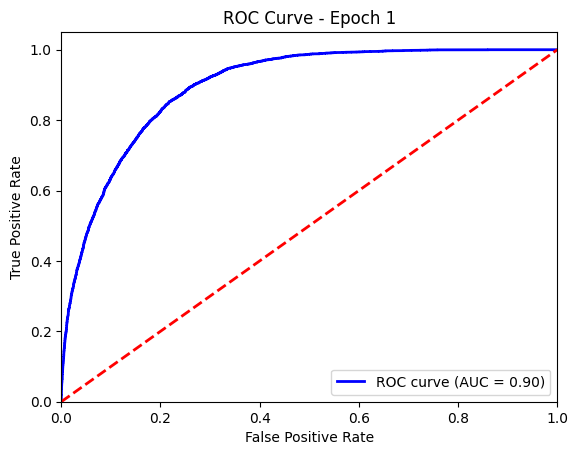

Epoch 2/10, Iteration 10/2533
Epoch 2/10, Iteration 20/2533
Epoch 2/10, Iteration 30/2533
Epoch 2/10, Iteration 40/2533
Epoch 2/10, Iteration 50/2533
Epoch 2/10, Iteration 60/2533
Epoch 2/10, Iteration 70/2533
Epoch 2/10, Iteration 80/2533
Epoch 2/10, Iteration 90/2533
Epoch 2/10, Iteration 100/2533
Epoch 2/10, Iteration 110/2533
Epoch 2/10, Iteration 120/2533
Epoch 2/10, Iteration 130/2533
Epoch 2/10, Iteration 140/2533
Epoch 2/10, Iteration 150/2533
Epoch 2/10, Iteration 160/2533
Epoch 2/10, Iteration 170/2533
Epoch 2/10, Iteration 180/2533
Epoch 2/10, Iteration 190/2533
Epoch 2/10, Iteration 200/2533
Epoch 2/10, Iteration 210/2533
Epoch 2/10, Iteration 220/2533
Epoch 2/10, Iteration 230/2533
Epoch 2/10, Iteration 240/2533
Epoch 2/10, Iteration 250/2533
Epoch 2/10, Iteration 260/2533
Epoch 2/10, Iteration 270/2533
Epoch 2/10, Iteration 280/2533
Epoch 2/10, Iteration 290/2533
Epoch 2/10, Iteration 300/2533
Epoch 2/10, Iteration 310/2533
Epoch 2/10, Iteration 320/2533
Epoch 2/10, Itera

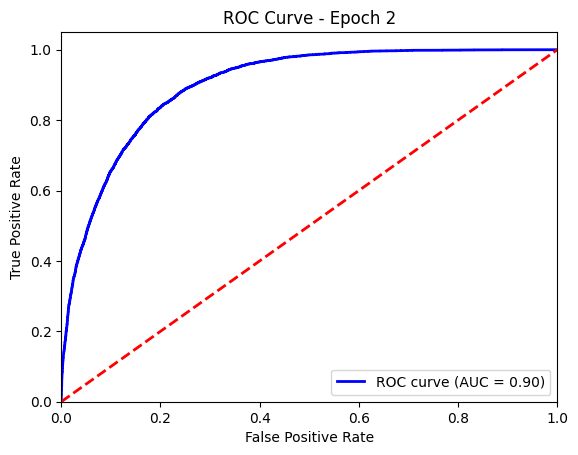

Epoch 3/10, Iteration 10/2533
Epoch 3/10, Iteration 20/2533
Epoch 3/10, Iteration 30/2533
Epoch 3/10, Iteration 40/2533
Epoch 3/10, Iteration 50/2533
Epoch 3/10, Iteration 60/2533
Epoch 3/10, Iteration 70/2533
Epoch 3/10, Iteration 80/2533
Epoch 3/10, Iteration 90/2533
Epoch 3/10, Iteration 100/2533
Epoch 3/10, Iteration 110/2533
Epoch 3/10, Iteration 120/2533
Epoch 3/10, Iteration 130/2533
Epoch 3/10, Iteration 140/2533
Epoch 3/10, Iteration 150/2533
Epoch 3/10, Iteration 160/2533
Epoch 3/10, Iteration 170/2533
Epoch 3/10, Iteration 180/2533
Epoch 3/10, Iteration 190/2533
Epoch 3/10, Iteration 200/2533
Epoch 3/10, Iteration 210/2533
Epoch 3/10, Iteration 220/2533
Epoch 3/10, Iteration 230/2533
Epoch 3/10, Iteration 240/2533
Epoch 3/10, Iteration 250/2533
Epoch 3/10, Iteration 260/2533
Epoch 3/10, Iteration 270/2533
Epoch 3/10, Iteration 280/2533
Epoch 3/10, Iteration 290/2533
Epoch 3/10, Iteration 300/2533
Epoch 3/10, Iteration 310/2533
Epoch 3/10, Iteration 320/2533
Epoch 3/10, Itera

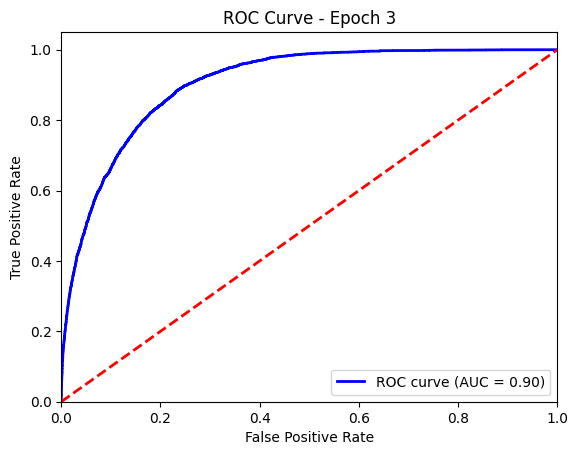

Epoch 4/10, Iteration 10/2533
Epoch 4/10, Iteration 20/2533
Epoch 4/10, Iteration 30/2533
Epoch 4/10, Iteration 40/2533
Epoch 4/10, Iteration 50/2533
Epoch 4/10, Iteration 60/2533
Epoch 4/10, Iteration 70/2533
Epoch 4/10, Iteration 80/2533
Epoch 4/10, Iteration 90/2533
Epoch 4/10, Iteration 100/2533
Epoch 4/10, Iteration 110/2533
Epoch 4/10, Iteration 120/2533
Epoch 4/10, Iteration 130/2533
Epoch 4/10, Iteration 140/2533
Epoch 4/10, Iteration 150/2533
Epoch 4/10, Iteration 160/2533
Epoch 4/10, Iteration 170/2533
Epoch 4/10, Iteration 180/2533
Epoch 4/10, Iteration 190/2533
Epoch 4/10, Iteration 200/2533
Epoch 4/10, Iteration 210/2533
Epoch 4/10, Iteration 220/2533
Epoch 4/10, Iteration 230/2533
Epoch 4/10, Iteration 240/2533
Epoch 4/10, Iteration 250/2533
Epoch 4/10, Iteration 260/2533
Epoch 4/10, Iteration 270/2533
Epoch 4/10, Iteration 280/2533
Epoch 4/10, Iteration 290/2533
Epoch 4/10, Iteration 300/2533
Epoch 4/10, Iteration 310/2533
Epoch 4/10, Iteration 320/2533
Epoch 4/10, Itera

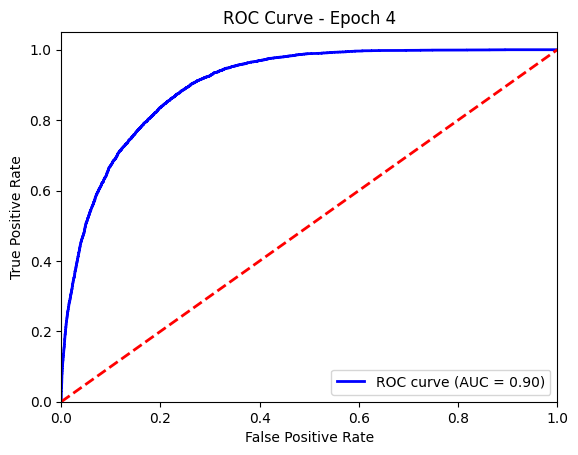

Epoch 5/10, Iteration 10/2533
Epoch 5/10, Iteration 20/2533
Epoch 5/10, Iteration 30/2533
Epoch 5/10, Iteration 40/2533
Epoch 5/10, Iteration 50/2533
Epoch 5/10, Iteration 60/2533
Epoch 5/10, Iteration 70/2533
Epoch 5/10, Iteration 80/2533
Epoch 5/10, Iteration 90/2533
Epoch 5/10, Iteration 100/2533
Epoch 5/10, Iteration 110/2533
Epoch 5/10, Iteration 120/2533
Epoch 5/10, Iteration 130/2533
Epoch 5/10, Iteration 140/2533
Epoch 5/10, Iteration 150/2533
Epoch 5/10, Iteration 160/2533
Epoch 5/10, Iteration 170/2533
Epoch 5/10, Iteration 180/2533
Epoch 5/10, Iteration 190/2533
Epoch 5/10, Iteration 200/2533
Epoch 5/10, Iteration 210/2533
Epoch 5/10, Iteration 220/2533
Epoch 5/10, Iteration 230/2533
Epoch 5/10, Iteration 240/2533
Epoch 5/10, Iteration 250/2533
Epoch 5/10, Iteration 260/2533
Epoch 5/10, Iteration 270/2533
Epoch 5/10, Iteration 280/2533
Epoch 5/10, Iteration 290/2533
Epoch 5/10, Iteration 300/2533
Epoch 5/10, Iteration 310/2533
Epoch 5/10, Iteration 320/2533
Epoch 5/10, Itera

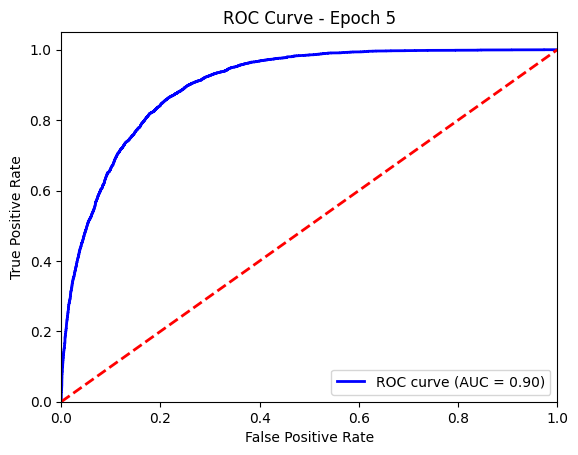

Early stopping triggered after 5 epochs
Model saved as 'best_model_64_batch_size.pth'


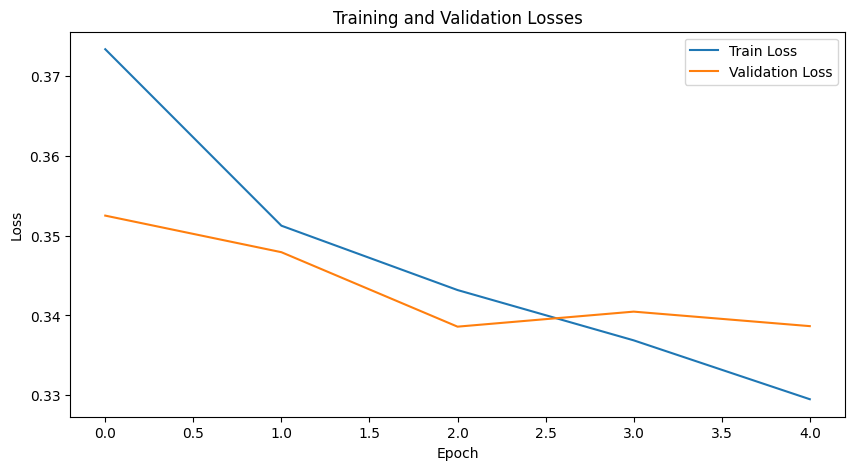

Accuracy: 0.8372
F1 Score: 0.6758
Precision: 0.7172
Confusion Matrix:
[[13522  1356]
 [ 1943  3439]]


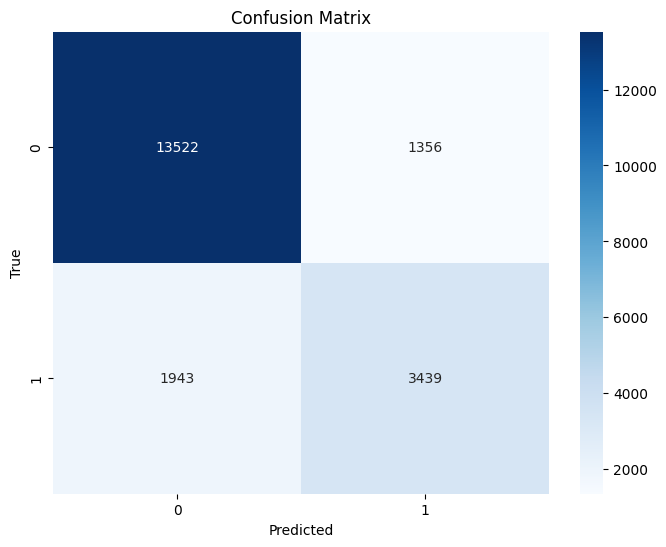

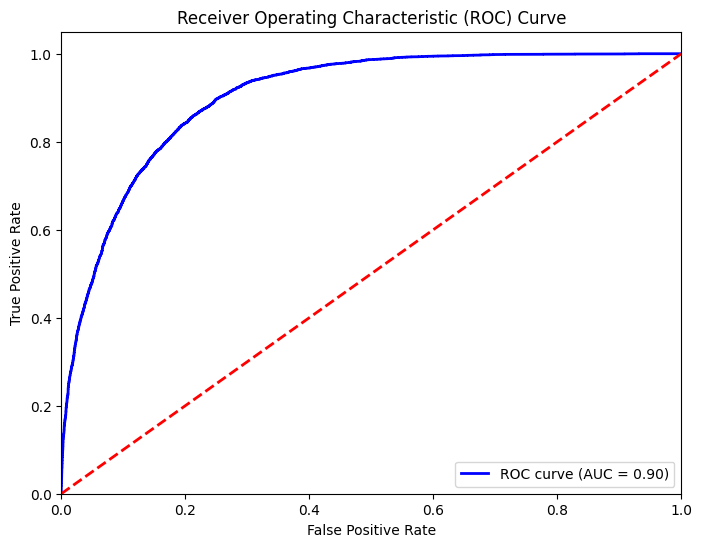

Test Accuracy: 0.8372
Test F1 Score: 0.6783
Test Precision: 0.7226
Test Confusion Matrix:
[[13485  1335]
 [ 1963  3477]]


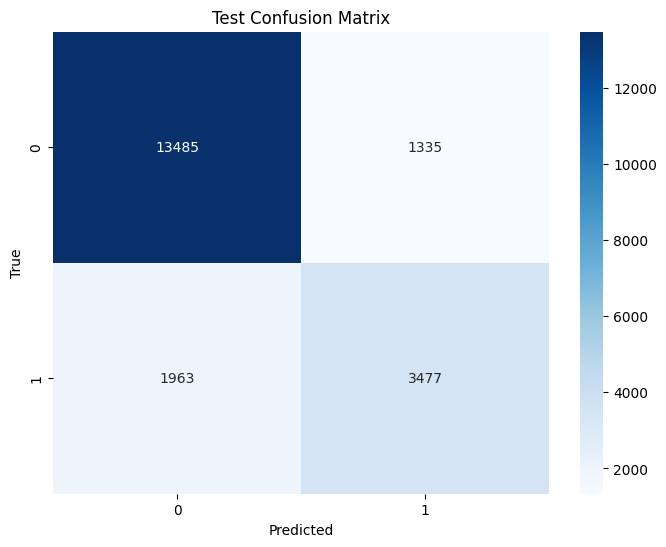

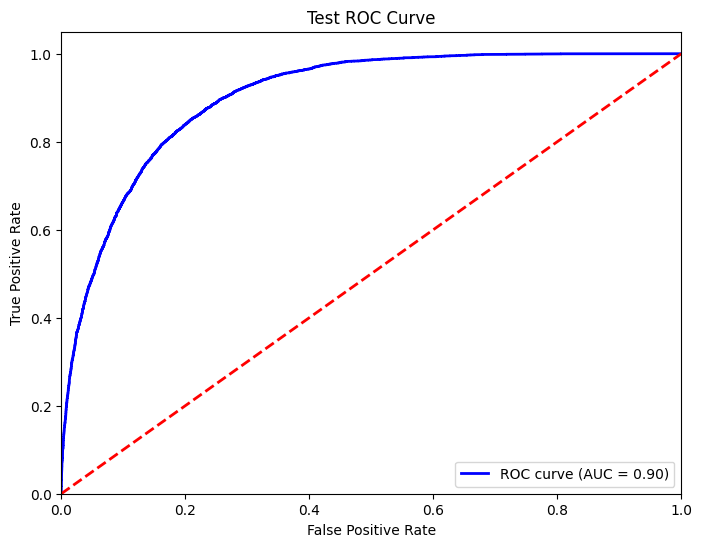

In [10]:
# Now we use fine-tuning on the ResNet-18 model
from torchvision import models
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, f1_score, precision_score, confusion_matrix, roc_curve, roc_auc_score
import copy
from sklearn.model_selection import train_test_split
import os
import numpy as np
import pandas as pd

# Define directories (paths should be correct for your setup)
dir_path = os.path.dirname(os.path.realpath('UMC301_Assignment_2.ipynb'))
label_dir = os.path.join(dir_path, 'face_images/face_image_attr.csv')
image_dir = os.path.join(dir_path, 'face_images/img_align_celeba')

# Load the labels
labels = pd.read_csv(label_dir)

# Take only image_id and Arched_Eyebrows columns
labels = labels[['image_id', 'Arched_Eyebrows']]

# Change the labels to 0 and 1
labels['Arched_Eyebrows'] = labels['Arched_Eyebrows'].apply(lambda x: 1 if x == 1 else 0)

# Perform a train-test-validation split (80% train, 10% validation, 10% test)
train, temp = train_test_split(labels, test_size=0.2, random_state=42)
val, test = train_test_split(temp, test_size=0.5, random_state=42)

# Get image file paths
train_images = [os.path.join(image_dir, image) for image in train['image_id']]
val_images = [os.path.join(image_dir, image) for image in val['image_id']]
test_images = [os.path.join(image_dir, image) for image in test['image_id']]

# Create label dictionaries
train_labels = dict(zip(train['image_id'], train['Arched_Eyebrows']))
val_labels = dict(zip(val['image_id'], val['Arched_Eyebrows']))
test_labels = dict(zip(test['image_id'], test['Arched_Eyebrows']))
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),  # Randomly flip the image horizontally
    transforms.RandomRotation(degrees=15),   # Randomly rotate the image within 15 degrees
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
# Load the pre-trained ResNet-18 model
model = models.resnet18(pretrained=True)

# Change the output layer for binary classification
model.fc = nn.Linear(512, 1)

# Freeze all layers except the last few (for fine-tuning)
for param in model.parameters():
    param.requires_grad = False

# Unfreeze the last fully connected layer (fc layer)
for param in model.fc.parameters():
    param.requires_grad = True

# Unfreeze the last layer (layer4 block) of ResNet
for param in model.layer4.parameters():
    param.requires_grad = True


# Define the loss function for binary classification
criterion = nn.BCEWithLogitsLoss()

# Define the optimizer with lr=0.001
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, verbose=True)

# Define the dataset class (unchanged)
class FaceDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = Image.open(self.images[idx])
        label = self.labels[self.images[idx].split('/')[-1]]
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label, dtype=torch.float)

# Create the datasets and dataloaders
train_dataset = FaceDataset(train_images, train_labels, transform)
val_dataset = FaceDataset(val_images, val_labels, transform)
test_dataset = FaceDataset(test_images, test_labels, transform)

train_dataloader = DataLoader(train_dataset, batch_size=64, shuffle=False)
val_dataloader = DataLoader(val_dataset, batch_size=64, shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=64, shuffle=False)

# Move the model to the device
model = model.to(device)

# Train the model
n_epochs = 10  # Increase max epochs, early stopping will prevent overfitting
train_losses = []
val_losses = []

# Early stopping parameters
patience = 2
best_val_loss = float('inf')
counter = 0
best_model = None

def plot_roc_curve(fpr, tpr, roc_auc, epoch):
    plt.figure()
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - Epoch {epoch + 1}')
    plt.legend(loc="lower right")
    plt.show()
    
def evaluate_model(model, dataloader, device):
    model.eval()
    all_preds = []
    all_labels = []
    all_probs = []
    
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            output = model(images)
            probs = torch.sigmoid(output)
            preds = (probs > 0.5).float()
            
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    return np.array(all_preds), np.array(all_labels), np.array(all_probs)

for epoch in range(n_epochs):
    model.train()
    train_loss = 0
    n_iter = 0

    for images, labels in train_dataloader:
        images = images.to(device)
        labels = labels.to(device).unsqueeze(1)  # Add extra dimension for binary classification

        optimizer.zero_grad()
        output = model(images)
        loss = criterion(output, labels)
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        n_iter += 1
        if n_iter % 10 == 0:
            print(f'Epoch {epoch + 1}/{n_epochs}, Iteration {n_iter}/{len(train_dataloader)}')

    train_loss /= n_iter
    train_losses.append(train_loss)

    model.eval()
    val_loss = 0
    n_iter = 0

    for images, labels in val_dataloader:
        images = images.to(device)
        labels = labels.to(device).unsqueeze(1)  # Add extra dimension for binary classification

        with torch.no_grad():
            output = model(images)
            loss = criterion(output, labels)
            val_loss += loss.item()
            n_iter += 1

    val_loss /= n_iter
    val_losses.append(val_loss)

    print(f'Epoch {epoch + 1}/{n_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')
    
    # Evaluate on validation set
    val_preds, val_labels, val_probs = evaluate_model(model, val_dataloader, device)
    
    # Compute metrics
    accuracy = accuracy_score(val_labels, val_preds)
    f1 = f1_score(val_labels, val_preds)
    fpr, tpr, _ = roc_curve(val_labels, val_probs)
    roc_auc = roc_auc_score(val_labels, val_probs)
    
    print(f"Validation Accuracy: {accuracy:.4f}")
    print(f"Validation F1 Score: {f1:.4f}")
    print(f"Validation AUC: {roc_auc:.4f}")
    
    # Plot ROC curve
    plot_roc_curve(fpr, tpr, roc_auc, epoch)
    
    # Learning rate scheduler step
    scheduler.step(val_loss)
    
    # Early stopping
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        counter = 0
        best_model = copy.deepcopy(model.state_dict())
    else:
        counter += 1
        if counter >= patience:
            print(f"Early stopping triggered after {epoch + 1} epochs")
            break

# Load the best model
model.load_state_dict(best_model)

# Save the final model
torch.save(model.state_dict(), 'best_model_64_batch_size.pth')
print("Model saved as 'best_model_64_batch_size.pth'")

# Plot the losses
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Losses')
plt.show()


# Evaluate on validation set
val_preds, val_labels, val_probs = evaluate_model(model, val_dataloader, device)

# Compute metrics
accuracy = accuracy_score(val_labels, val_preds)
f1 = f1_score(val_labels, val_preds)
precision = precision_score(val_labels, val_preds)

print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")

# Compute confusion matrix
conf_matrix = confusion_matrix(val_labels, val_preds)
print("Confusion Matrix:")
print(conf_matrix)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Compute ROC curve and AUC score
fpr, tpr, _ = roc_curve(val_labels, val_probs)
roc_auc = roc_auc_score(val_labels, val_probs)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


test_preds, test_labels, test_probs = evaluate_model(model, test_dataloader, device)

# Compute test metrics
test_accuracy = accuracy_score(test_labels, test_preds)
test_f1 = f1_score(test_labels, test_preds)
test_precision = precision_score(test_labels, test_preds)

print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test F1 Score: {test_f1:.4f}")
print(f"Test Precision: {test_precision:.4f}")

# Compute test confusion matrix
test_conf_matrix = confusion_matrix(test_labels, test_preds)
print("Test Confusion Matrix:")
print(test_conf_matrix)

# Plot test confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(test_conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Test Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Compute ROC curve and AUC score for test set
test_fpr, test_tpr, _ = roc_curve(test_labels, test_probs)
test_roc_auc = roc_auc_score(test_labels, test_probs)

# Plot ROC curve for test set
plt.figure(figsize=(8, 6))
plt.plot(test_fpr, test_tpr, color='blue', lw=2, label=f'ROC curve (AUC = {test_roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Test ROC Curve')
plt.legend(loc="lower right")
plt.show()

#### Let's also try with batch size 128 the same code as last block and see if the model performance improves or not.

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/smehul/.local/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1/10, Iteration 10/1267
Epoch 1/10, Iteration 20/1267
Epoch 1/10, Iteration 30/1267
Epoch 1/10, Iteration 40/1267
Epoch 1/10, Iteration 50/1267
Epoch 1/10, Iteration 60/1267
Epoch 1/10, Iteration 70/1267
Epoch 1/10, Iteration 80/1267
Epoch 1/10, Iteration 90/1267
Epoch 1/10, Iteration 100/1267
Epoch 1/10, Iteration 110/1267
Epoch 1/10, Iteration 120/1267
Epoch 1/10, Iteration 130/1267
Epoch 1/10, Iteration 140/1267
Epoch 1/10, Iteration 150/1267
Epoch 1/10, Iteration 160/1267
Epoch 1/10, Iteration 170/1267
Epoch 1/10, Iteration 180/1267
Epoch 1/10, Iteration 190/1267
Epoch 1/10, Iteration 200/1267
Epoch 1/10, Iteration 210/1267
Epoch 1/10, Iteration 220/1267
Epoch 1/10, Iteration 230/1267
Epoch 1/10, Iteration 240/1267
Epoch 1/10, Iteration 250/1267
Epoch 1/10, Iteration 260/1267
Epoch 1/10, Iteration 270/1267
Epoch 1/10, Iteration 280/1267
Epoch 1/10, Iteration 290/1267
Epoch 1/10, Iteration 300/1267
Epoch 1/10, Iteration 310/1267
Epoch 1/10, Iteration 320/1267
Epoch 1/10, Itera

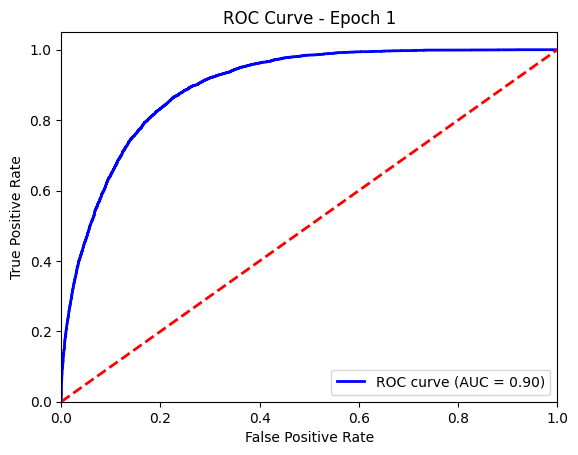

Epoch 2/10, Iteration 10/1267
Epoch 2/10, Iteration 20/1267
Epoch 2/10, Iteration 30/1267
Epoch 2/10, Iteration 40/1267
Epoch 2/10, Iteration 50/1267
Epoch 2/10, Iteration 60/1267
Epoch 2/10, Iteration 70/1267
Epoch 2/10, Iteration 80/1267
Epoch 2/10, Iteration 90/1267
Epoch 2/10, Iteration 100/1267
Epoch 2/10, Iteration 110/1267
Epoch 2/10, Iteration 120/1267
Epoch 2/10, Iteration 130/1267
Epoch 2/10, Iteration 140/1267
Epoch 2/10, Iteration 150/1267
Epoch 2/10, Iteration 160/1267
Epoch 2/10, Iteration 170/1267
Epoch 2/10, Iteration 180/1267
Epoch 2/10, Iteration 190/1267
Epoch 2/10, Iteration 200/1267
Epoch 2/10, Iteration 210/1267
Epoch 2/10, Iteration 220/1267
Epoch 2/10, Iteration 230/1267
Epoch 2/10, Iteration 240/1267
Epoch 2/10, Iteration 250/1267
Epoch 2/10, Iteration 260/1267
Epoch 2/10, Iteration 270/1267
Epoch 2/10, Iteration 280/1267
Epoch 2/10, Iteration 290/1267
Epoch 2/10, Iteration 300/1267
Epoch 2/10, Iteration 310/1267
Epoch 2/10, Iteration 320/1267
Epoch 2/10, Itera

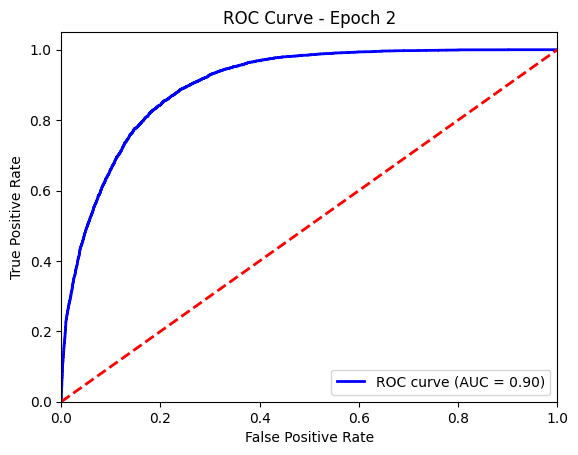

Epoch 3/10, Iteration 10/1267
Epoch 3/10, Iteration 20/1267
Epoch 3/10, Iteration 30/1267
Epoch 3/10, Iteration 40/1267
Epoch 3/10, Iteration 50/1267
Epoch 3/10, Iteration 60/1267
Epoch 3/10, Iteration 70/1267
Epoch 3/10, Iteration 80/1267
Epoch 3/10, Iteration 90/1267
Epoch 3/10, Iteration 100/1267
Epoch 3/10, Iteration 110/1267
Epoch 3/10, Iteration 120/1267
Epoch 3/10, Iteration 130/1267
Epoch 3/10, Iteration 140/1267
Epoch 3/10, Iteration 150/1267
Epoch 3/10, Iteration 160/1267
Epoch 3/10, Iteration 170/1267
Epoch 3/10, Iteration 180/1267
Epoch 3/10, Iteration 190/1267
Epoch 3/10, Iteration 200/1267
Epoch 3/10, Iteration 210/1267
Epoch 3/10, Iteration 220/1267
Epoch 3/10, Iteration 230/1267
Epoch 3/10, Iteration 240/1267
Epoch 3/10, Iteration 250/1267
Epoch 3/10, Iteration 260/1267
Epoch 3/10, Iteration 270/1267
Epoch 3/10, Iteration 280/1267
Epoch 3/10, Iteration 290/1267
Epoch 3/10, Iteration 300/1267
Epoch 3/10, Iteration 310/1267
Epoch 3/10, Iteration 320/1267
Epoch 3/10, Itera

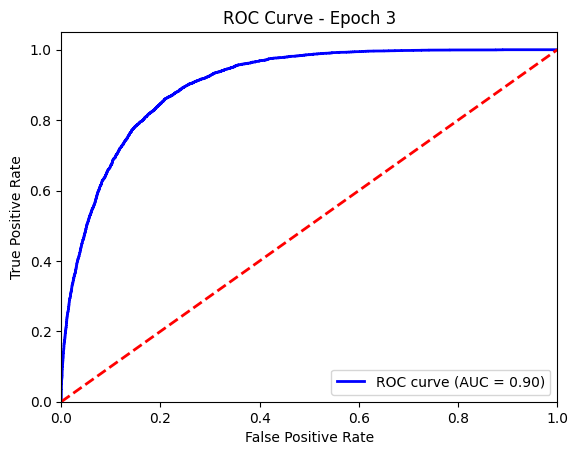

Epoch 4/10, Iteration 10/1267
Epoch 4/10, Iteration 20/1267
Epoch 4/10, Iteration 30/1267
Epoch 4/10, Iteration 40/1267
Epoch 4/10, Iteration 50/1267
Epoch 4/10, Iteration 60/1267
Epoch 4/10, Iteration 70/1267
Epoch 4/10, Iteration 80/1267
Epoch 4/10, Iteration 90/1267
Epoch 4/10, Iteration 100/1267
Epoch 4/10, Iteration 110/1267
Epoch 4/10, Iteration 120/1267
Epoch 4/10, Iteration 130/1267
Epoch 4/10, Iteration 140/1267
Epoch 4/10, Iteration 150/1267
Epoch 4/10, Iteration 160/1267
Epoch 4/10, Iteration 170/1267
Epoch 4/10, Iteration 180/1267
Epoch 4/10, Iteration 190/1267
Epoch 4/10, Iteration 200/1267
Epoch 4/10, Iteration 210/1267
Epoch 4/10, Iteration 220/1267
Epoch 4/10, Iteration 230/1267
Epoch 4/10, Iteration 240/1267
Epoch 4/10, Iteration 250/1267
Epoch 4/10, Iteration 260/1267
Epoch 4/10, Iteration 270/1267
Epoch 4/10, Iteration 280/1267
Epoch 4/10, Iteration 290/1267
Epoch 4/10, Iteration 300/1267
Epoch 4/10, Iteration 310/1267
Epoch 4/10, Iteration 320/1267
Epoch 4/10, Itera

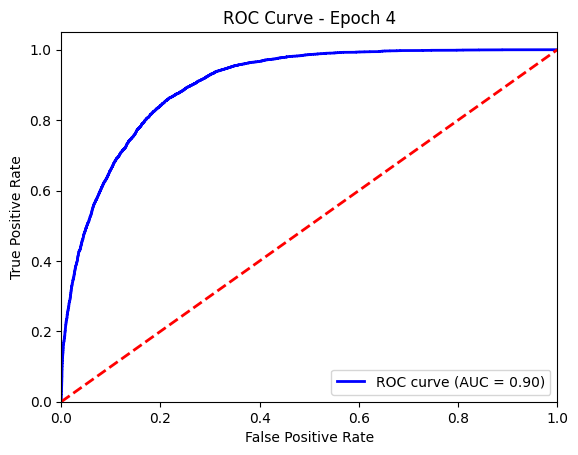

Epoch 5/10, Iteration 10/1267
Epoch 5/10, Iteration 20/1267
Epoch 5/10, Iteration 30/1267
Epoch 5/10, Iteration 40/1267
Epoch 5/10, Iteration 50/1267
Epoch 5/10, Iteration 60/1267
Epoch 5/10, Iteration 70/1267
Epoch 5/10, Iteration 80/1267
Epoch 5/10, Iteration 90/1267
Epoch 5/10, Iteration 100/1267
Epoch 5/10, Iteration 110/1267
Epoch 5/10, Iteration 120/1267
Epoch 5/10, Iteration 130/1267
Epoch 5/10, Iteration 140/1267
Epoch 5/10, Iteration 150/1267
Epoch 5/10, Iteration 160/1267
Epoch 5/10, Iteration 170/1267
Epoch 5/10, Iteration 180/1267
Epoch 5/10, Iteration 190/1267
Epoch 5/10, Iteration 200/1267
Epoch 5/10, Iteration 210/1267
Epoch 5/10, Iteration 220/1267
Epoch 5/10, Iteration 230/1267
Epoch 5/10, Iteration 240/1267
Epoch 5/10, Iteration 250/1267
Epoch 5/10, Iteration 260/1267
Epoch 5/10, Iteration 270/1267
Epoch 5/10, Iteration 280/1267
Epoch 5/10, Iteration 290/1267
Epoch 5/10, Iteration 300/1267
Epoch 5/10, Iteration 310/1267
Epoch 5/10, Iteration 320/1267
Epoch 5/10, Itera

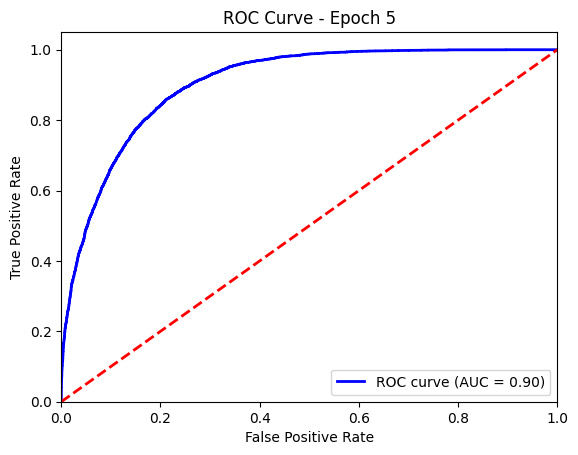

Epoch 6/10, Iteration 10/1267
Epoch 6/10, Iteration 20/1267
Epoch 6/10, Iteration 30/1267
Epoch 6/10, Iteration 40/1267
Epoch 6/10, Iteration 50/1267
Epoch 6/10, Iteration 60/1267
Epoch 6/10, Iteration 70/1267
Epoch 6/10, Iteration 80/1267
Epoch 6/10, Iteration 90/1267
Epoch 6/10, Iteration 100/1267
Epoch 6/10, Iteration 110/1267
Epoch 6/10, Iteration 120/1267
Epoch 6/10, Iteration 130/1267
Epoch 6/10, Iteration 140/1267
Epoch 6/10, Iteration 150/1267
Epoch 6/10, Iteration 160/1267
Epoch 6/10, Iteration 170/1267
Epoch 6/10, Iteration 180/1267
Epoch 6/10, Iteration 190/1267
Epoch 6/10, Iteration 200/1267
Epoch 6/10, Iteration 210/1267
Epoch 6/10, Iteration 220/1267
Epoch 6/10, Iteration 230/1267
Epoch 6/10, Iteration 240/1267
Epoch 6/10, Iteration 250/1267
Epoch 6/10, Iteration 260/1267
Epoch 6/10, Iteration 270/1267
Epoch 6/10, Iteration 280/1267
Epoch 6/10, Iteration 290/1267
Epoch 6/10, Iteration 300/1267
Epoch 6/10, Iteration 310/1267
Epoch 6/10, Iteration 320/1267
Epoch 6/10, Itera

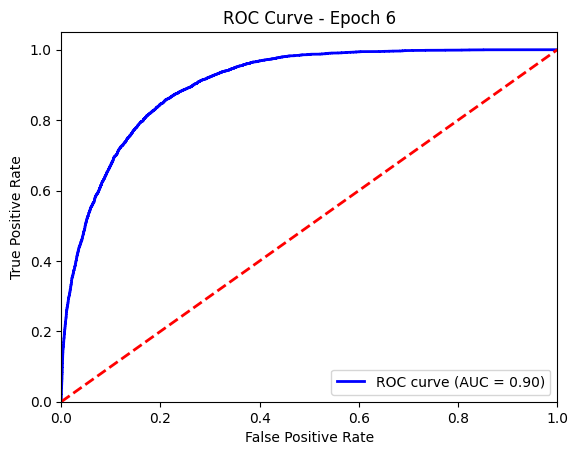

Epoch 7/10, Iteration 10/1267
Epoch 7/10, Iteration 20/1267
Epoch 7/10, Iteration 30/1267
Epoch 7/10, Iteration 40/1267
Epoch 7/10, Iteration 50/1267
Epoch 7/10, Iteration 60/1267
Epoch 7/10, Iteration 70/1267
Epoch 7/10, Iteration 80/1267
Epoch 7/10, Iteration 90/1267
Epoch 7/10, Iteration 100/1267
Epoch 7/10, Iteration 110/1267
Epoch 7/10, Iteration 120/1267
Epoch 7/10, Iteration 130/1267
Epoch 7/10, Iteration 140/1267
Epoch 7/10, Iteration 150/1267
Epoch 7/10, Iteration 160/1267
Epoch 7/10, Iteration 170/1267
Epoch 7/10, Iteration 180/1267
Epoch 7/10, Iteration 190/1267
Epoch 7/10, Iteration 200/1267
Epoch 7/10, Iteration 210/1267
Epoch 7/10, Iteration 220/1267
Epoch 7/10, Iteration 230/1267
Epoch 7/10, Iteration 240/1267
Epoch 7/10, Iteration 250/1267
Epoch 7/10, Iteration 260/1267
Epoch 7/10, Iteration 270/1267
Epoch 7/10, Iteration 280/1267
Epoch 7/10, Iteration 290/1267
Epoch 7/10, Iteration 300/1267
Epoch 7/10, Iteration 310/1267
Epoch 7/10, Iteration 320/1267
Epoch 7/10, Itera

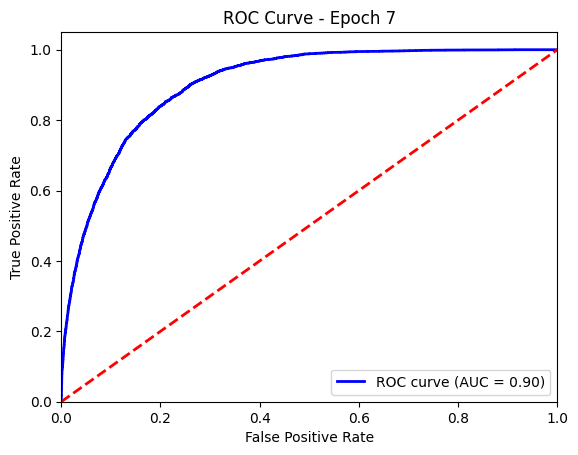

Early stopping triggered after 7 epochs
Model saved as 'best_model_128_batch_size.pth'


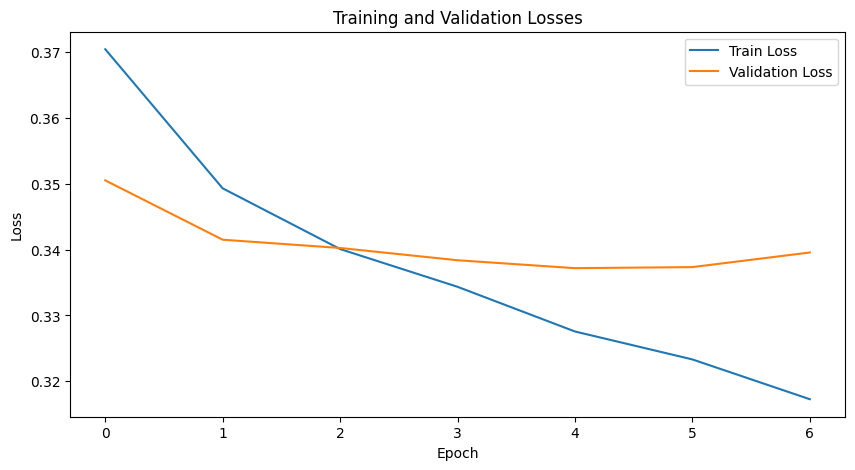

Accuracy: 0.8366
F1 Score: 0.6855
Precision: 0.7012
Confusion Matrix:
[[13340  1538]
 [ 1773  3609]]


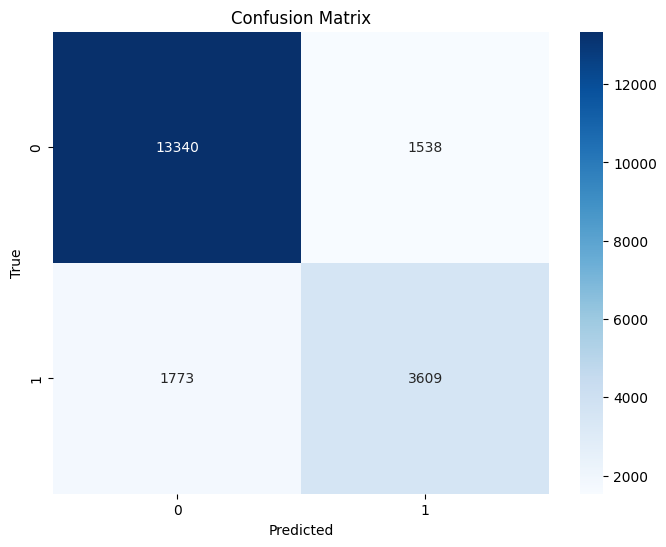

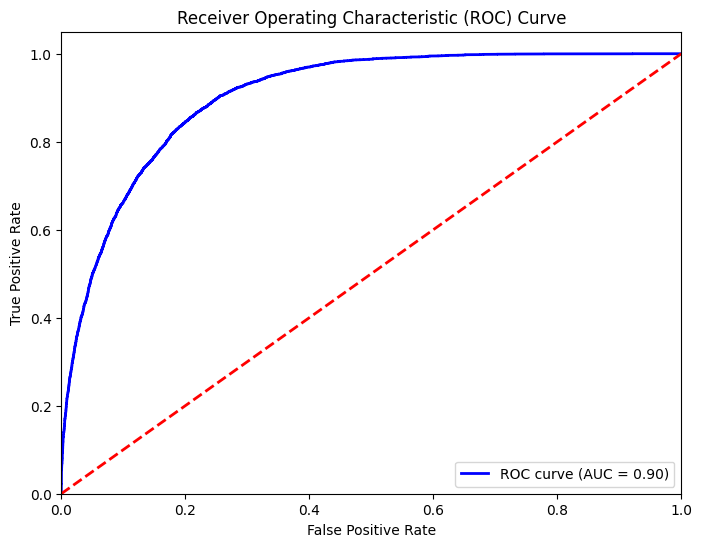

Test Accuracy: 0.8386
Test F1 Score: 0.6904
Test Precision: 0.7118
Test Confusion Matrix:
[[13344  1476]
 [ 1794  3646]]


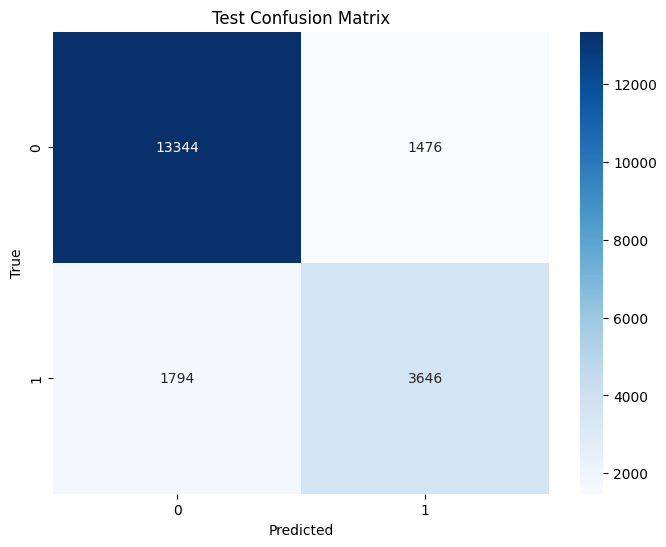

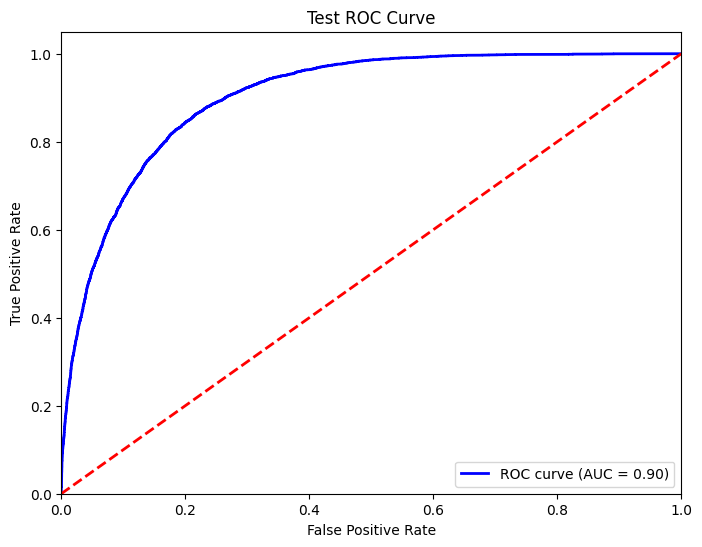

In [11]:
# Now we use fine-tuning on the ResNet-18 model
from torchvision import models
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, f1_score, precision_score, confusion_matrix, roc_curve, roc_auc_score
import copy
from sklearn.model_selection import train_test_split
import os
import numpy as np
import pandas as pd

# Define directories (paths should be correct for your setup)
dir_path = os.path.dirname(os.path.realpath('UMC301_Assignment_2.ipynb'))
label_dir = os.path.join(dir_path, 'face_images/face_image_attr.csv')
image_dir = os.path.join(dir_path, 'face_images/img_align_celeba')

# Load the labels
labels = pd.read_csv(label_dir)

# Take only image_id and Arched_Eyebrows columns
labels = labels[['image_id', 'Arched_Eyebrows']]

# Change the labels to 0 and 1
labels['Arched_Eyebrows'] = labels['Arched_Eyebrows'].apply(lambda x: 1 if x == 1 else 0)

# Perform a train-test-validation split (80% train, 10% validation, 10% test)
train, temp = train_test_split(labels, test_size=0.2, random_state=42)
val, test = train_test_split(temp, test_size=0.5, random_state=42)

# Get image file paths
train_images = [os.path.join(image_dir, image) for image in train['image_id']]
val_images = [os.path.join(image_dir, image) for image in val['image_id']]
test_images = [os.path.join(image_dir, image) for image in test['image_id']]

# Create label dictionaries
train_labels = dict(zip(train['image_id'], train['Arched_Eyebrows']))
val_labels = dict(zip(val['image_id'], val['Arched_Eyebrows']))
test_labels = dict(zip(test['image_id'], test['Arched_Eyebrows']))
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),  # Randomly flip the image horizontally
    transforms.RandomRotation(degrees=15),   # Randomly rotate the image within 15 degrees
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
# Load the pre-trained ResNet-18 model
model = models.resnet18(pretrained=True)

# Change the output layer for binary classification
model.fc = nn.Linear(512, 1)

# Freeze all layers except the last few (for fine-tuning)
for param in model.parameters():
    param.requires_grad = False

# Unfreeze the last fully connected layer (fc layer)
for param in model.fc.parameters():
    param.requires_grad = True

# Unfreeze the last layer (layer4 block) of ResNet
for param in model.layer4.parameters():
    param.requires_grad = True


# Define the loss function for binary classification
criterion = nn.BCEWithLogitsLoss()

# Define the optimizer with lr=0.001
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, verbose=True)

# Define the dataset class (unchanged)
class FaceDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = Image.open(self.images[idx])
        label = self.labels[self.images[idx].split('/')[-1]]
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label, dtype=torch.float)

# Create the datasets and dataloaders
train_dataset = FaceDataset(train_images, train_labels, transform)
val_dataset = FaceDataset(val_images, val_labels, transform)
test_dataset = FaceDataset(test_images, test_labels, transform)

train_dataloader = DataLoader(train_dataset, batch_size=128, shuffle=False)
val_dataloader = DataLoader(val_dataset, batch_size=128, shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=128, shuffle=False)

# Move the model to the device
model = model.to(device)

# Train the model
n_epochs = 10  # Increase max epochs, early stopping will prevent overfitting
train_losses = []
val_losses = []

# Early stopping parameters
patience = 2
best_val_loss = float('inf')
counter = 0
best_model = None

def plot_roc_curve(fpr, tpr, roc_auc, epoch):
    plt.figure()
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - Epoch {epoch + 1}')
    plt.legend(loc="lower right")
    plt.show()
    
def evaluate_model(model, dataloader, device):
    model.eval()
    all_preds = []
    all_labels = []
    all_probs = []
    
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            output = model(images)
            probs = torch.sigmoid(output)
            preds = (probs > 0.5).float()
            
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    return np.array(all_preds), np.array(all_labels), np.array(all_probs)

for epoch in range(n_epochs):
    model.train()
    train_loss = 0
    n_iter = 0

    for images, labels in train_dataloader:
        images = images.to(device)
        labels = labels.to(device).unsqueeze(1)  # Add extra dimension for binary classification

        optimizer.zero_grad()
        output = model(images)
        loss = criterion(output, labels)
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        n_iter += 1
        if n_iter % 10 == 0:
            print(f'Epoch {epoch + 1}/{n_epochs}, Iteration {n_iter}/{len(train_dataloader)}')

    train_loss /= n_iter
    train_losses.append(train_loss)

    model.eval()
    val_loss = 0
    n_iter = 0

    for images, labels in val_dataloader:
        images = images.to(device)
        labels = labels.to(device).unsqueeze(1)  # Add extra dimension for binary classification

        with torch.no_grad():
            output = model(images)
            loss = criterion(output, labels)
            val_loss += loss.item()
            n_iter += 1

    val_loss /= n_iter
    val_losses.append(val_loss)

    print(f'Epoch {epoch + 1}/{n_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')
    
    # Evaluate on validation set
    val_preds, val_labels, val_probs = evaluate_model(model, val_dataloader, device)
    
    # Compute metrics
    accuracy = accuracy_score(val_labels, val_preds)
    f1 = f1_score(val_labels, val_preds)
    fpr, tpr, _ = roc_curve(val_labels, val_probs)
    roc_auc = roc_auc_score(val_labels, val_probs)
    
    print(f"Validation Accuracy: {accuracy:.4f}")
    print(f"Validation F1 Score: {f1:.4f}")
    print(f"Validation AUC: {roc_auc:.4f}")
    
    # Plot ROC curve
    plot_roc_curve(fpr, tpr, roc_auc, epoch)
    
    # Learning rate scheduler step
    scheduler.step(val_loss)
    
    # Early stopping
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        counter = 0
        best_model = copy.deepcopy(model.state_dict())
    else:
        counter += 1
        if counter >= patience:
            print(f"Early stopping triggered after {epoch + 1} epochs")
            break

# Load the best model
model.load_state_dict(best_model)

# Save the final model
torch.save(model.state_dict(), 'best_model_128_batch_size.pth')
print("Model saved as 'best_model_128_batch_size.pth'")

# Plot the losses
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Losses')
plt.show()


# Evaluate on validation set
val_preds, val_labels, val_probs = evaluate_model(model, val_dataloader, device)

# Compute metrics
accuracy = accuracy_score(val_labels, val_preds)
f1 = f1_score(val_labels, val_preds)
precision = precision_score(val_labels, val_preds)

print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")

# Compute confusion matrix
conf_matrix = confusion_matrix(val_labels, val_preds)
print("Confusion Matrix:")
print(conf_matrix)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Compute ROC curve and AUC score
fpr, tpr, _ = roc_curve(val_labels, val_probs)
roc_auc = roc_auc_score(val_labels, val_probs)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


test_preds, test_labels, test_probs = evaluate_model(model, test_dataloader, device)

# Compute test metrics
test_accuracy = accuracy_score(test_labels, test_preds)
test_f1 = f1_score(test_labels, test_preds)
test_precision = precision_score(test_labels, test_preds)

print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test F1 Score: {test_f1:.4f}")
print(f"Test Precision: {test_precision:.4f}")

# Compute test confusion matrix
test_conf_matrix = confusion_matrix(test_labels, test_preds)
print("Test Confusion Matrix:")
print(test_conf_matrix)

# Plot test confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(test_conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Test Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Compute ROC curve and AUC score for test set
test_fpr, test_tpr, _ = roc_curve(test_labels, test_probs)
test_roc_auc = roc_auc_score(test_labels, test_probs)

# Plot ROC curve for test set
plt.figure(figsize=(8, 6))
plt.plot(test_fpr, test_tpr, color='blue', lw=2, label=f'ROC curve (AUC = {test_roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Test ROC Curve')
plt.legend(loc="lower right")
plt.show()

#### Before selecting the final model for Q2, we will try once with training the entire model and see if the model performance improves or not, if this doesn't improve significantly, we will go with the model with best results till now

/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/smehul/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/smehul/.local/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1/10, Iteration 10/2533
Epoch 1/10, Iteration 20/2533
Epoch 1/10, Iteration 30/2533
Epoch 1/10, Iteration 40/2533
Epoch 1/10, Iteration 50/2533
Epoch 1/10, Iteration 60/2533
Epoch 1/10, Iteration 70/2533
Epoch 1/10, Iteration 80/2533
Epoch 1/10, Iteration 90/2533
Epoch 1/10, Iteration 100/2533
Epoch 1/10, Iteration 110/2533
Epoch 1/10, Iteration 120/2533
Epoch 1/10, Iteration 130/2533
Epoch 1/10, Iteration 140/2533
Epoch 1/10, Iteration 150/2533
Epoch 1/10, Iteration 160/2533
Epoch 1/10, Iteration 170/2533
Epoch 1/10, Iteration 180/2533
Epoch 1/10, Iteration 190/2533
Epoch 1/10, Iteration 200/2533
Epoch 1/10, Iteration 210/2533
Epoch 1/10, Iteration 220/2533
Epoch 1/10, Iteration 230/2533
Epoch 1/10, Iteration 240/2533
Epoch 1/10, Iteration 250/2533
Epoch 1/10, Iteration 260/2533
Epoch 1/10, Iteration 270/2533
Epoch 1/10, Iteration 280/2533
Epoch 1/10, Iteration 290/2533
Epoch 1/10, Iteration 300/2533
Epoch 1/10, Iteration 310/2533
Epoch 1/10, Iteration 320/2533
Epoch 1/10, Itera

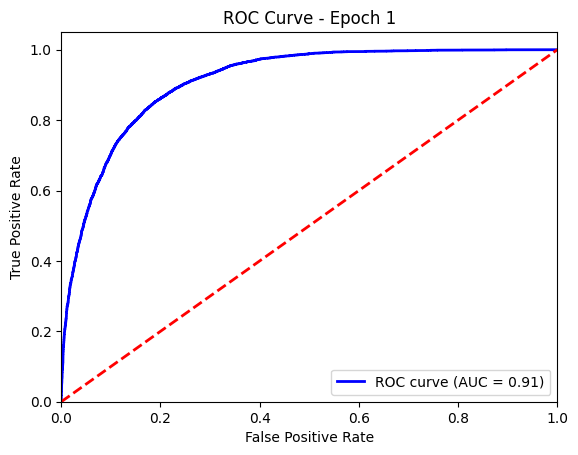

Epoch 2/10, Iteration 10/2533
Epoch 2/10, Iteration 20/2533
Epoch 2/10, Iteration 30/2533
Epoch 2/10, Iteration 40/2533
Epoch 2/10, Iteration 50/2533
Epoch 2/10, Iteration 60/2533
Epoch 2/10, Iteration 70/2533
Epoch 2/10, Iteration 80/2533
Epoch 2/10, Iteration 90/2533
Epoch 2/10, Iteration 100/2533
Epoch 2/10, Iteration 110/2533
Epoch 2/10, Iteration 120/2533
Epoch 2/10, Iteration 130/2533
Epoch 2/10, Iteration 140/2533
Epoch 2/10, Iteration 150/2533
Epoch 2/10, Iteration 160/2533
Epoch 2/10, Iteration 170/2533
Epoch 2/10, Iteration 180/2533
Epoch 2/10, Iteration 190/2533
Epoch 2/10, Iteration 200/2533
Epoch 2/10, Iteration 210/2533
Epoch 2/10, Iteration 220/2533
Epoch 2/10, Iteration 230/2533
Epoch 2/10, Iteration 240/2533
Epoch 2/10, Iteration 250/2533
Epoch 2/10, Iteration 260/2533
Epoch 2/10, Iteration 270/2533
Epoch 2/10, Iteration 280/2533
Epoch 2/10, Iteration 290/2533
Epoch 2/10, Iteration 300/2533
Epoch 2/10, Iteration 310/2533
Epoch 2/10, Iteration 320/2533
Epoch 2/10, Itera

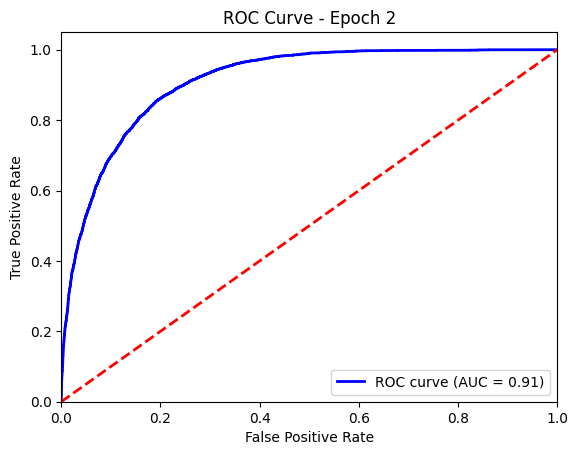

Epoch 3/10, Iteration 10/2533
Epoch 3/10, Iteration 20/2533
Epoch 3/10, Iteration 30/2533
Epoch 3/10, Iteration 40/2533
Epoch 3/10, Iteration 50/2533
Epoch 3/10, Iteration 60/2533
Epoch 3/10, Iteration 70/2533
Epoch 3/10, Iteration 80/2533
Epoch 3/10, Iteration 90/2533
Epoch 3/10, Iteration 100/2533
Epoch 3/10, Iteration 110/2533
Epoch 3/10, Iteration 120/2533
Epoch 3/10, Iteration 130/2533
Epoch 3/10, Iteration 140/2533
Epoch 3/10, Iteration 150/2533
Epoch 3/10, Iteration 160/2533
Epoch 3/10, Iteration 170/2533
Epoch 3/10, Iteration 180/2533
Epoch 3/10, Iteration 190/2533
Epoch 3/10, Iteration 200/2533
Epoch 3/10, Iteration 210/2533
Epoch 3/10, Iteration 220/2533
Epoch 3/10, Iteration 230/2533
Epoch 3/10, Iteration 240/2533
Epoch 3/10, Iteration 250/2533
Epoch 3/10, Iteration 260/2533
Epoch 3/10, Iteration 270/2533
Epoch 3/10, Iteration 280/2533
Epoch 3/10, Iteration 290/2533
Epoch 3/10, Iteration 300/2533
Epoch 3/10, Iteration 310/2533
Epoch 3/10, Iteration 320/2533
Epoch 3/10, Itera

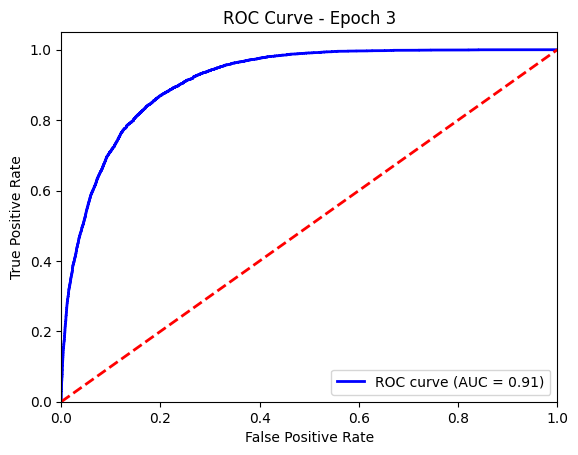

Epoch 4/10, Iteration 10/2533
Epoch 4/10, Iteration 20/2533
Epoch 4/10, Iteration 30/2533
Epoch 4/10, Iteration 40/2533
Epoch 4/10, Iteration 50/2533
Epoch 4/10, Iteration 60/2533
Epoch 4/10, Iteration 70/2533
Epoch 4/10, Iteration 80/2533
Epoch 4/10, Iteration 90/2533
Epoch 4/10, Iteration 100/2533
Epoch 4/10, Iteration 110/2533
Epoch 4/10, Iteration 120/2533
Epoch 4/10, Iteration 130/2533
Epoch 4/10, Iteration 140/2533
Epoch 4/10, Iteration 150/2533
Epoch 4/10, Iteration 160/2533
Epoch 4/10, Iteration 170/2533
Epoch 4/10, Iteration 180/2533
Epoch 4/10, Iteration 190/2533
Epoch 4/10, Iteration 200/2533
Epoch 4/10, Iteration 210/2533
Epoch 4/10, Iteration 220/2533
Epoch 4/10, Iteration 230/2533
Epoch 4/10, Iteration 240/2533
Epoch 4/10, Iteration 250/2533
Epoch 4/10, Iteration 260/2533
Epoch 4/10, Iteration 270/2533
Epoch 4/10, Iteration 280/2533
Epoch 4/10, Iteration 290/2533
Epoch 4/10, Iteration 300/2533
Epoch 4/10, Iteration 310/2533
Epoch 4/10, Iteration 320/2533
Epoch 4/10, Itera

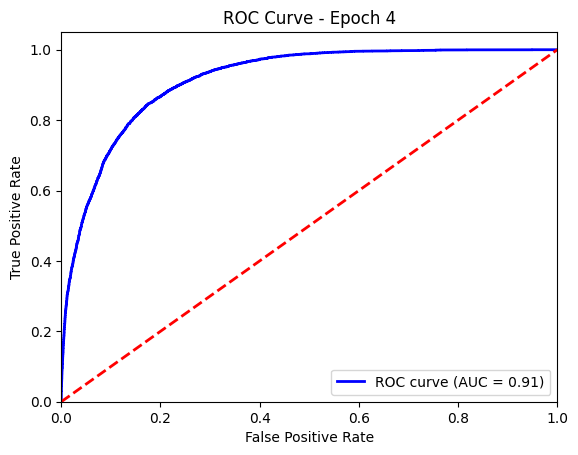

Epoch 5/10, Iteration 10/2533
Epoch 5/10, Iteration 20/2533
Epoch 5/10, Iteration 30/2533
Epoch 5/10, Iteration 40/2533
Epoch 5/10, Iteration 50/2533
Epoch 5/10, Iteration 60/2533
Epoch 5/10, Iteration 70/2533
Epoch 5/10, Iteration 80/2533
Epoch 5/10, Iteration 90/2533
Epoch 5/10, Iteration 100/2533
Epoch 5/10, Iteration 110/2533
Epoch 5/10, Iteration 120/2533
Epoch 5/10, Iteration 130/2533
Epoch 5/10, Iteration 140/2533
Epoch 5/10, Iteration 150/2533
Epoch 5/10, Iteration 160/2533
Epoch 5/10, Iteration 170/2533
Epoch 5/10, Iteration 180/2533
Epoch 5/10, Iteration 190/2533
Epoch 5/10, Iteration 200/2533
Epoch 5/10, Iteration 210/2533
Epoch 5/10, Iteration 220/2533
Epoch 5/10, Iteration 230/2533
Epoch 5/10, Iteration 240/2533
Epoch 5/10, Iteration 250/2533
Epoch 5/10, Iteration 260/2533
Epoch 5/10, Iteration 270/2533
Epoch 5/10, Iteration 280/2533
Epoch 5/10, Iteration 290/2533
Epoch 5/10, Iteration 300/2533
Epoch 5/10, Iteration 310/2533
Epoch 5/10, Iteration 320/2533
Epoch 5/10, Itera

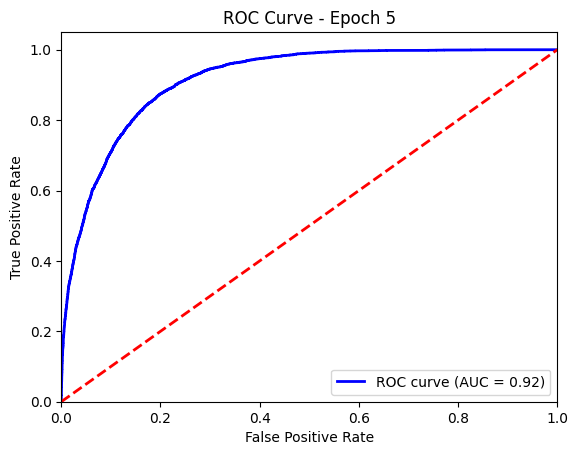

Epoch 6/10, Iteration 10/2533
Epoch 6/10, Iteration 20/2533
Epoch 6/10, Iteration 30/2533
Epoch 6/10, Iteration 40/2533
Epoch 6/10, Iteration 50/2533
Epoch 6/10, Iteration 60/2533
Epoch 6/10, Iteration 70/2533
Epoch 6/10, Iteration 80/2533
Epoch 6/10, Iteration 90/2533
Epoch 6/10, Iteration 100/2533
Epoch 6/10, Iteration 110/2533
Epoch 6/10, Iteration 120/2533
Epoch 6/10, Iteration 130/2533
Epoch 6/10, Iteration 140/2533
Epoch 6/10, Iteration 150/2533
Epoch 6/10, Iteration 160/2533
Epoch 6/10, Iteration 170/2533
Epoch 6/10, Iteration 180/2533
Epoch 6/10, Iteration 190/2533
Epoch 6/10, Iteration 200/2533
Epoch 6/10, Iteration 210/2533
Epoch 6/10, Iteration 220/2533
Epoch 6/10, Iteration 230/2533
Epoch 6/10, Iteration 240/2533
Epoch 6/10, Iteration 250/2533
Epoch 6/10, Iteration 260/2533
Epoch 6/10, Iteration 270/2533
Epoch 6/10, Iteration 280/2533
Epoch 6/10, Iteration 290/2533
Epoch 6/10, Iteration 300/2533
Epoch 6/10, Iteration 310/2533
Epoch 6/10, Iteration 320/2533
Epoch 6/10, Itera

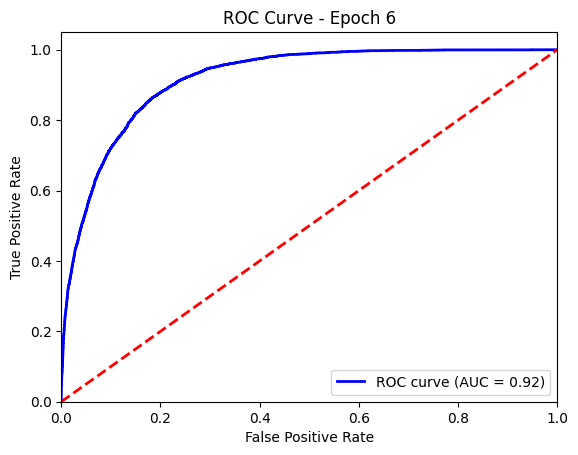

Epoch 7/10, Iteration 10/2533
Epoch 7/10, Iteration 20/2533
Epoch 7/10, Iteration 30/2533
Epoch 7/10, Iteration 40/2533
Epoch 7/10, Iteration 50/2533
Epoch 7/10, Iteration 60/2533
Epoch 7/10, Iteration 70/2533
Epoch 7/10, Iteration 80/2533
Epoch 7/10, Iteration 90/2533
Epoch 7/10, Iteration 100/2533
Epoch 7/10, Iteration 110/2533
Epoch 7/10, Iteration 120/2533
Epoch 7/10, Iteration 130/2533
Epoch 7/10, Iteration 140/2533
Epoch 7/10, Iteration 150/2533
Epoch 7/10, Iteration 160/2533
Epoch 7/10, Iteration 170/2533
Epoch 7/10, Iteration 180/2533
Epoch 7/10, Iteration 190/2533
Epoch 7/10, Iteration 200/2533
Epoch 7/10, Iteration 210/2533
Epoch 7/10, Iteration 220/2533
Epoch 7/10, Iteration 230/2533
Epoch 7/10, Iteration 240/2533
Epoch 7/10, Iteration 250/2533
Epoch 7/10, Iteration 260/2533
Epoch 7/10, Iteration 270/2533
Epoch 7/10, Iteration 280/2533
Epoch 7/10, Iteration 290/2533
Epoch 7/10, Iteration 300/2533
Epoch 7/10, Iteration 310/2533
Epoch 7/10, Iteration 320/2533
Epoch 7/10, Itera

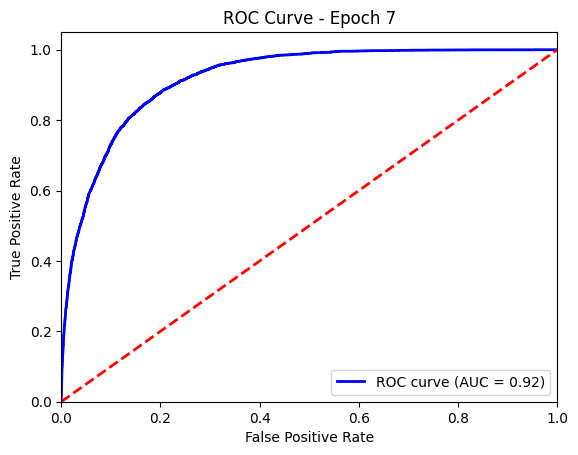

Epoch 8/10, Iteration 10/2533
Epoch 8/10, Iteration 20/2533
Epoch 8/10, Iteration 30/2533
Epoch 8/10, Iteration 40/2533
Epoch 8/10, Iteration 50/2533
Epoch 8/10, Iteration 60/2533
Epoch 8/10, Iteration 70/2533
Epoch 8/10, Iteration 80/2533
Epoch 8/10, Iteration 90/2533
Epoch 8/10, Iteration 100/2533
Epoch 8/10, Iteration 110/2533
Epoch 8/10, Iteration 120/2533
Epoch 8/10, Iteration 130/2533
Epoch 8/10, Iteration 140/2533
Epoch 8/10, Iteration 150/2533
Epoch 8/10, Iteration 160/2533
Epoch 8/10, Iteration 170/2533
Epoch 8/10, Iteration 180/2533
Epoch 8/10, Iteration 190/2533
Epoch 8/10, Iteration 200/2533
Epoch 8/10, Iteration 210/2533
Epoch 8/10, Iteration 220/2533
Epoch 8/10, Iteration 230/2533
Epoch 8/10, Iteration 240/2533
Epoch 8/10, Iteration 250/2533
Epoch 8/10, Iteration 260/2533
Epoch 8/10, Iteration 270/2533
Epoch 8/10, Iteration 280/2533
Epoch 8/10, Iteration 290/2533
Epoch 8/10, Iteration 300/2533
Epoch 8/10, Iteration 310/2533
Epoch 8/10, Iteration 320/2533
Epoch 8/10, Itera

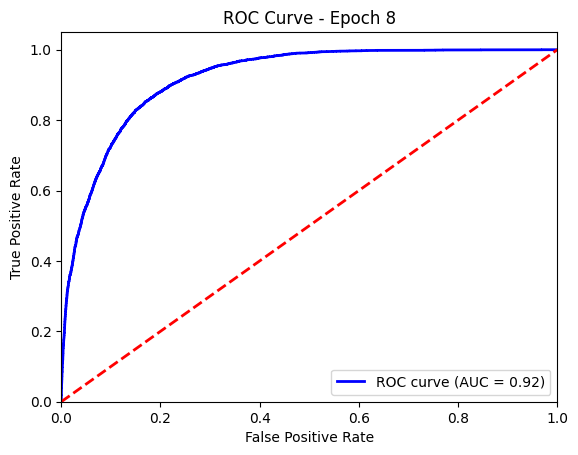

Epoch 9/10, Iteration 10/2533
Epoch 9/10, Iteration 20/2533
Epoch 9/10, Iteration 30/2533
Epoch 9/10, Iteration 40/2533
Epoch 9/10, Iteration 50/2533
Epoch 9/10, Iteration 60/2533
Epoch 9/10, Iteration 70/2533
Epoch 9/10, Iteration 80/2533
Epoch 9/10, Iteration 90/2533
Epoch 9/10, Iteration 100/2533
Epoch 9/10, Iteration 110/2533
Epoch 9/10, Iteration 120/2533
Epoch 9/10, Iteration 130/2533
Epoch 9/10, Iteration 140/2533
Epoch 9/10, Iteration 150/2533
Epoch 9/10, Iteration 160/2533
Epoch 9/10, Iteration 170/2533
Epoch 9/10, Iteration 180/2533
Epoch 9/10, Iteration 190/2533
Epoch 9/10, Iteration 200/2533
Epoch 9/10, Iteration 210/2533
Epoch 9/10, Iteration 220/2533
Epoch 9/10, Iteration 230/2533
Epoch 9/10, Iteration 240/2533
Epoch 9/10, Iteration 250/2533
Epoch 9/10, Iteration 260/2533
Epoch 9/10, Iteration 270/2533
Epoch 9/10, Iteration 280/2533
Epoch 9/10, Iteration 290/2533
Epoch 9/10, Iteration 300/2533
Epoch 9/10, Iteration 310/2533
Epoch 9/10, Iteration 320/2533
Epoch 9/10, Itera

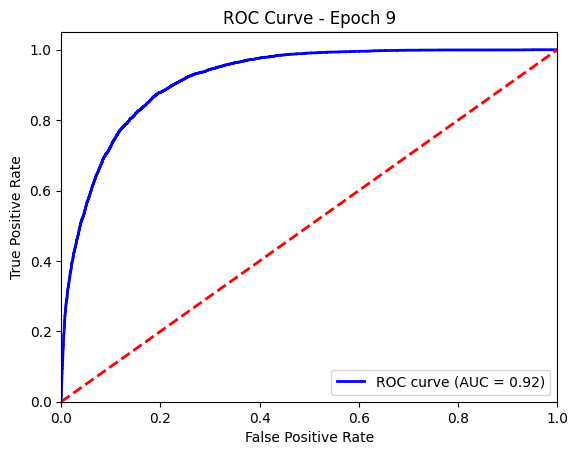

Epoch 10/10, Iteration 10/2533
Epoch 10/10, Iteration 20/2533
Epoch 10/10, Iteration 30/2533
Epoch 10/10, Iteration 40/2533
Epoch 10/10, Iteration 50/2533
Epoch 10/10, Iteration 60/2533
Epoch 10/10, Iteration 70/2533
Epoch 10/10, Iteration 80/2533
Epoch 10/10, Iteration 90/2533
Epoch 10/10, Iteration 100/2533
Epoch 10/10, Iteration 110/2533
Epoch 10/10, Iteration 120/2533
Epoch 10/10, Iteration 130/2533
Epoch 10/10, Iteration 140/2533
Epoch 10/10, Iteration 150/2533
Epoch 10/10, Iteration 160/2533
Epoch 10/10, Iteration 170/2533
Epoch 10/10, Iteration 180/2533
Epoch 10/10, Iteration 190/2533
Epoch 10/10, Iteration 200/2533
Epoch 10/10, Iteration 210/2533
Epoch 10/10, Iteration 220/2533
Epoch 10/10, Iteration 230/2533
Epoch 10/10, Iteration 240/2533
Epoch 10/10, Iteration 250/2533
Epoch 10/10, Iteration 260/2533
Epoch 10/10, Iteration 270/2533
Epoch 10/10, Iteration 280/2533
Epoch 10/10, Iteration 290/2533
Epoch 10/10, Iteration 300/2533
Epoch 10/10, Iteration 310/2533
Epoch 10/10, Iter

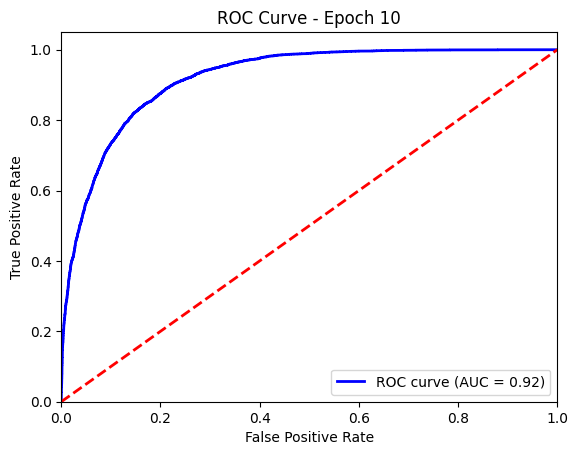

Model saved as 'best_model_64_batch_size.pth'


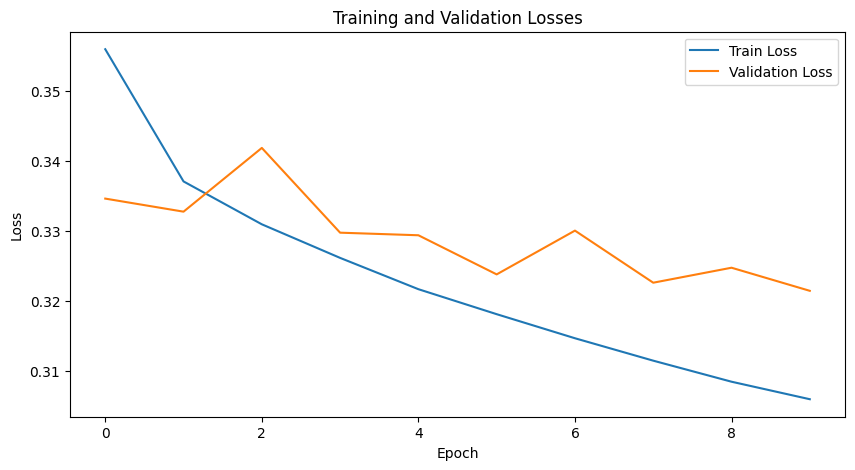

Accuracy: 0.8488
F1 Score: 0.6745
Precision: 0.7879
Confusion Matrix:
[[14024   854]
 [ 2209  3173]]


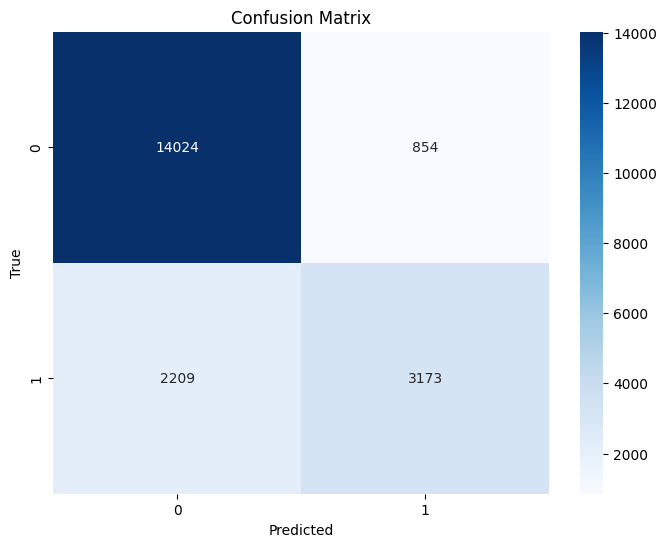

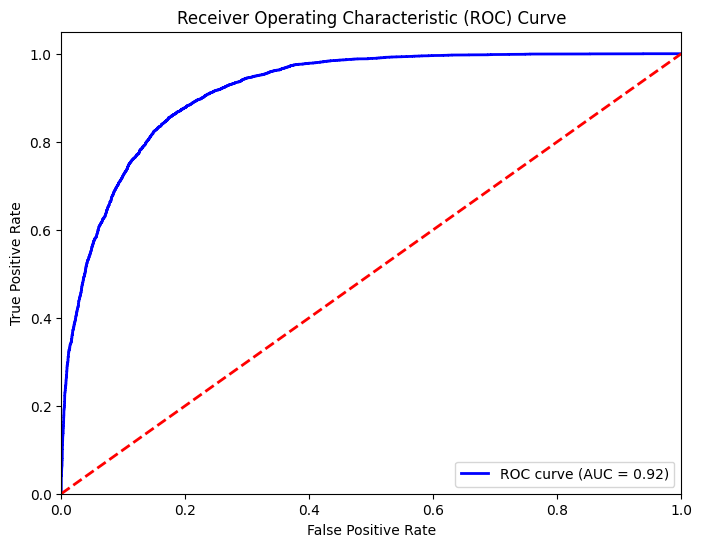

Test Accuracy: 0.8484
Test F1 Score: 0.6760
Test Precision: 0.7934
Test Confusion Matrix:
[[13986   834]
 [ 2237  3203]]


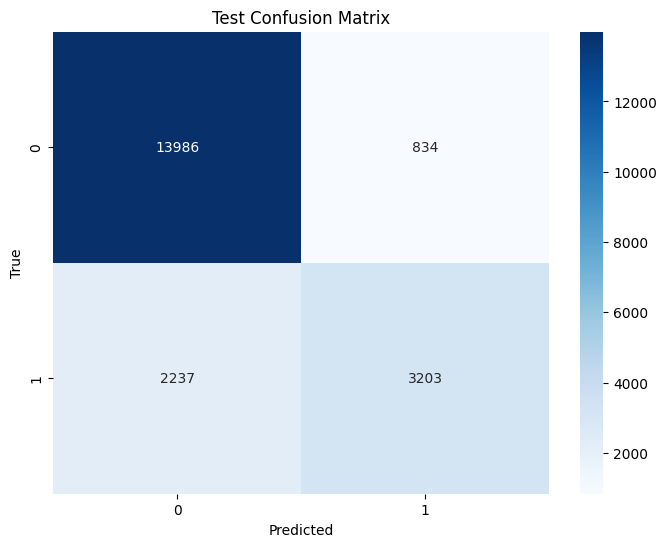

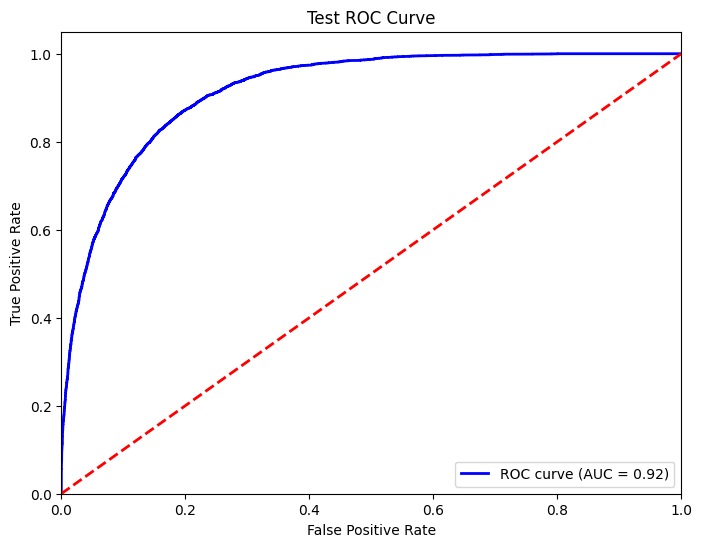

In [17]:
# Now we use fine-tuning on the ResNet-18 model
from torchvision import models
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, f1_score, precision_score, confusion_matrix, roc_curve, roc_auc_score
import copy
from sklearn.model_selection import train_test_split
import os
import numpy as np
import pandas as pd

# Define directories (paths should be correct for your setup)
dir_path = os.path.dirname(os.path.realpath('UMC301_Assignment_2.ipynb'))
label_dir = os.path.join(dir_path, 'face_images/face_image_attr.csv')
image_dir = os.path.join(dir_path, 'face_images/img_align_celeba')

# Load the labels
labels = pd.read_csv(label_dir)

# Take only image_id and Arched_Eyebrows columns
labels = labels[['image_id', 'Arched_Eyebrows']]

# Change the labels to 0 and 1
labels['Arched_Eyebrows'] = labels['Arched_Eyebrows'].apply(lambda x: 1 if x == 1 else 0)

# Perform a train-test-validation split (80% train, 10% validation, 10% test)
train, temp = train_test_split(labels, test_size=0.2, random_state=42)
val, test = train_test_split(temp, test_size=0.5, random_state=42)

# Get image file paths
train_images = [os.path.join(image_dir, image) for image in train['image_id']]
val_images = [os.path.join(image_dir, image) for image in val['image_id']]
test_images = [os.path.join(image_dir, image) for image in test['image_id']]

# Create label dictionaries
train_labels = dict(zip(train['image_id'], train['Arched_Eyebrows']))
val_labels = dict(zip(val['image_id'], val['Arched_Eyebrows']))
test_labels = dict(zip(test['image_id'], test['Arched_Eyebrows']))
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),  # Randomly flip the image horizontally
    transforms.RandomRotation(degrees=15),   # Randomly rotate the image within 15 degrees
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
# Load the pre-trained ResNet-18 model
model = models.resnet18(pretrained=True)

# Change the output layer for binary classification
model.fc = nn.Linear(512, 1)

# Freeze all layers except the last few (for fine-tuning)
for param in model.parameters():
    param.requires_grad = True

# Unfreeze the last fully connected layer (fc layer)
for param in model.fc.parameters():
    param.requires_grad = True



# Define the loss function for binary classification
criterion = nn.BCEWithLogitsLoss()

# Define the optimizer with lr=0.001
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, verbose=True)

# Define the dataset class (unchanged)
class FaceDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = Image.open(self.images[idx])
        label = self.labels[self.images[idx].split('/')[-1]]
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label, dtype=torch.float)

# Create the datasets and dataloaders
train_dataset = FaceDataset(train_images, train_labels, transform)
val_dataset = FaceDataset(val_images, val_labels, transform)
test_dataset = FaceDataset(test_images, test_labels, transform)

train_dataloader = DataLoader(train_dataset, batch_size=64, shuffle=False)
val_dataloader = DataLoader(val_dataset, batch_size=64, shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=64, shuffle=False)

# Move the model to the device
model = model.to(device)

# Train the model
n_epochs = 10  # Increase max epochs, early stopping will prevent overfitting
train_losses = []
val_losses = []

# Early stopping parameters
patience = 2
best_val_loss = float('inf')
counter = 0
best_model = None

def plot_roc_curve(fpr, tpr, roc_auc, epoch):
    plt.figure()
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - Epoch {epoch + 1}')
    plt.legend(loc="lower right")
    plt.show()
    
def evaluate_model(model, dataloader, device):
    model.eval()
    all_preds = []
    all_labels = []
    all_probs = []
    
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            output = model(images)
            probs = torch.sigmoid(output)
            preds = (probs > 0.5).float()
            
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    return np.array(all_preds), np.array(all_labels), np.array(all_probs)

for epoch in range(n_epochs):
    model.train()
    train_loss = 0
    n_iter = 0

    for images, labels in train_dataloader:
        images = images.to(device)
        labels = labels.to(device).unsqueeze(1)  # Add extra dimension for binary classification

        optimizer.zero_grad()
        output = model(images)
        loss = criterion(output, labels)
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        n_iter += 1
        if n_iter % 10 == 0:
            print(f'Epoch {epoch + 1}/{n_epochs}, Iteration {n_iter}/{len(train_dataloader)}')

    train_loss /= n_iter
    train_losses.append(train_loss)

    model.eval()
    val_loss = 0
    n_iter = 0

    for images, labels in val_dataloader:
        images = images.to(device)
        labels = labels.to(device).unsqueeze(1)  # Add extra dimension for binary classification

        with torch.no_grad():
            output = model(images)
            loss = criterion(output, labels)
            val_loss += loss.item()
            n_iter += 1

    val_loss /= n_iter
    val_losses.append(val_loss)

    print(f'Epoch {epoch + 1}/{n_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')
    
    # Evaluate on validation set
    val_preds, val_labels, val_probs = evaluate_model(model, val_dataloader, device)
    
    # Compute metrics
    accuracy = accuracy_score(val_labels, val_preds)
    f1 = f1_score(val_labels, val_preds)
    fpr, tpr, _ = roc_curve(val_labels, val_probs)
    roc_auc = roc_auc_score(val_labels, val_probs)
    
    print(f"Validation Accuracy: {accuracy:.4f}")
    print(f"Validation F1 Score: {f1:.4f}")
    print(f"Validation AUC: {roc_auc:.4f}")
    
    # Plot ROC curve
    plot_roc_curve(fpr, tpr, roc_auc, epoch)
    
    # Learning rate scheduler step
    scheduler.step(val_loss)
    
    # Early stopping
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        counter = 0
        best_model = copy.deepcopy(model.state_dict())
    else:
        counter += 1
        if counter >= patience:
            print(f"Early stopping triggered after {epoch + 1} epochs")
            break

# Load the best model
model.load_state_dict(best_model)

# Save the final model
torch.save(model.state_dict(), 'all_layers_full_data_64_batch_size.pth')
print("Model saved as 'all_layers_full_data_64_batch_size.pth'")

# Plot the losses
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Losses')
plt.show()


# Evaluate on validation set
val_preds, val_labels, val_probs = evaluate_model(model, val_dataloader, device)

# Compute metrics
accuracy = accuracy_score(val_labels, val_preds)
f1 = f1_score(val_labels, val_preds)
precision = precision_score(val_labels, val_preds)

print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")

# Compute confusion matrix
conf_matrix = confusion_matrix(val_labels, val_preds)
print("Confusion Matrix:")
print(conf_matrix)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Compute ROC curve and AUC score
fpr, tpr, _ = roc_curve(val_labels, val_probs)
roc_auc = roc_auc_score(val_labels, val_probs)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


test_preds, test_labels, test_probs = evaluate_model(model, test_dataloader, device)

# Compute test metrics
test_accuracy = accuracy_score(test_labels, test_preds)
test_f1 = f1_score(test_labels, test_preds)
test_precision = precision_score(test_labels, test_preds)

print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test F1 Score: {test_f1:.4f}")
print(f"Test Precision: {test_precision:.4f}")

# Compute test confusion matrix
test_conf_matrix = confusion_matrix(test_labels, test_preds)
print("Test Confusion Matrix:")
print(test_conf_matrix)

# Plot test confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(test_conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Test Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Compute ROC curve and AUC score for test set
test_fpr, test_tpr, _ = roc_curve(test_labels, test_probs)
test_roc_auc = roc_auc_score(test_labels, test_probs)

# Plot ROC curve for test set
plt.figure(figsize=(8, 6))
plt.plot(test_fpr, test_tpr, color='blue', lw=2, label=f'ROC curve (AUC = {test_roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Test ROC Curve')
plt.legend(loc="lower right")
plt.show()

### Model Selection for Question 2: Occlusion Experiment & Activation Maps

The **best model** has been saved as `**best_model_64_batch_size.pth**`. Moving forward with **Question 2**, this model will be used for:

- **Occlusion Experiment**
- **Generating Activation Maps and filters**

#### Model Performance Comparison:

The last three models, `**best_model_64_batch_size.pth**` , `**best_model_128_batch_size.pth**`and `** all_layers_full_data_64_batch_size.pth**` exhibit almost **equal performance** in terms of accuracy confusion matrix and AUC. However, the model `**best_model_64_batch_size.pth**` has a more balanced confusion matrix which means it is not biased towards any class.
Rest all other metrics are very close, so we will go with the model `**best_model_64_batch_size.pth**` for the subsequent experiments. 


##### Best Model (`**best_model_64_batch_size.pth**`) Results and Configuration :

### Test Set Performance

- **Test Accuracy**: 0.8372
- **Test F1 Score**: 0.6783
- **Test Precision**: 0.7226

### Model Configuration

- **Model Architecture**: ResNet-18 (Pretrained on ImageNet)
- **Final Layer**: Modified for binary classification (`fc = nn.Linear(512, 1)`)
- **Loss Function**: Binary Cross Entropy with logits (`nn.BCEWithLogitsLoss()`)
- **Optimizer**: Adam with a learning rate of 0.001
- **Learning Rate Scheduler**: ReduceLROnPlateau (Patience: 3, Factor: 0.1)
- **Batch Size**: 64
- **Epochs**: 10 (with early stopping after 2 epochs of no improvement in validation loss)
- **Data Augmentation**:
    - **Resizing**: Images resized to (224, 224)
    - **Random Horizontal Flip**: Applied with a probability of 0.5
    - **Random Rotation**: Images randomly rotated within ±15 degrees

### Performance Metrics on Test Set

- **Confusion Matrix**:
Test Confusion Matrix:
[[13485  1335]
 [ 1963  3477]]


- **ROC Curve**: 
- AUC: 0.90

## 📸 Question 2: Activation Maps, Filters & Occlusion Experiment

#### Let's start with understanding how the ResNet18 model's layers are structured and visualizing its filters. 🧠

We begin by exploring the shapes of the filters (kernels) in different layers of ResNet18. Below are the shapes of the convolutional layers:


In [93]:
import torch
import torchvision.models as models

# Load the pretrained ResNet model (or use your own model)
# Load the trained model
model_path = "/home/smehul/UMC301/ASSIGNMENTS/AssignmentII/model_unfreeze_last_two_layers_lr_0.01_plateau.pth"

# Load the ResNet18 model (assuming the fully connected layer was modified)
model = models.resnet18(pretrained=True)
model.fc = nn.Linear(512, 2)

# Load the saved model weights
model.load_state_dict(torch.load(model_path))
# Retrieve weights for each convolutional layer in each block

# Layer 1
layer1_conv1_weights = model.layer1[0].conv1.weight.data  # First convolution in layer 1
layer1_conv2_weights = model.layer1[0].conv2.weight.data  # Second convolution in layer 1

# Layer 2
layer2_conv1_weights = model.layer2[0].conv1.weight.data  # First convolution in layer 2
layer2_conv2_weights = model.layer2[0].conv2.weight.data  # Second convolution in layer 2

# Layer 3
layer3_conv1_weights = model.layer3[0].conv1.weight.data  # First convolution in layer 3
layer3_conv2_weights = model.layer3[0].conv2.weight.data  # Second convolution in layer 3

# Layer 4
layer4_conv1_weights = model.layer4[0].conv1.weight.data  # First convolution in layer 4
layer4_conv2_weights = model.layer4[0].conv2.weight.data  # Second convolution in layer 4

# Print the shapes to understand the dimensions of the filters
print("Layer 1 Conv1 shape:", layer1_conv1_weights.shape)
print("Layer 1 Conv2 shape:", layer1_conv2_weights.shape)
print("Layer 2 Conv1 shape:", layer2_conv1_weights.shape)
print("Layer 2 Conv2 shape:", layer2_conv2_weights.shape)
print("Layer 3 Conv1 shape:", layer3_conv1_weights.shape)
print("Layer 3 Conv2 shape:", layer3_conv2_weights.shape)
print("Layer 4 Conv1 shape:", layer4_conv1_weights.shape)
print("Layer 4 Conv2 shape:", layer4_conv2_weights.shape)


Layer 1 Conv1 shape: torch.Size([64, 64, 3, 3])
Layer 1 Conv2 shape: torch.Size([64, 64, 3, 3])
Layer 2 Conv1 shape: torch.Size([128, 64, 3, 3])
Layer 2 Conv2 shape: torch.Size([128, 128, 3, 3])
Layer 3 Conv1 shape: torch.Size([256, 128, 3, 3])
Layer 3 Conv2 shape: torch.Size([256, 256, 3, 3])
Layer 4 Conv1 shape: torch.Size([512, 256, 3, 3])
Layer 4 Conv2 shape: torch.Size([512, 512, 3, 3])


/tmp/ipykernel_15978/165868857.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


- **Layer 1**:
  - Conv1 shape: `torch.Size([64, 64, 3, 3])`
  - Conv2 shape: `torch.Size([64, 64, 3, 3])`
- **Layer 2**:
  - Conv1 shape: `torch.Size([128, 64, 3, 3])`
  - Conv2 shape: `torch.Size([128, 128, 3, 3])`
- **Layer 3**:
  - Conv1 shape: `torch.Size([256, 128, 3, 3])`
  - Conv2 shape: `torch.Size([256, 256, 3, 3])`
- **Layer 4**:
  - Conv1 shape: `torch.Size([512, 256, 3, 3])`
  - Conv2 shape: `torch.Size([512, 512, 3, 3])`

---

### 🔍 **Next Step**: Visualizing the Filters

We can now plot the filters for each layer of the model:

- For **Layer 1**:
  - Conv1 has **64 filters**
  - Conv2 has **64 filters**

- For **Layer 2**:
  - Conv1 has **128 filters**
  - Conv2 has **128 filters**

- For **Layer 3**:
  - Conv1 has **256 filters**
  - Conv2 has **256 filters**

- For **Layer 4**:
  - Conv1 has **512 filters**
  - Conv2 has **512 filters**

Using these filters, we'll visualize how they interact with images to extract features at various depths of the model. 🖼️

---

### 📊 **Activation Maps**: Let's see how the model sees!

Next, we move to **visualizing the activation maps**. These show us what features the model extracts from the image at different layers:

- **Layer 1**: 
  - Conv1 has **64 activation maps**
  - Conv2 has **64 activation maps**
  
- **Layer 2**:
  - Conv1 has **128 activation maps**
  - Conv2 has **128 activation maps**

- **Layer 3**:
  - Conv1 has **256 activation maps**
  - Conv2 has **256 activation maps**

- **Layer 4**:
  - Conv1 has **512 activation maps**
  - Conv2 has **512 activation maps**

---

((The code in below cells may have some lines which are redundant, please excuse them.))

/tmp/ipykernel_26559/355828930.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


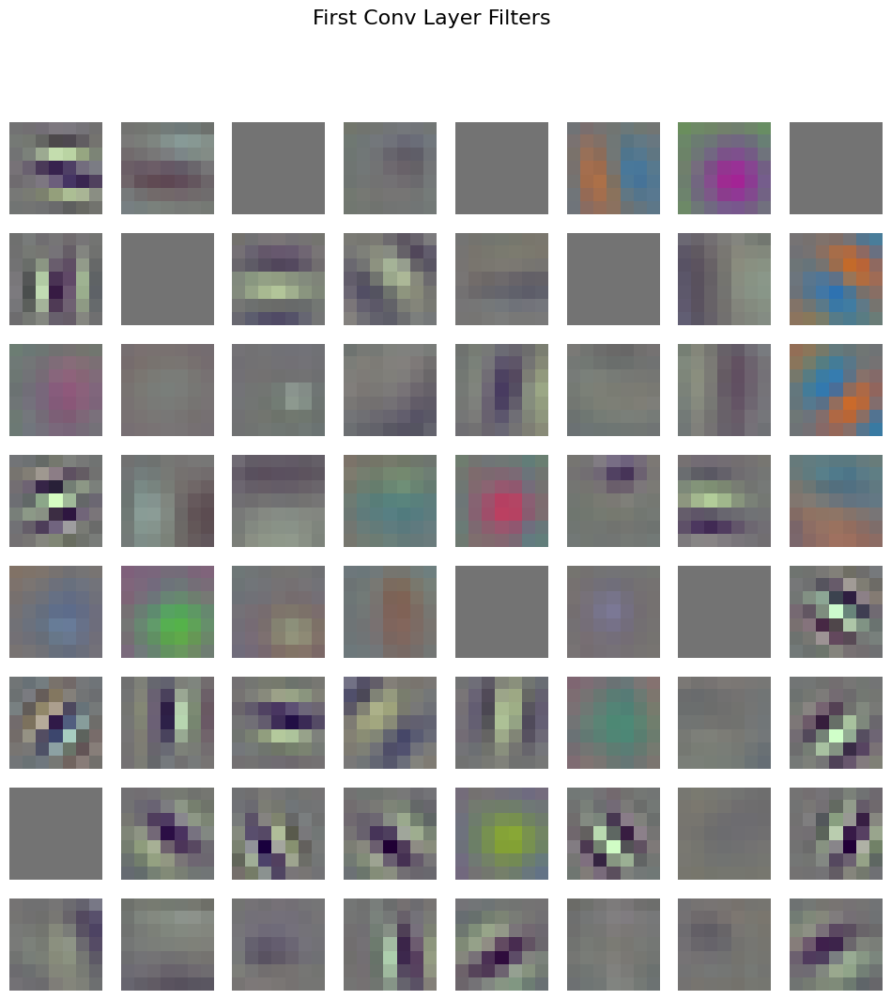

/tmp/ipykernel_26559/355828930.py:87: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


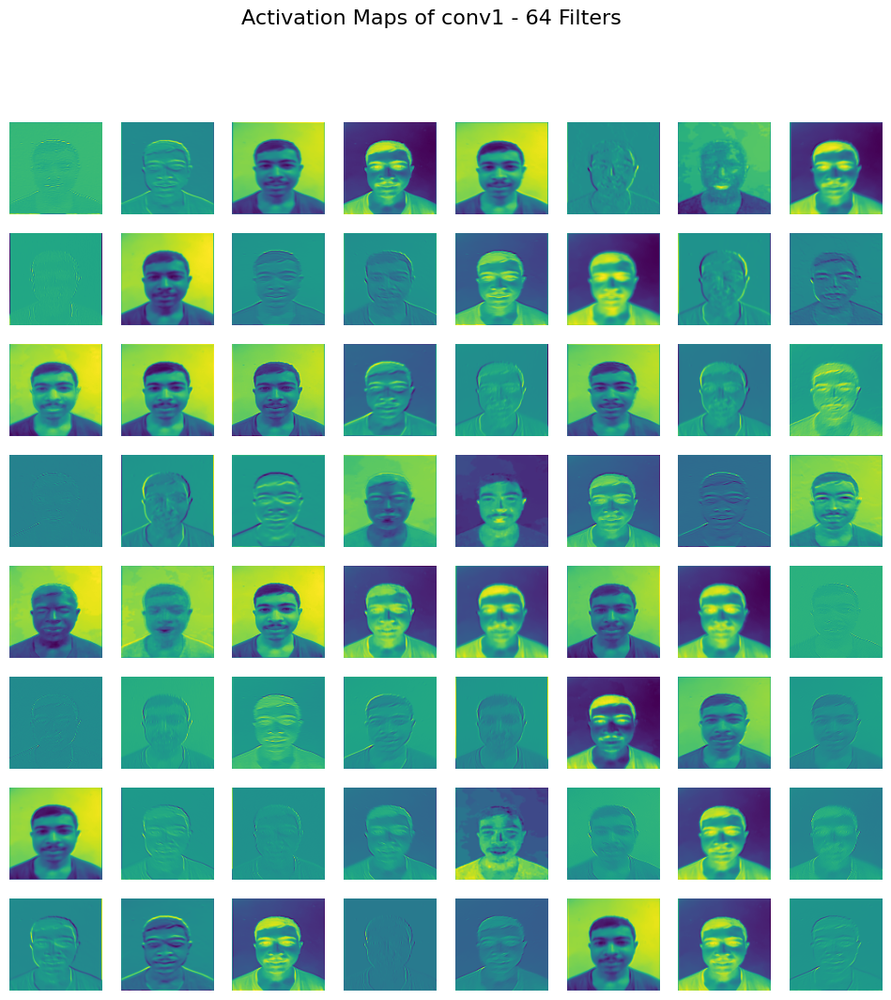

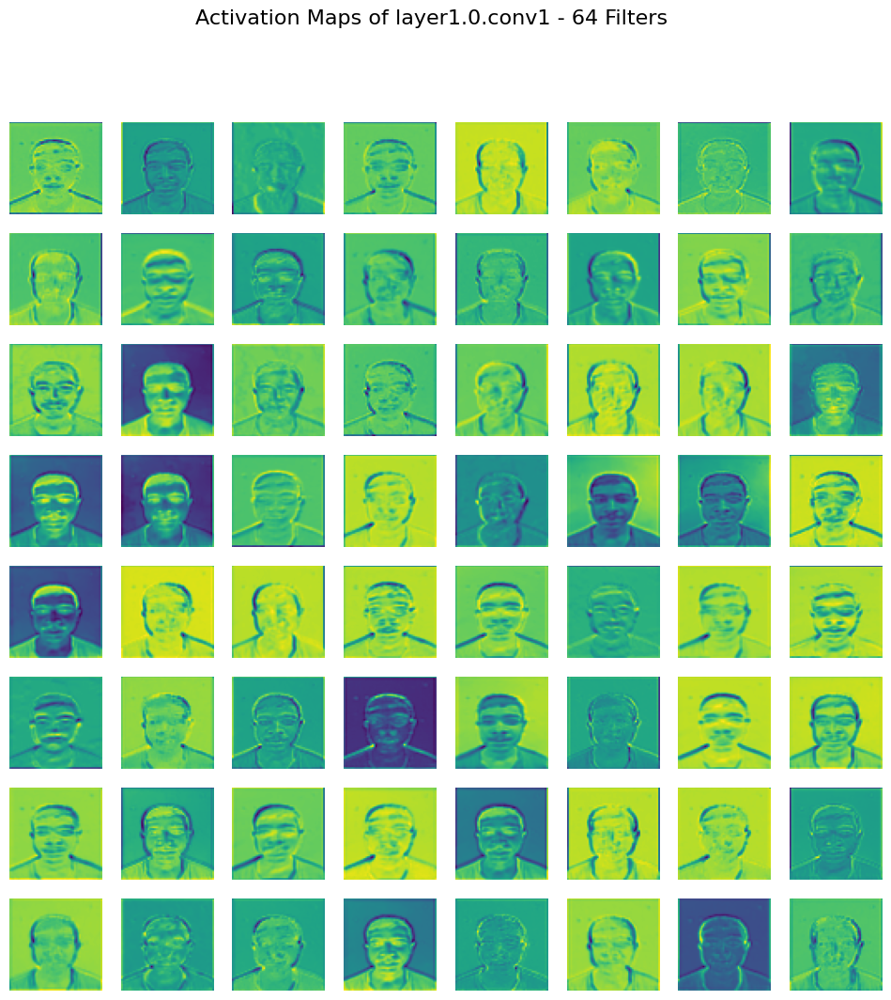

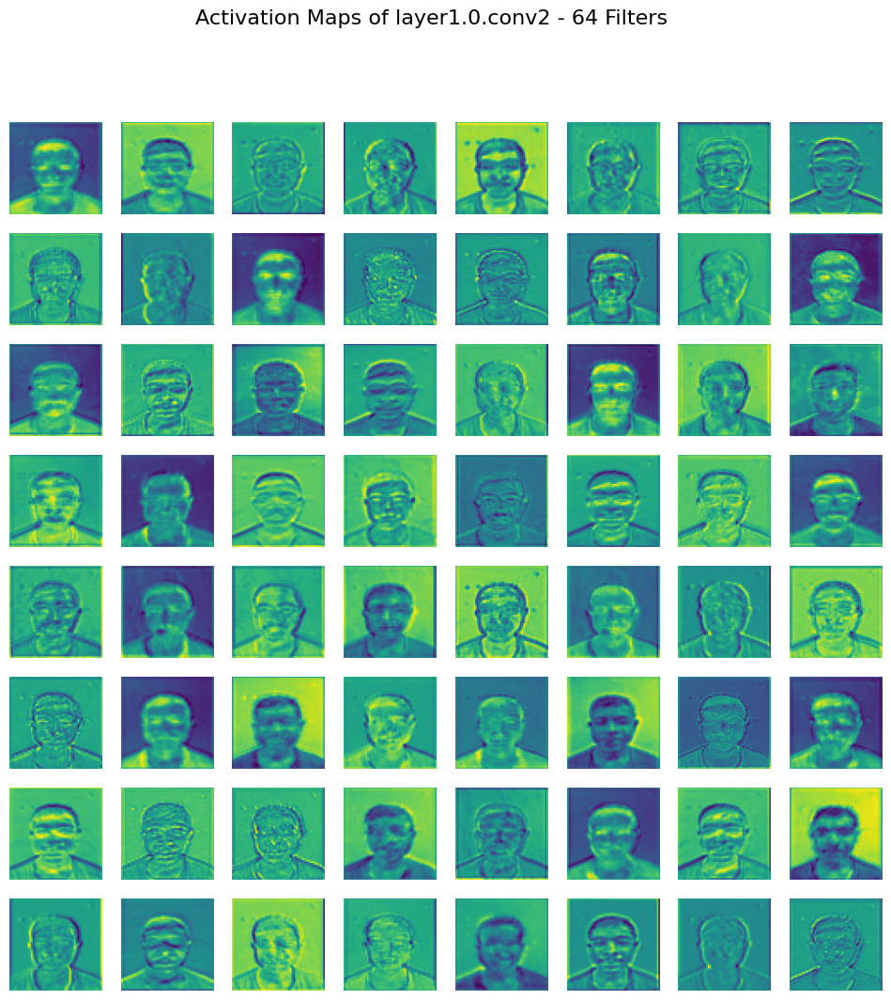

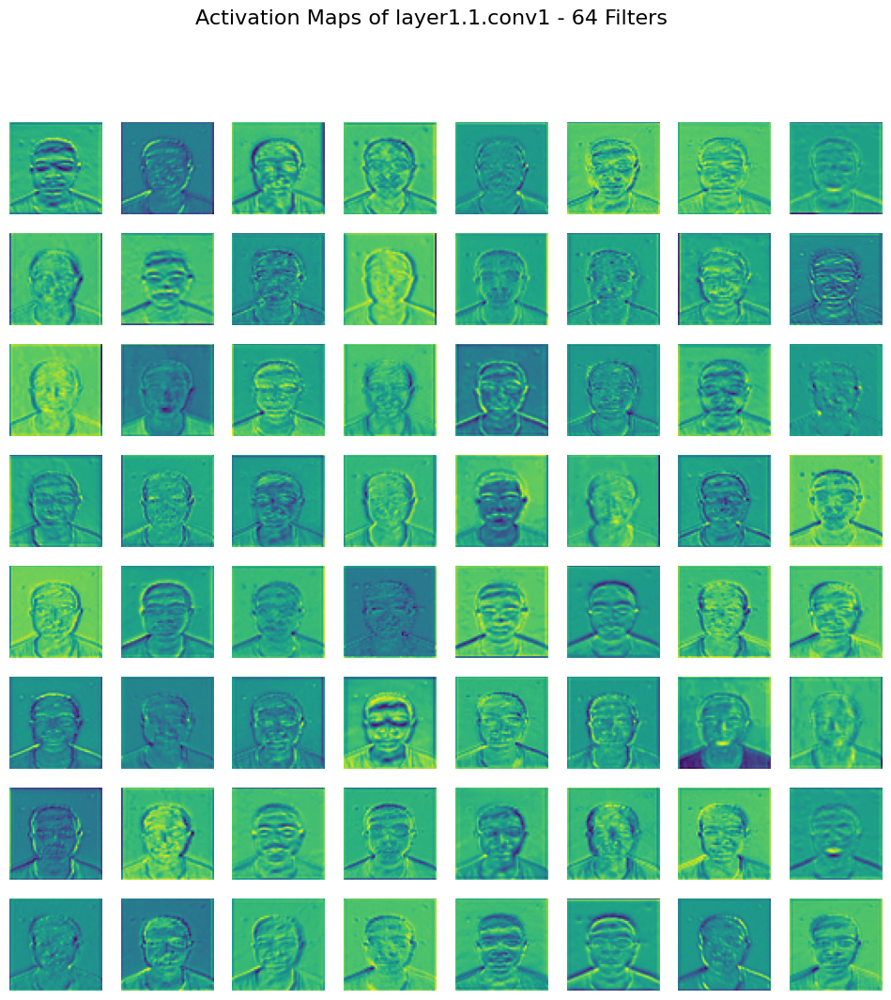

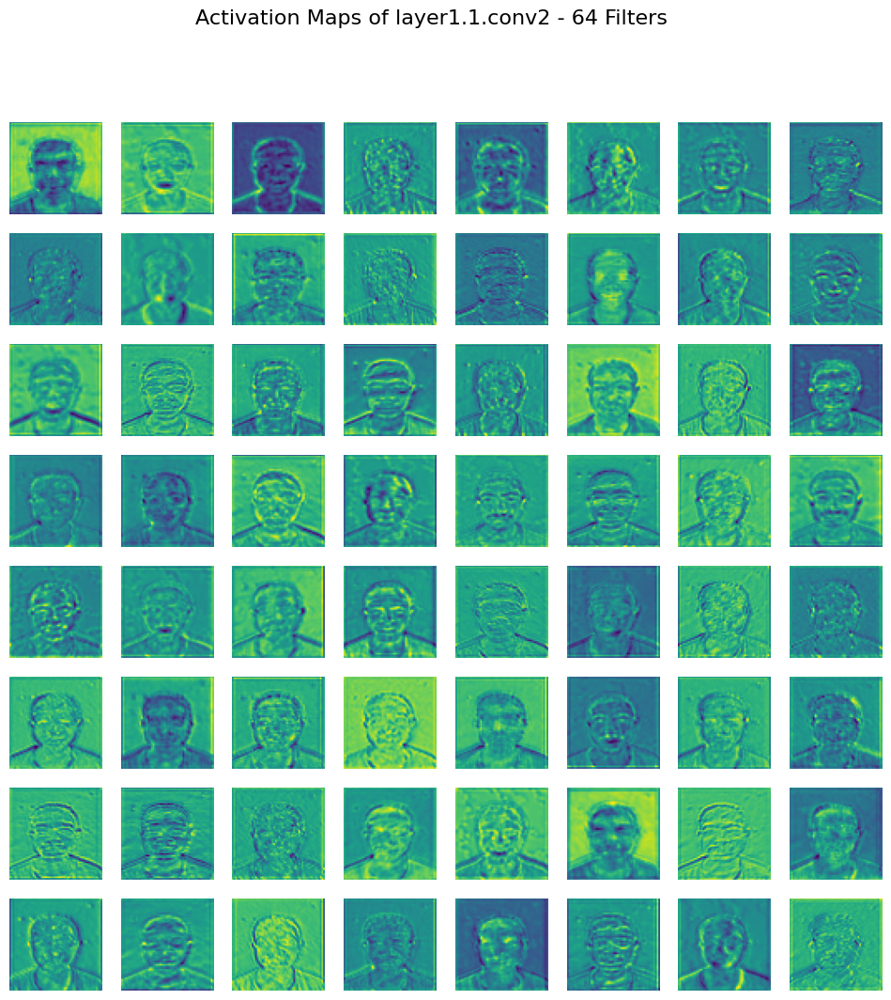

...

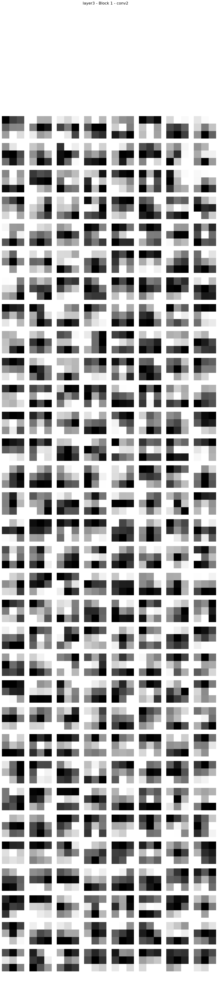

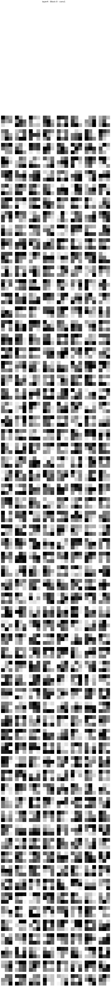

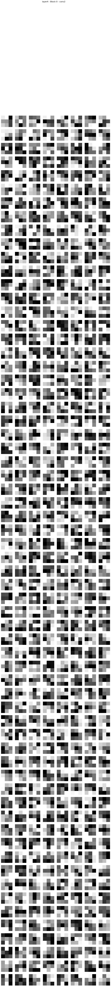

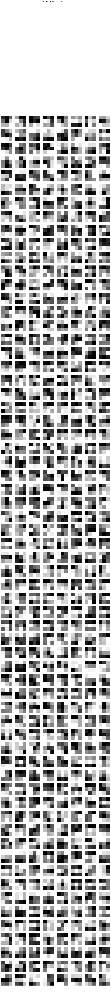

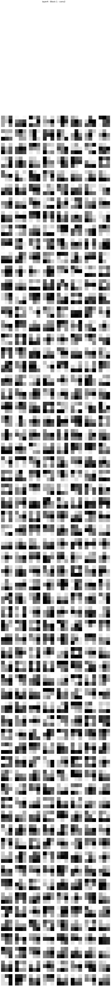

In [2]:
import torch
import torch.nn as nn
import torchvision.models as models
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as models
from PIL import Image
import matplotlib.pyplot as plt
import math
import torch.optim as optim
# Load the trained model
model_path = "/home/smehul/UMC301/ASSIGNMENTS/AssignmentII/best_model_64_batch_size.pth"

# Load the pre-trained ResNet-18 model
model = models.resnet18(pretrained=True)

# Change the output layer for binary classification (1 output unit)
model.fc = nn.Linear(512, 1)

# Load the saved model weights
model.load_state_dict(torch.load(model_path))

# Access the first convolutional layer's weights
first_conv_layer_weights = model.conv1.weight.data

# Function to plot filters for the first convolutional layer
def plot_first_conv_filters(t, num_filters=64):
    t_min = t.min()
    t_max = t.max()
    t = (t - t_min) / (t_max - t_min)  # Normalize for better visualization

    num_channels = t.shape[1]  # Number of channels (3 for RGB, 1 for grayscale)
    grid_size = int(num_filters ** 0.5)  # Set grid size for 8x8

    fig, axarr = plt.subplots(grid_size, grid_size, figsize=(12, 12))
    fig.suptitle('First Conv Layer Filters', fontsize=16)

    for idx in range(min(num_filters, t.shape[0])):
        ax = axarr[idx // grid_size, idx % grid_size]

        if num_channels == 3:  # RGB filters
            img = t[idx].permute(1, 2, 0).numpy()  # Convert to (H, W, C)
            ax.imshow(img)
        else:  # Grayscale filters
            img = t[idx, 0].numpy()
            ax.imshow(img, cmap="gray")

        ax.axis('off')

    plt.show()

# Plot the filters from the first convolutional layer
plot_first_conv_filters(first_conv_layer_weights)


# Load the pre-trained ResNet-18 model
model = models.resnet18(pretrained=True)

# Change the output layer for binary classification (1 output unit)
model.fc = nn.Linear(512, 1)

# Freeze all layers except the last few (for fine-tuning)
for param in model.parameters():
    param.requires_grad = False

# Unfreeze the last fully connected layer (fc layer)
for param in model.fc.parameters():
    param.requires_grad = True

# Unfreeze the last layer (layer4 block) of ResNet
for param in model.layer4.parameters():
    param.requires_grad = True

# Define the loss function for binary classification
criterion = nn.BCEWithLogitsLoss()

# Define the optimizer with lr=0.001
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, verbose=True)

# Load the trained model (if you have one)
model_path = "/home/smehul/UMC301/ASSIGNMENTS/AssignmentII/best_model_64_batch_size.pth"
model.load_state_dict(torch.load(model_path))

# Set the model to evaluation mode
model.eval()

# Define image path
image_path = "/home/smehul/UMC301/ASSIGNMENTS/AssignmentII/my_image_new.jpeg"  # Your image path

# Load and preprocess the image
image = Image.open(image_path)
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize image to 224x224 as expected by ResNet
    transforms.ToTensor(),  # Convert image to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # Normalize with ImageNet stats
])
input_image = preprocess(image).unsqueeze(0)  # Add batch dimension

# Define hooks to extract activations from each convolutional layer
activation_maps = {}

def hook_fn(module, input, output, layer_name):
    # Save the activation output
    activation_maps[layer_name] = output

# Attach hooks to each convolutional layer (before fc layer)
hooks = []
def register_hooks(model):
    for name, module in model.named_modules():
        if isinstance(module, nn.Conv2d):  # Target convolutional layers
            hooks.append(module.register_forward_hook(lambda module, input, output, name=name: hook_fn(module, input, output, name)))

register_hooks(model)

# Perform a forward pass through the model to capture activations
with torch.no_grad():
    _ = model(input_image)

def plot_activation_maps(activation, layer_name):
    num_filters = activation.shape[1]  # Number of filters in this layer
    grid_size = math.ceil(num_filters ** 0.5)  # Determine the grid size, ceil to account for non-square filter numbers

    fig, axarr = plt.subplots(grid_size, grid_size, figsize=(12, 12))
    fig.suptitle(f'Activation Maps of {layer_name} - {num_filters} Filters', fontsize=16)  # Include number of filters in title

    # Flatten the grid if there are fewer filters than grid spots
    axarr = axarr.flatten()

    for idx in range(num_filters):
        ax = axarr[idx]
        img = activation[0, idx].cpu().numpy()  # Extract the activation map (1, C, H, W)
        ax.imshow(img, cmap="viridis")  # You can choose a different colormap if needed
        ax.axis('off')

    # Hide any unused subplots
    for i in range(num_filters, len(axarr)):
        axarr[i].axis('off')

    plt.show()

# Plot the activation maps for each convolutional layer
for layer_name, activation in activation_maps.items():
    plot_activation_maps(activation, layer_name)

# Remove hooks after use
for hook in hooks:
    hook.remove()

# Function to visualize filters with labels
def visualize_filters(weights, num_filters, layer_name, block_num, conv_layer_name):
    n_cols = 8  # Number of columns to display filters
    n_rows = (num_filters // n_cols) + 1  # Number of rows for the grid (add one to handle remainders)

    fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols * 2, n_rows * 2))  # Adjust figure size for better readability
    fig.suptitle(f"{layer_name} - Block {block_num} - {conv_layer_name}", fontsize=16)

    for i in range(num_filters):
        filter = weights[i].cpu().detach().numpy()

        # Normalize the filter to [0, 1] for visualization
        filter = (filter - filter.min()) / (filter.max() - filter.min())

        # Plot the filter, handle case where there might be empty plots
        row, col = i // n_cols, i % n_cols
        axs[row, col].imshow(filter[0], cmap='gray')
        axs[row, col].axis('off')

    # Hide any unused subplots
    for j in range(i + 1, n_rows * n_cols):
        axs[j // n_cols, j % n_cols].axis('off')

    plt.show()

# Visualize filters after convolutional layers
layers_to_visualize = [
    ('layer1', model.layer1),
    ('layer2', model.layer2),
    ('layer3', model.layer3),
    ('layer4', model.layer4)
]

for layer_name, layer in layers_to_visualize:
    for i, block in enumerate(layer):
        # Extract filters from conv1 and conv2
        conv1_weights = block.conv1.weight.data
        conv2_weights = block.conv2.weight.data

        # Visualize filters with block and layer labels
        visualize_filters(conv1_weights, conv1_weights.shape[0], layer_name, i, "conv1")
        visualize_filters(conv2_weights, conv2_weights.shape[0], layer_name, i, "conv2")


### Model Testing: Checking for Arched Eyebrows on Custom Image

We are now testing the model on a custom image to determine whether it has **arched eyebrows** or not. The model will also provide the **probability score** associated with the prediction.

This process will help us verify how well the model generalizes to new, unseen data.


/tmp/ipykernel_26559/33794249.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))
Clipping input data to 

The image is classified as 'Not Arched Eyebrows' with probability 0.79


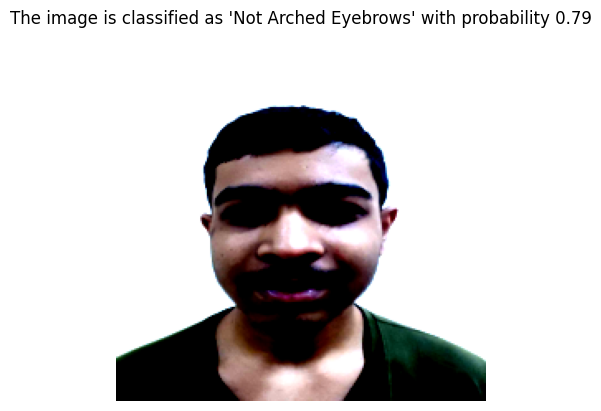

In [3]:
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt

# Set device for the model
device = "cpu"

# Define the transformation used during training
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load the model
def load_model(model_path):
    model = models.resnet18(pretrained=True)
    
    # Freeze all layers
    for param in model.parameters():
        param.requires_grad = False
    
    # Unfreeze the last layer (layer4 block) of ResNet
    for param in model.layer4.parameters():
        param.requires_grad = True
    
    # Change the output layer for binary classification (1 output unit)
    model.fc = nn.Linear(512, 1)
    
    # Load the trained weights
    model.load_state_dict(torch.load(model_path, map_location=device))
    model = model.to(device)
    model.eval()  # Set the model to evaluation mode
    return model

# Function to predict the label for an input image
def predict_image(image_path, model):
    # Load the image
    image = Image.open(image_path)
    image = transform(image).unsqueeze(0)  # Add batch dimension

    # Send the image to the device
    image = image.to(device)

    # Run the model on the image
    with torch.no_grad():
        output = model(image)
    
    # Apply sigmoid to get probability
    probability = torch.sigmoid(output).item()
    
    # Classify based on probability
    predicted_label = 1 if probability > 0.5 else 0
    
    return predicted_label, probability, image

# Model path and image path
model_path = "/home/smehul/UMC301/ASSIGNMENTS/AssignmentII/best_model_64_batch_size.pth"
image_path = '/home/smehul/UMC301/ASSIGNMENTS/AssignmentII/my_image_new.jpeg'

# Load the model
model = load_model(model_path)

# Predict the label of the image
predicted_label, probability, image = predict_image(image_path, model)

# Print the result
if predicted_label == 0:
    result = f"The image is classified as 'Not Arched Eyebrows' with probability {1 - probability:.2f}"
else:
    result = f"The image is classified as 'Arched Eyebrows' with probability {probability:.2f}"

print(result)

# Plot the image
plt.imshow(image.squeeze(0).permute(1, 2, 0))  # Undo the normalization for displaying the image
plt.axis('off')
plt.title(result)
plt.show()


### 📷 **Occlusion Experiment**: How sensitive is the model?

Now that we have a clear understanding of the filters and activations, we will perform an **occlusion experiment**.

In this experiment, we will block (or occlude) certain portions of the image to see how much it impacts the model's predictions. By doing this, we can observe which parts of the image the model finds most important for making its decision. 🧐

---

### Explanation of the code in next two cells:
### Occlusion Experiment to Detect Arched Eyebrows

In the code above, we perform an **occlusion experiment** on an image to understand how different parts of the image influence the model's prediction for **arched eyebrows**. Here's a summary of the key steps involved:

1. **Image Preprocessing**:
   - The image is resized to **224x224 pixels** and normalized using the mean and standard deviation of the ImageNet dataset (as the ResNet model was pre-trained on ImageNet).
   - The image is transformed into a tensor and passed through the preprocessing pipeline.

2. **Occlusion Function**:
   - The **occlusion experiment** involves sliding a window of size `32x32` pixels across the image with a stride of `16` pixels.
   - In each step, a patch of the image is occluded (i.e., a black square is placed over the patch), and the model is run on the modified image.
   - The **prediction probability** (whether the image has arched eyebrows or not) is recorded for each occluded region.
   - This process creates a **heatmap**, where each pixel in the heatmap represents the model's prediction for the corresponding region of the image.

3. **Prediction**:
   - After occlusion, the model's prediction is computed using the modified image, and the **occlusion heatmap** is generated to visualize which parts of the image influence the model's decision.
   
4. **Visualization**:
   - The **original image** and the **occlusion heatmap** are displayed side by side.
   - The heatmap uses a **jet color scale**, where areas with higher prediction scores are highlighted.

5. **Final Prediction**:
   - The final model prediction is obtained for the **non-occluded image**.
   - The prediction is compared against a threshold (0.5) to decide whether the image shows **arched eyebrows** or not.
   - The result, along with the prediction probability, is printed in the console.

This experiment helps us understand which parts of the image are more relevant for the model's prediction, and which regions contribute the most towards detecting **arched eyebrows**.


In [10]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from torchvision import models, transforms
from PIL import Image
import torch.nn as nn

# Preprocessing transformations for input image
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load the pre-trained ResNet18 model
model = models.resnet18(pretrained=True)

# Modify the output layer for binary classification (Arched Eyebrows)
model.fc = nn.Linear(model.fc.in_features, 1)  # Binary output for Arched Eyebrows

# Load the trained model weights without printing the model
model.load_state_dict(torch.load('/home/smehul/UMC301/ASSIGNMENTS/AssignmentII/best_model_64_batch_size.pth', map_location=torch.device('cpu')))

# Set the model to evaluation mode to disable dropout and batch normalization
model.eval()

def get_prediction(input_image):
    with torch.no_grad():
        output = model(input_image)
        prediction = torch.sigmoid(output).item()  # Apply sigmoid for binary output
    return prediction

# Occlusion function
def occlusion_experiment(input_image, occlusion_size=32, stride=16):
    _, _, height, width = input_image.shape
    heatmap = np.zeros((height, width))
    
    # Iterate over the image with a sliding window
    for h in range(0, height, stride):
        for w in range(0, width, stride):
            # Make a copy of the original image
            occluded_image = input_image.clone()
            
            # Apply a mask (mean of the dataset used for normalization) to the image patch
            occluded_image[:, :, h:h+occlusion_size, w:w+occlusion_size] = 0  # Mask out the region
            
            # Get the model's prediction on the occluded image
            pred = get_prediction(occluded_image)
            
            # Assign the prediction to the corresponding region in the heatmap
            heatmap[h:h+occlusion_size, w:w+occlusion_size] = pred
    
    return heatmap

/tmp/ipykernel_26559/1467782164.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/home/smehul/UMC301/ASSIGNMENTS/AssignmentII/best_mode

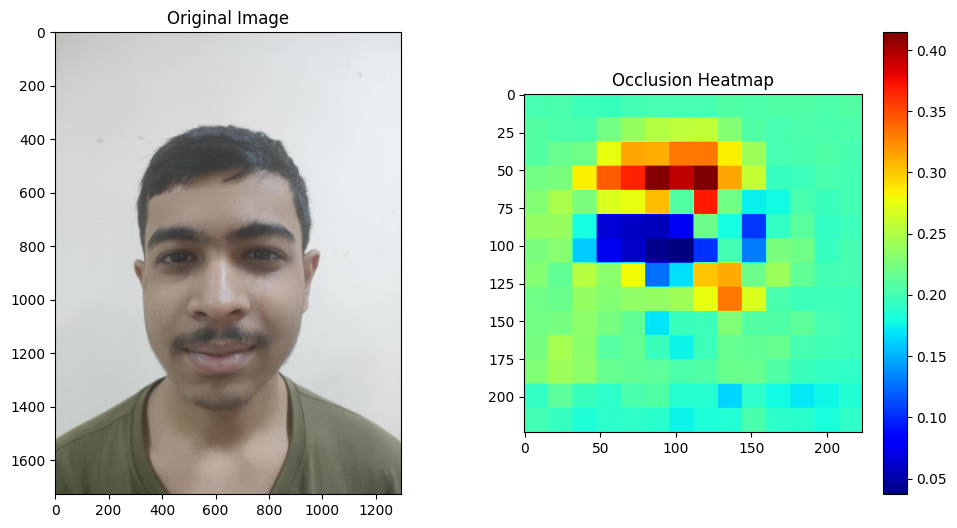

not arched with 0.7945


In [11]:
#img_path = ''  # Replace with your image path
img_path = '/home/smehul/UMC301/ASSIGNMENTS/AssignmentII/my_image_new.jpeg'  # Replace with your image path
image = Image.open(img_path).convert('RGB')

# Preprocess the image
input_image = preprocess(image).unsqueeze(0)  # Add batch dimension
occlusion_heatmap = occlusion_experiment(input_image)

# Plot the original image and the occlusion heatmap
plt.figure(figsize=(12, 6))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(np.array(image))
plt.title("Original Image")

# Occlusion heatmap
plt.subplot(1, 2, 2)
plt.imshow(occlusion_heatmap, cmap='jet')
plt.colorbar()
plt.title("Occlusion Heatmap")

plt.show()

# Get final prediction for the full image
final_prediction = get_prediction(input_image)

# Print the prediction for "Arched_Eyebrows"
if final_prediction >= 0.5:
    print(f"arched with probability {final_prediction:.4f}")
else:
    print(f"not arched with {1 - final_prediction:.4f}")

## Interpreting the Occlusion Heatmap

To interpret the occlusion heatmap, we need to understand what the colors represent:

- **Blue colors** represent lower values
- **Red colors** represent higher values

In the context of your occlusion experiment:

- **Lower values (blue)** indicate areas where occluding that region caused a significant drop in the prediction score for "Arched Eyebrows".
- **Higher values (red)** indicate areas where occluding that region had little effect on the prediction.

Therefore, the model is focusing more on the **blue regions**. These are the areas that, when occluded, caused the most significant change in the model's prediction. In other words, the **blue areas** are the most important for the model's decision-making process regarding whether the eyebrows are arched or not.


## Grad-CAM Visualization for Arched Eyebrows Detection

In the code above, we implement **Grad-CAM** (Gradient-weighted Class Activation Mapping) to visualize the important regions of the image that influence the model's prediction of **arched eyebrows**. Here's a breakdown of the key steps:

1. **Image Preprocessing**:
   - The image is resized to **224x224 pixels**, normalized using the **ImageNet mean and standard deviation** values, and transformed into a tensor.
   - The batch dimension is added to the image tensor to comply with the model's input format.

2. **Model Setup**:
   - We load the **pre-trained ResNet18 model** and modify its final layer to output **binary classification** (1 for arched eyebrows, 0 for non-arched eyebrows).
   - The **trained model weights** are loaded from a file to ensure that the model is updated with the trained parameters.

3. **Grad-CAM Implementation**:
   - The **final convolutional layer** of the model (`model.layer4[-1]`) is selected to capture the activation maps and gradients during the forward and backward passes.
   - We set up **hooks** to store activations and gradients from this layer:
     - The **forward hook** captures the activations (feature maps) from the last convolutional layer.
     - The **backward hook** captures the gradients flowing through the network.
   
4. **Forward and Backward Pass**:
   - The input image is passed through the model in a forward pass.
   - Then, a backward pass is performed by calling `output.backward()` to compute the gradients with respect to the output. These gradients help highlight the important regions in the image for the model's prediction.

5. **Computing Grad-CAM**:
   - **Global average pooling** is applied to the gradients to obtain the average importance of each channel in the feature map.
   - The gradients are multiplied with the activations, and the **weighted activations** are summed across all channels to produce the Grad-CAM heatmap.
   - The heatmap is **normalized** to the range [0, 1] for visualization.

6. **Heatmap Visualization**:
   - The heatmap is resized to match the size of the input image (224x224 pixels).
   - The **heatmap is color-mapped** using the JET colormap, which makes the regions of interest more visible.
   - The image is **unnormalized** and converted back to its original format for overlaying the heatmap.

7. **Overlay Heatmap on the Image**:
   - The Grad-CAM heatmap is overlaid on the original image to show the regions where the model is focusing for making its prediction.
   - The original image, the Grad-CAM heatmap, and the **heatmap overlay** are plotted side-by-side for better visualization.

### Key Visual Outputs:
1. **Original Image**: Shows the input image to the model.
2. **Grad-CAM Heatmap**: Highlights the regions that the model considers important for its prediction.
3. **Heatmap Overlay**: Combines the original image and heatmap to visualize how the model's attention correlates with arched eyebrows.

This Grad-CAM visualization helps to interpret and understand the parts of the image that the model uses to make decisions about whether the image contains arched eyebrows.


/tmp/ipykernel_26559/3049971230.py:27: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/home/smehul/UMC301/ASSIGNMENTS/AssignmentII/best_mode

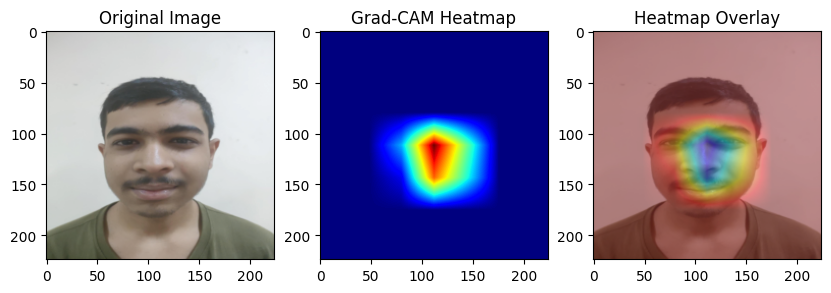

In [7]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from torchvision import models, transforms
from PIL import Image
import torch.nn as nn
import cv2

# Preprocess the image
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load the image and preprocess it
img_path = '/home/smehul/UMC301/ASSIGNMENTS/AssignmentII/my_image_new.jpeg'
img = Image.open(img_path)
input_tensor = preprocess(img)
input_tensor = input_tensor.unsqueeze(0)  # Create batch dimension

# Load the pre-trained model and modify it
model = models.resnet18(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, 1)  # Binary output for Arched Eyebrows

# Load the trained weights (Replace with your actual saved model path)
model.load_state_dict(torch.load('/home/smehul/UMC301/ASSIGNMENTS/AssignmentII/best_model_64_batch_size.pth', map_location=torch.device('cpu')))
model.eval()

# Grad-CAM: Capture gradients from the final convolutional layer
gradients = None
activation = None

def save_gradient(grad):
    global gradients
    gradients = grad

# Get the target convolutional layer
target_layer = model.layer4[-1]

# Hook to capture gradients
def forward_hook(module, input, output):
    global activation
    activation = output  # Save activation from the layer

target_layer.register_forward_hook(forward_hook)
target_layer.register_backward_hook(lambda module, grad_input, grad_output: save_gradient(grad_output[0]))

# Forward pass
output = model(input_tensor)

# Perform backward pass to get gradients
model.zero_grad()
output.backward()

# Compute Grad-CAM
pooled_gradients = torch.mean(gradients, dim=[0, 2, 3])  # Global average pooling of gradients

# Multiply the gradients with the activations
for i in range(activation.shape[1]):
    activation[:, i, :, :] *= pooled_gradients[i]

# Average the channels to get the final Grad-CAM heatmap
grad_cam = torch.mean(activation, dim=1).squeeze()

# Normalize the Grad-CAM heatmap to [0, 1]
grad_cam = torch.clamp(grad_cam, min=0)
grad_cam -= grad_cam.min()
grad_cam /= grad_cam.max()

# Convert the heatmap to numpy
grad_cam = grad_cam.detach().cpu().numpy()

# Resize heatmap to match the input image size
grad_cam = cv2.resize(grad_cam, (224, 224))

# Convert the heatmap to RGB
heatmap = cv2.applyColorMap(np.uint8(255 * grad_cam), cv2.COLORMAP_JET)

# Convert the image to numpy and unnormalize for visualization
unnormalize = transforms.Normalize(
    mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
    std=[1 / 0.229, 1 / 0.224, 1 / 0.225]
)
unnormalized_img = unnormalize(input_tensor[0]).permute(1, 2, 0).detach().cpu().numpy()

# Overlay the heatmap on the image
overlayed_img = cv2.addWeighted(np.uint8(255 * unnormalized_img), 0.6, heatmap, 0.4, 0)

# Plot the original image, heatmap, and overlayed image
plt.figure(figsize=(10, 10))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(np.uint8(255 * unnormalized_img))
plt.title('Original Image')

# Grad-CAM Heatmap
plt.subplot(1, 3, 2)
plt.imshow(grad_cam, cmap='jet')
plt.title('Grad-CAM Heatmap')

# Overlayed Heatmap on Image
plt.subplot(1, 3, 3)
plt.imshow(overlayed_img)
plt.title('Heatmap Overlay')

plt.show()


#### The Grad CAM is focussing on the areas close to eye and eyebrows, which is expected as the model is trained to detect arched eyebrows. 

### Note: For testing, we can run the code block which is saving the model best_model_64_batch_size.pth, and run the code blocks for Q2.